<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.it/cap06/cap06_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

# 6 Analisi dei Documenti e Ispezione Industriale

Nella **Parte I — Elaborazione Digitale delle Immagini (PDI)**, sono state studiate tecniche per la trasformazione e il miglioramento delle immagini, come operazioni morfologiche, filtraggio spaziale, convoluzioni, sogliatura, segmentazione ed elaborazione nel dominio della frequenza.

La **Parte II — Visione Artificiale (VC)** amplia tale ambito trattando l'interpretazione automatica del contenuto visivo, coinvolgendo l'estrazione di informazioni, il riconoscimento di pattern e il processo decisionale a partire dalle immagini.

Questo capitolo presenta tale transizione attraverso due applicazioni rappresentative:

1. **Analisi Automatizzata dei Documenti**, applicata all'elaborazione di moduli, valutazioni e altri documenti strutturati mediante sistemi di riconoscimento ottico dei segni (*Optical Mark Recognition* – OMR);
2. **Ispezione Industriale Automatizzata**, finalizzata al controllo qualità e al rilevamento di difetti nelle linee di produzione.

Tali applicazioni integrano tecniche di rilevamento di strutture geometriche, estrazione di descrittori invarianti, riconoscimento di pattern e classificazione degli oggetti, costituendo la base di numerosi sistemi moderni di ispezione visiva e automazione.

## 6.1 Obiettivi del Capitolo

Al termine di questo capitolo, lo studente dovrebbe essere in grado di:

* **Valutare l'influenza della pre-elaborazione** sulla qualità del riconoscimento automatico delle informazioni nei documenti;
* **Eseguire il riconoscimento ottico dei caratteri** (OCR) per convertire documenti digitalizzati in testo codificato;
* **Applicare tecniche di elaborazione del linguaggio naturale**, inclusa la traduzione automatica, al testo ottenuto tramite OCR;
* Applicare tecniche di **allineamento e rettifica geometrica dei documenti** utilizzando la Trasformata di Hough e le trasformazioni proiettive;
* **Implementare sistemi di riconoscimento ottico dei marcatori** (OMR) per la lettura automatizzata di valutazioni e moduli;
* **Rilevare e segmentare le regioni di interesse** sulla base di operazioni morfologiche, contorni e proprietà geometriche;
* **Decodificare marcatori bidimensionali e codici a barre**, integrando librerie di Visione Artificiale in *pipeline* di elaborazione documentale;
* **Sviluppare *pipeline* di Visione Artificiale** per l'analisi automatizzata dei documenti.

Questo capitolo segna la transizione dall'**Elaborazione Digitale delle Immagini**, volta alla trasformazione delle immagini, alla **Visione Artificiale**, il cui obiettivo è interpretare il contenuto visivo, estrarre informazioni e supportare processi automatizzati di analisi e presa di decisione.

## 6.2 Configurazione dell'Ambiente

Gli esempi di questo capitolo utilizzano librerie ampiamente impiegate nella
PDI-VC. Il blocco sottostante
installa i pacchetti necessari; in ambienti che già li possiedono, l'esecuzione
può essere ignorata.

In [1]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup()
from morph import mm

# instala più dipendenze oltre a morph.py per questo capitolo
import sys, subprocess, importlib, shutil

def setup_cap06():
    """Installa dipendenze di sistema e Python specifiche del Capitolo 6
    (OCR, lettura PDF, codice a barre)."""

    # 1. Dipendenze di sistema
    if 'google.colab' in sys.modules:
        print("[AMBIENTE] Google Colab. Configurazione delle dipendenze di sistema...")
        subprocess.run(
            "apt-get update && apt-get install -y poppler-utils "
            "libzbar0 tesseract-ocr tesseract-ocr-por",
            shell=True, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL
        )
    elif shutil.which("tesseract") is None:
        # Ambiente locale senza tesseract: tenta di installare tramite apt-get (richiede sudo/root)
        if shutil.which("apt-get"):
            print("[AMBIENTE] Locale. Installazione di tesseract-ocr tramite apt-get (potrebbe richiedere password)...")
            resultado = subprocess.run(
                "sudo apt-get update && sudo apt-get install -y tesseract-ocr tesseract-ocr-por",
                shell=True
            )
            if resultado.returncode != 0 or shutil.which("tesseract") is None:
                print(
                    "[AVVISO] Impossibile installare automaticamente. "
                    "Installa manualmente: sudo apt install tesseract-ocr tesseract-ocr-por"
                )
        else:
            print(
                "[AVVISO] tesseract non trovato e apt-get non disponibile. "
                "Installa manualmente prima di eseguire le celle OCR."
            )

    # 2. Dipendenze Python (installa solo quelle mancanti)
    pkgs = {
        "cv2": "opencv-python", "skimage": "scikit-image", "numpy": "numpy",
        "pdf2image": "pdf2image", "pandas": "pandas", "tabulate": "tabulate",
        "PyPDF2": "PyPDF2", "bcrypt": "bcrypt", "pyarrow": "pyarrow",
        "pyzbar": "pyzbar", "pytesseract": "pytesseract", "deep_translator": "deep-translator"
    }
    for mod, pkg in pkgs.items():
        if importlib.util.find_spec(mod) is None:
            resultado_pip = subprocess.run([sys.executable, "-m", "pip", "install", "-q", pkg])
            if resultado_pip.returncode != 0:
                print(f"[AVVISO] Errore durante l'installazione di {pkg} (necessario per il modulo {mod}).")


setup_cap06()

# 3. Import globali della pipeline
import cv2, numpy as np, matplotlib.pyplot as plt
from skimage import io, data, color

✅ Ambiente pronto. Morph: 1.1.9 | OpenCV: 5.0.0
[AMBIENTE] Locale. Installazione di tesseract-ocr tramite apt-get (potrebbe richiedere password)...
[AVVISO] Impossibile installare automaticamente. Installa manualmente: sudo apt install tesseract-ocr tesseract-ocr-por


sudo: a terminal is required to read the password; either use the -S option to read from standard input or configure an askpass helper
sudo: uma senha é necessária


Oltre a queste librerie, verrà utilizzato il modulo didattico `morph.py`,
sviluppato per semplificare le operazioni di lettura, visualizzazione ed
elaborazione delle immagini nel corso di questo libro. Il codice seguente ne
verifica la disponibilità, esegue il *download* quando necessario e conferma
la versione caricata.

In [2]:
import os
import urllib.request

if not os.path.exists("morph.py"):
    urllib.request.urlretrieve(
        "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/morph.py",
        "morph.py",
    )

import morph
from morph import mm

print(f"✅ Ambiente pronto. morph {getattr(morph, '__version__', 'local_file')}")

✅ Ambiente pronto. morph 1.1.9


## 6.3 Banche di Immagini per la Sperimentazione

Gli esempi presentati in questa parte del libro utilizzano, quando possibile, documenti digitalizzati, fogli di risposta, codici a barre, *QRCodes* e altre immagini provenienti da applicazioni reali. Per rendere gli esperimenti integralmente riproducibili — anche in ambienti senza accesso a internet o ai file originali del MCTest —, vengono inoltre impiegate immagini pubbliche ampiamente utilizzate nell'insegnamento e nella ricerca in Elaborazione Digitale delle Immagini e Visione Artificiale (PDI-VC).

> ### 💡 Perché utilizzare una banca di immagini di *benchmark*?
>
> Immagini come `camera()` e `coins()` sono impiegate da decenni in libri di testo, articoli scientifici e materiali didattici di PDI-VC. Il loro utilizzo offre importanti vantaggi:
>
> - **Riproducibilità:** qualsiasi lettore ottiene esattamente le stesse immagini, indipendentemente dal computer o dal sistema operativo utilizzato, senza necessità di *download* esterni o di file specifici di questo libro;
> - **Comparabilità:** i risultati prodotti possono essere confrontati direttamente con quelli riportati in letteratura, poiché gli stessi set di immagini sono ampiamente adottati come riferimento;
> - **Focus sugli algoritmi:** essendo immagini compatte, ben documentate e distribuite senza restrizioni d'uso per fini educativi e scientifici, consentono di concentrare l'attenzione sulle tecniche di elaborazione, riducendo interferenze legate all'acquisizione o alla gestione dei dati.

### 6.3.1 Immagini Pubbliche con `skimage.data`

Il modulo `skimage.data` fornisce una collezione di immagini di riferimento ampiamente utilizzata in attività di insegnamento, ricerca e validazione di algoritmi in PDI-VC. L'ispezione dell'attributo `data.__all__` mostra che la versione attuale comprende **42 elementi**, inclusi fotografie naturali, documenti digitalizzati, immagini mediche, microscopia, texture, pattern sintetici, modelli tridimensionali e sequenze temporali. È utile notare che alcuni di questi elementi corrispondono a funzioni utilitarie, come `data_dir()` e `download_all()`, e non a immagini propriamente dette.

Poiché l'obiettivo di questo capitolo è presentare applicazioni di analisi documentale e ispezione visiva, la [Tabela 6.2](#tbl-06-skimage-data) raccoglie una **selezione rappresentativa** delle immagini più rilevanti, organizzata secondo le loro principali applicazioni nella Visione Artificiale. La [Figura 6.1](#fig-06-skimage-data) presenta un campione di queste immagini, raggruppate secondo la stessa classificazione adottata nella tabella.

> ### 📝 Immagini utilizzate in questo capitolo
>
> Sebbene `skimage.data` fornisca decine di immagini di riferimento, solo quattro sono impiegate direttamente negli esperimenti di questo capitolo. Esse sono state selezionate perché riproducono, in modo controllato, caratteristiche spesso riscontrate in documenti digitalizzati e in sistemi di ispezione visiva industriale. La [Tabela 6.1](#tbl-06-skimage-cap06) riassume il ruolo di ciascuna di esse nel corso di questo capitolo.
>
> | Immagine | Applicazione nel capitolo |
> |---|---|
> | `data.page()` | Pagina digitalizzata utilizzata negli esperimenti di correzione dell'illuminazione, miglioramento locale (CLAHE) e sogliatura automatica di Otsu. |
> | `data.text()` | Documento contenente testo stampato, impiegato per illustrare segmentazione, estrazione dei contorni e fasi tipiche di OCR e OMR. |
> | `data.coffee()` | Fotografia a colori con variazioni naturali di illuminazione, utilizzata per esemplificare tecniche applicabili a scene reali non documentali. |
> | `data.brick()` | Texture di riferimento impiegata in esempi di ispezione superficiale e rilevamento di difetti tramite analisi della varianza locale. |
>
> : Immagini di skimage.data utilizzate negli esperimenti di questo capitolo. {#tbl-06-skimage-cap06}

In [3]:
# @title { display-mode: "form" }
import pandas as pd
from IPython.display import Markdown

# Ogni categoria è associata a un colore, riutilizzato nel titolo delle immagini della @fig-06-skimage-data
categorias = {
    "📄 Documentos & OCR/OMR": {
        "cor": "#2563eb",
        "itens": [
            ("`data.page()`", "Página digitalizada de documento — normalização de fundo, CLAHE e Otsu."),
            ("`data.text()`", "Texto impresso — segmentação e extração de contornos em cenários de OCR/OMR."),
        ],
    },
    "🔵 Segmentação, Morfologia & Contornos": {
        "cor": "#16a34a",
        "itens": [
            ("`data.coins()`", "Conjunto de moedas — referência clássica para segmentação e *watershed*."),
            ("`data.clock()`", "Relógio analógico — detecção de formas e contornos."),
            ("`data.binary_blobs()`", "Blobs binários sintéticos — conectividade e morfologia matemática."),
            ("`data.moon()`", "Superfície lunar — segmentação de crateras por relevo de intensidade."),
        ],
    },
    "🧵 Textura & Inspeção Industrial": {
        "cor": "#ea580c",
        "itens": [
            ("`data.brick()`", "Textura uniforme de tijolos — detecção de defeitos por variância local."),
            ("`data.checkerboard()`", "Padrão xadrez — calibração de câmera e transformações geométricas."),
        ],
    },
    "🖼️ Fotografias Clássicas de PDI/VC": {
        "cor": "#7c3aed",
        "itens": [
            ("`data.camera()`", "Fotógrafo com tripé — imagem de referência mais citada na literatura de PDI."),
            ("`data.astronaut()`", "Retrato colorido de astronauta — filtragem e realce em cor."),
            ("`data.coffee()`", "Xícara de café — cena real com variação de iluminação e cor."),
            ("`data.cat()` / `data.chelsea()`", "Fotografias coloridas de gatos — detecção de bordas e realce."),
            ("`data.horse()`", "Silhueta binária de cavalo — descritores de forma e contorno."),
        ],
    },
}

linhas = []
for cat, info in categorias.items():
    for funcao, desc in info["itens"]:
        linhas.append({"Categoria": cat, "Função": funcao, "Descrição": desc})

df = pd.DataFrame(linhas)
Markdown(df.to_markdown(index=False, colalign=("left", "left", "left")))


**Tabela 6.2:** Selezione di immagini pubbliche rappresentative disponibili nel modulo *skimage.data*, organizzate per ambito di applicazione.


| Categoria                              | Função                          | Descrição                                                                    |
|:---------------------------------------|:--------------------------------|:-----------------------------------------------------------------------------|
| 📄 Documentos & OCR/OMR                | `data.page()`                   | Página digitalizada de documento — normalização de fundo, CLAHE e Otsu.      |
| 📄 Documentos & OCR/OMR                | `data.text()`                   | Texto impresso — segmentação e extração de contornos em cenários de OCR/OMR. |
| 🔵 Segmentação, Morfologia & Contornos | `data.coins()`                  | Conjunto de moedas — referência clássica para segmentação e *watershed*.     |
| 🔵 Segmentação, Morfologia & Contornos | `data.clock()`                  | Relógio analógico — detecção de formas e contornos.                          |
| 🔵 Segmentação, Morfologia & Contornos | `data.binary_blobs()`           | Blobs binários sintéticos — conectividade e morfologia matemática.           |
| 🔵 Segmentação, Morfologia & Contornos | `data.moon()`                   | Superfície lunar — segmentação de crateras por relevo de intensidade.        |
| 🧵 Textura & Inspeção Industrial       | `data.brick()`                  | Textura uniforme de tijolos — detecção de defeitos por variância local.      |
| 🧵 Textura & Inspeção Industrial       | `data.checkerboard()`           | Padrão xadrez — calibração de câmera e transformações geométricas.           |
| 🖼️ Fotografias Clássicas de PDI/VC     | `data.camera()`                 | Fotógrafo com tripé — imagem de referência mais citada na literatura de PDI. |
| 🖼️ Fotografias Clássicas de PDI/VC     | `data.astronaut()`              | Retrato colorido de astronauta — filtragem e realce em cor.                  |
| 🖼️ Fotografias Clássicas de PDI/VC     | `data.coffee()`                 | Xícara de café — cena real com variação de iluminação e cor.                 |
| 🖼️ Fotografias Clássicas de PDI/VC     | `data.cat()` / `data.chelsea()` | Fotografias coloridas de gatos — detecção de bordas e realce.                |
| 🖼️ Fotografias Clássicas de PDI/VC     | `data.horse()`                  | Silhueta binária de cavalo — descritores de forma e contorno.                |

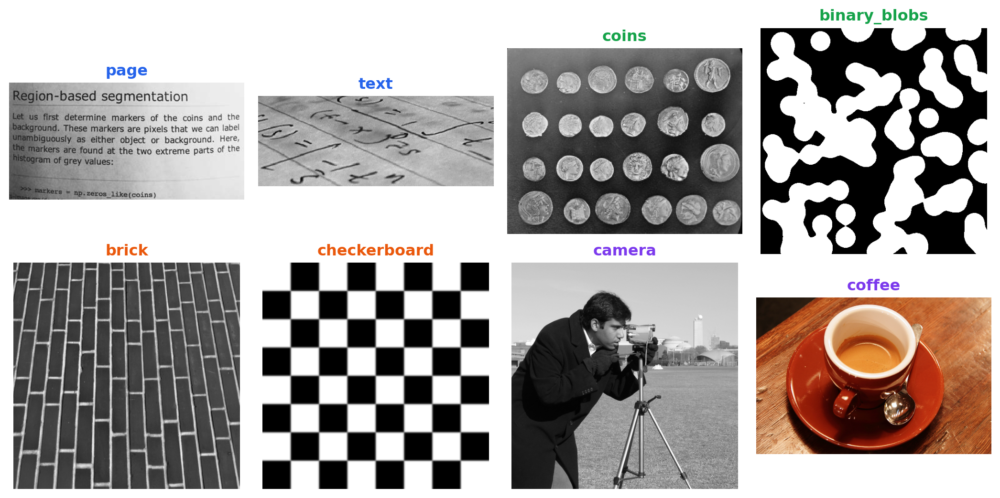

**Figura 6.1:** Campione di immagini pubbliche di *skimage.data*, raggruppate per area di applicazione.


In [4]:
import matplotlib.pyplot as plt
from skimage import data

# Immagini ordinate per categoria; il colore del titolo riproduce il colore della categoria nella tab. precedente
imgs = [
    ("page",         data.page(),         "#2563eb"),   # Documenti & OCR/OMR
    ("text",         data.text(),         "#2563eb"),
    ("coins",        data.coins(),        "#16a34a"),   # Segmentazione & morfologia
    ("binary_blobs", data.binary_blobs(), "#16a34a"),
    ("brick",        data.brick(),        "#ea580c"),   # Texture & ispezione industriale
    ("checkerboard", data.checkerboard(),"#ea580c"),
    ("camera",       data.camera(),       "#7c3aed"),   # Fotografie classiche di PDI/VC
    ("coffee",       data.coffee(),       "#7c3aed"),
]

fig, ax = plt.subplots(2, 4, figsize=(11, 5.5))
for a, (nome, img, cor) in zip(ax.ravel(), imgs):
    a.imshow(img, cmap="gray")
    a.set_title(nome, color=cor, fontweight="bold")
    a.axis("off")
plt.tight_layout()


## 6.4 Normalizzazione del Fondo e Equalizzazione Locale del Contrasto

La qualità della segmentazione dipende direttamente dalle caratteristiche dell'immagine in ingresso. Nei documenti digitalizzati, variazioni di illuminazione, ombre, regioni sovraesposte e differenze di tonalità della carta riducono il contrasto tra il primo piano e lo sfondo, rendendo difficile l'applicazione di metodi di sogliatura globale, come l'algoritmo di Otsu.

Per minimizzare questi effetti, vengono impiegate due tecniche complementari di pre-elaborazione:

- **Normalizzazione del fondo:** stima la componente a bassa frequenza dell'immagine mediante una forte attenuazione e, successivamente, normalizza l'immagine originale rispetto a tale fondo stimato. Questa procedura riduce i gradienti di illuminazione e compensa le variazioni lente di intensità, preservando le strutture di interesse.
- **CLAHE** (*Contrast Limited Adaptive Histogram Equalization*), presentato nel **Capitolo 4:** suddivide l'immagine in piccole regioni (*tiles*) ed esegue l'equalizzazione dell'istogramma di ciascuna regione in modo indipendente. Il contrasto è limitato per evitare un'amplificazione eccessiva del rumore, rendendo la tecnica particolarmente adatta a immagini con variazioni locali di illuminazione.

La [Figura 6.2](#fig-06-clahe-page) confronta queste strategie utilizzando l'immagine `page()` della libreria `skimage.data`. Vengono presentati sei risultati: (a) l'immagine originale; (b) la binarizzazione diretta tramite il metodo di Otsu, utilizzata come riferimento; (c) il fondo stimato tramite filtraggio gaussiano; (d) l'immagine dopo la normalizzazione del fondo; (e) la binarizzazione ottenuta dopo l'applicazione della CLAHE seguita dal metodo di Otsu; e (f) la binarizzazione ottenuta dopo la normalizzazione del fondo seguita dall'applicazione del metodo di Otsu.

Il confronto consente di osservare l'effetto prodotto da ciascuna fase della pre-elaborazione e la sua influenza sulla qualità della segmentazione. In particolare, la normalizzazione del fondo riduce le variazioni globali di illuminazione, mentre la CLAHE aumenta il contrasto locale tra caratteri e sfondo. A seconda delle caratteristiche dell'immagine, l'una o l'altra strategia può produrre risultati superiori, non essendovi una tecnica universalmente più adatta.

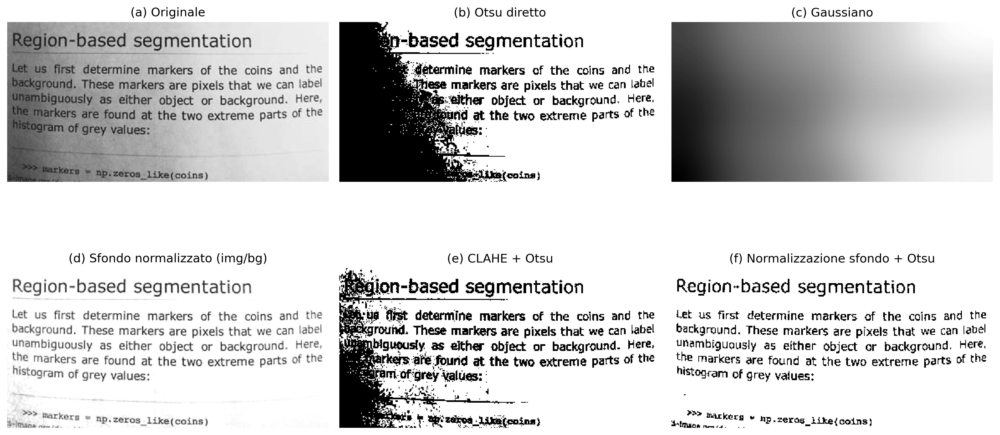

**Figura 6.2:** Confronto tra strategie di preprocessamento per la binarizzazione dell


In [5]:
import cv2
from skimage import data
from morph import mm

img = data.page()  # oppure: img = mm.gray(img_final)  — con l'immagine del foglio di prova

# ── Metodo 1: Normalizzazione dello sfondo + Otsu ────────────────────────────────
# Stima lo sfondo con un filtro gaussiano di sigma grande (variazioni lente di luce)
# e divide pixel per pixel per annullare il gradiente di illuminazione
bg = cv2.GaussianBlur(img, (0, 0), sigmaX=25)
img_norm = cv2.divide(img, bg, scale=255)
img_norm_otsu = mm.threshold(img_norm)

# ── Metodo 2: CLAHE + Otsu ────────────────────────────────────────────────
# tileGridSize definisce la dimensione di ciascuna regione locale (tile)
# clipLimit controlla il limite di amplificazione — valori alti aumentano il contrasto
# ma amplificano anche il rumore
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_clahe = clahe.apply(img)
img_clahe_otsu = mm.threshold(img_clahe)

# ── Metodo 0: Otsu diretto (senza preprocessamento) — riferimento ───────────
img_otsu = mm.threshold(img)

mm.show(
    [img,  img_otsu, bg, img_norm, img_clahe_otsu, img_norm_otsu],
    titles=["(a) Originale", "(b) Otsu diretto", "(c) Gaussiano",  \
            "(d) Sfondo normalizzato (img/bg)", "(e) CLAHE + Otsu", \
            "(f) Normalizzazione sfondo + Otsu"],
    cols=3,
    figsize=(14, 8)
)


> ### 📝 🧠 Perché funziona? — Normalizzazione dello sfondo vs. CLAHE
>
> **Normalizzazione dello sfondo:** dividendo l'immagine per una versione fortemente attenuata
> di sé stessa, si eliminano le variazioni lente di luminosità (gradiente di luce,
> ombra di bordo) senza influire sui dettagli fini — testo, linee, bolle.
> Il risultato è un'immagine con illuminazione approssimativamente uniforme, dove la soglia
> globale di Otsu funziona correttamente su tutta la pagina.
>
> **CLAHE:** un istogramma globale equalizzato "allunga" i toni dell'intera immagine in una
> volta sola — utile quando l'illuminazione è uniforme, ma problematico quando non lo è.
> Il CLAHE suddivide l'immagine in piccoli blocchi (*tiles*) e equalizza ciascuno
> separatamente, con un limite massimo di amplificazione (`clipLimit`) per non amplificare
> il rumore. È particolarmente efficace per evidenziare regioni localmente sottoesposte,
> ma non elimina i gradienti globali — per questo, applicarlo dopo la normalizzazione dello
> sfondo tende a produrre risultati più coerenti.

## 6.5 Riconoscimento Ottico dei Caratteri (OCR)

Dopo la binarizzazione, la fase successiva dell'elaborazione documentale consiste nella conversione della rappresentazione visiva dei caratteri in testo codificato digitalmente, processo denominato **Riconoscimento Ottico dei Caratteri** (*Optical Character Recognition* — **OCR**).

In generale, un sistema OCR comprende tre fasi:

1. **Segmentazione:** identifica righe, parole e caratteri nell'immagine, utilizzando proiezioni orizzontali e verticali o il rilevamento di componenti connessi.
2. **Estrazione delle caratteristiche:** rappresenta ogni carattere tramite attributi visivi, come bordi, curvature e pattern del tratto.
3. **Riconoscimento:** associa gli attributi estratti al carattere più probabile. I sistemi attuali utilizzano prevalentemente reti neurali ricorrenti (LSTM) o architetture basate su *transformer*.

In questo libro si utilizza il **Tesseract OCR**, accessibile tramite la libreria `pytesseract` (installazione: `pip install pytesseract`). Sviluppato originariamente dalla Hewlett-Packard tra il 1985 e il 1995 e attualmente mantenuto da Google, Tesseract è descritto in Smith (2007) e Smith (2013). Nelle versioni recenti, il riconoscimento testuale è realizzato da reti neurali LSTM.

Le prestazioni dell'OCR dipendono dalla qualità dell'immagine di input. Rumore, basso contrasto, distorsioni geometriche e illuminazione irregolare riducono il tasso di riconoscimento. Per questo motivo, fasi come la rettifica, la normalizzazione dello sfondo e l'equalizzazione adattiva (CLAHE) integrano la pre-elaborazione dell'immagine.

> ### 📝 🧠 Il Tesseract necessita di un'immagine binarizzata?
>
> Il Tesseract incorpora internamente una fase di binarizzazione adattiva prima del riconoscimento dei caratteri. Per questo motivo, fornire all'OCR un'immagine precedentemente binarizzata non sempre produce i migliori risultati.
>
> Poiché la sogliatura è un'operazione irreversibile, essa può eliminare variazioni sottili di intensità sui bordi dei caratteri, come l'*antialiasing*, che possono aiutare il meccanismo di riconoscimento. In molti casi, un'immagine in scala di grigi, con buona illuminazione e contrasto, produce una trascrizione più fedele rispetto alla sua versione binarizzata.

Per indagare questo effetto, si confronta il testo estratto da Tesseract a partire da quattro versioni della stessa immagine, presentate nella [Figura 6.3](#fig-06-ocr-comparacao): (a) immagine originale; (b) immagine sottoposta a equalizzazione adattiva (CLAHE) seguita dalla sogliatura con il metodo di Otsu; (c) immagine sottoposta a normalizzazione dello sfondo seguita dalla sogliatura con il metodo di Otsu; e (d) immagine sottoposta solo alla normalizzazione dello sfondo, preservando i toni di grigio.

Il confronto tra le versioni (c) e (d) mostra che, in tratti contenenti caratteri visivamente simili, la versione in scala di grigi (d) ha prodotto una trascrizione più fedele al testo originale rispetto alla versione binarizzata (c). Questo risultato indica che la sogliatura applicata nella pre-elaborazione può eliminare informazioni utili al riconoscimento. Pertanto, sebbene la binarizzazione sia essenziale per diverse operazioni di elaborazione delle immagini, essa non costituisce necessariamente il miglior input per l'OCR. La scelta della tecnica di pre-elaborazione deve considerare la fase successiva del *pipeline* documentale.

--- (a) Original ---
[Tesseract OCR indisponivel neste ambiente - texto omitido] 

--- (b) CLAHE + Otsu ---
[Tesseract OCR indisponivel neste ambiente - texto omitido] 

--- (c) Normaliz. fundo + Otsu ---
[Tesseract OCR indisponivel neste ambiente - texto omitido] 

--- (d) Normaliz. fundo (tons de cinza) ---
[Tesseract OCR indisponivel neste ambiente - texto omitido] 



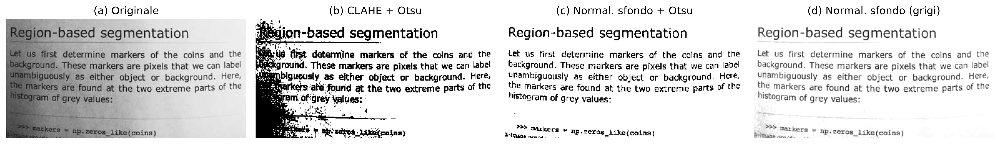

**Figura 6.3:** Confronto del testo estratto da Tesseract da quattro versioni della stessa immagine: (a) immagine originale; (b) CLAHE seguito da sogliatura di Otsu; (c) normalizzazione dello sfondo seguita da sogliatura di Otsu; e (d) normalizzazione dello sfondo in scala di grigi, senza sogliatura. Il confronto evidenzia che la binarizzazione esterna non sempre favorisce il riconoscimento, poiché Tesseract esegue già internamente la propria binarizzazione adattiva.


In [6]:
import pytesseract
import shutil as _sh
if _sh.which("tesseract") is None:
    # Ambiente di build senza Tesseract installato (es.: senza apt/sudo):
    # degrada invece di rompere il render. Su Colab/locale con Tesseract,
    # non cambia nulla.
    _AVISO_OCR = "[Tesseract OCR indisponivel neste ambiente - texto omitido]"
    pytesseract.image_to_string = lambda *a, **k: _AVISO_OCR
from skimage import data
import cv2
from morph import mm

img = data.page()

# ── Riutilizzando i risultati della sezione precedente ────────────────────────
img_otsu = mm.threshold(img)

bg = cv2.GaussianBlur(img, (0, 0), sigmaX=25)
img_norm = cv2.divide(img, bg, scale=255)       # scala di grigi, senza Otsu
img_norm_otsu = mm.threshold(img_norm)          # binarizzata

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_clahe = clahe.apply(img)
img_clahe_otsu = mm.threshold(img_clahe)

# ── Configurazione di Tesseract ──────────────────────────────────────────────
# --psm 6: assume un unico blocco uniforme di testo (adatto all'immagine `page`)
config = "--psm 6"

texto_original   = pytesseract.image_to_string(img, config=config)
texto_clahe_otsu = pytesseract.image_to_string(img_clahe_otsu, config=config)
texto_norm_otsu  = pytesseract.image_to_string(img_norm_otsu, config=config)
texto_norm_gray  = pytesseract.image_to_string(img_norm, config=config)

for nome, texto in zip(
    ["(a) Original", "(b) CLAHE + Otsu", "(c) Normaliz. fundo + Otsu", 
     "(d) Normaliz. fundo (tons de cinza)"],
    [texto_original, texto_clahe_otsu, texto_norm_otsu, texto_norm_gray]
):
    print(f"--- {nome} ---")
    print(texto.strip(), "\n")

mm.show(
    [img, img_clahe_otsu, img_norm_otsu, img_norm],
    titles=["(a) Originale", "(b) CLAHE + Otsu", "(c) Normal. sfondo + Otsu", 
            "(d) Normal. sfondo (grigi)"],
    cols=4,
    figsize=(16, 4)
)

> ### 📝 🧠 Perché il preprocessamento migliora l’OCR?
>
> Le prestazioni dell’OCR dipendono direttamente dalla qualità dell’immagine in ingresso. Basso contrasto, illuminazione non uniforme, rumore e distorsioni geometriche rendono difficile la separazione tra testo e sfondo e aumentano la probabilità di errori di riconoscimento.
>
> Tecniche come la normalizzazione dello sfondo e l’equalizzazione adattiva (CLAHE) correggono i gradienti di illuminazione e migliorano il contrasto locale tra i caratteri e lo sfondo, producendo immagini più adatte al riconoscimento automatico. La sogliatura, d’altro canto, deve essere applicata con cautela: trattandosi di un’operazione irreversibile, può eliminare variazioni sottili di intensità sui bordi dei caratteri — come l’*antialiasing* — che il motore OCR stesso utilizza internamente per risolvere ambiguità tra simboli visivamente simili. Per questo motivo, immagini in scala di grigi, corrette solo per quanto riguarda l’illuminazione, spesso producono trascrizioni più fedeli rispetto alle loro versioni binarizzate.
>
> Nei documenti acquisiti tramite fotocamere di dispositivi mobili, il preprocessamento tende a offrire un maggiore guadagno di prestazioni rispetto ai documenti digitalizzati con *scanner*, nei quali l’illuminazione è solitamente più uniforme.

## 6.6 Traduzione Automatica del Testo Riconosciuto

Dopo il riconoscimento ottico dei caratteri, il testo ottenuto può essere sottoposto a tecniche di elaborazione del linguaggio naturale, come correzione ortografica, indicizzazione, riassunzione e traduzione automatica.

La traduzione automatica costituisce una fase indipendente dall'OCR. Mentre l'OCR converte i caratteri presenti nell'immagine in testo codificato, la traduzione opera su tale testo nella lingua originale del documento. In questo modo, errori di riconoscimento possono essere propagati alla traduzione, compromettendo la qualità del risultato. I sistemi attuali di traduzione automatica utilizzano prevalentemente architetture neurali basate su meccanismi di attenzione e *transformer* [@Bahdanau2015; Vaswani (2017)].

In questo esempio, si utilizza il testo ottenuto dall'immagine sottoposta solo alla normalizzazione dello sfondo, senza sogliatura (punto **d** della [Figura 6.3](#fig-06-ocr-comparacao)), poiché presenta la trascrizione più fedele tra le strategie valutate nella sezione precedente.

La traduzione è realizzata tramite la libreria `deep-translator` (installazione: `pip install deep-translator`), che fornisce un'interfaccia per diversi servizi di traduzione automatica, incluso Google Translate.

--- Testo originale generato dall'immagine normalizzata in toni di grigio (OCR, EN) ---
[Tesseract OCR indisponivel neste ambiente - texto omitido]

--- Testo tradotto (PT-BR) ---
[Tradução indisponível neste ambiente - Tesseract OCR ausente]


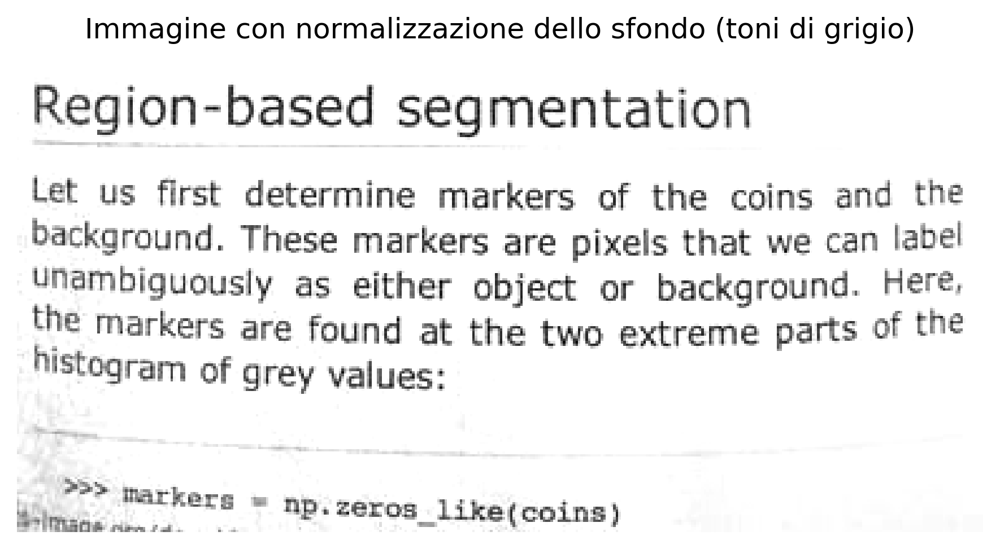

**Figura 6.4:** Flusso di riconoscimento e traduzione automatica. L


In [7]:
from deep_translator import GoogleTranslator
import shutil as _sh

# Testo ottenuto dall'OCR dall'immagine con normalizzazione dello sfondo (toni di grigio)
texto_en = texto_norm_gray

if _sh.which("tesseract") is None:
    # Ambiente di build senza Tesseract installato (vedi cella precedente): testo_en
    # è già il segnaposto di OCR non disponibile, non testo reale — salta la traduzione
    # invece di fallire cercando di tradurre una stringa che non è realmente inglese.
    texto_pt = "[Tradução indisponível neste ambiente - Tesseract OCR ausente]"
else:
    texto_pt = GoogleTranslator(source="en", target="pt").translate(texto_en)

print("--- Testo originale generato dall'immagine normalizzata in toni di grigio (OCR, EN) ---")
print(texto_en)

print("\n--- Testo tradotto (PT-BR) ---")
print(texto_pt)

mm.show(
    [img_norm],
    titles=["Immagine con normalizzazione dello sfondo (toni di grigio)"],
    cols=1,
    figsize=(6, 4)
)

> ### 📝 🧠 Perché la qualità dell'OCR influenza la traduzione?
>
> La traduzione automatica utilizza come input il testo prodotto dall'OCR. Gli errori di riconoscimento, come caratteri errati, parole incomplete o frammentate, vengono propagati alla fase di traduzione e possono alterare il significato del testo.
>
> Di conseguenza, la qualità della traduzione dipende direttamente dalla fedeltà della trascrizione ottenuta tramite OCR. Come discusso in precedenza, tale fedeltà non è sempre massimizzata da una binarizzazione esterna: le immagini in scala di grigi, corrette solo per quanto riguarda l'illuminazione, possono preservare informazioni rilevanti per la distinzione tra caratteri visivamente simili. Pertanto, la pre-elaborazione dell'immagine — e la scelta adeguata delle sue fasi in funzione del compito successivo — contribuisce a migliorare non solo il riconoscimento dei caratteri, ma anche le prestazioni delle fasi successive di elaborazione del linguaggio naturale, come traduzione, indicizzazione e riassunto.

## 6.7 Fondamenti di OMR e Ispezione Industriale

Il **Riconoscimento Ottico di Marcature** (*Optical Mark Recognition* — OMR) è una tecnica di Visione Artificiale destinata all'identificazione automatica di marcature in posizioni precedentemente definite di un modulo. Le sue applicazioni includono fogli di risposta, questionari, moduli amministrativi e altri documenti strutturati.

A differenza dell'OCR (*Optical Character Recognition*), che riconosce caratteri e parole, l'OMR determina la presenza, l'assenza o l'intensità delle marcature in regioni precedentemente note. Invece di interpretare il testo, sfrutta proprietà geometriche e statistiche associate alla compilazione di tali regioni.

I moderni sistemi OMR elaborano immagini acquisite da *scanner*, fotocamere o dispositivi mobili, automatizzando attività che in precedenza dipendevano da apparecchiature specializzate.

In generale, un sistema OMR comprende le seguenti fasi:

1. **Acquisizione:** conversione del documento fisico in formato digitale;
2. **Pre-elaborazione:** correzione geometrica, riduzione del rumore e binarizzazione;
3. **Localizzazione delle regioni di interesse:** identificazione delle aree destinate alle marcature;
4. **Analisi delle marcature:** valutazione della compilazione delle regioni candidate;
5. **Interpretazione:** conversione delle marcature in risposte o dati strutturati.

Questi principi si estendono naturalmente all'**Ispezione Industriale Automatizzata**.
Nelle linee di produzione, la stessa sequenza — acquisizione, pre-elaborazione,
segmentazione, estrazione delle caratteristiche e decisione — viene impiegata per
rilevare difetti superficiali, verificare l'integrità dei componenti e
misurare dimensioni con precisione subpixel. La differenza risiede nel dominio di
applicazione: mentre l'OMR opera su documenti con struttura predefinita,
l'ispezione industriale gestisce oggetti le cui variazioni geometriche e
radiometriche devono essere modellate in modo più flessibile.

Nelle sezioni successive, entrambe le applicazioni vengono sviluppate attraverso
progetti pratici che riproducono fasi tipiche dei sistemi reali.

## 6.8 Progetti Pratici: Costruzione di un *Pipeline* di Analisi Documentale

I concetti di questo capitolo verranno sviluppati attraverso progetti che riproducono fasi tipiche dei sistemi reali di analisi documentale, introducendo tecniche riutilizzabili in applicazioni di OCR, OMR, ispezione visiva e elaborazione di moduli.

### 6.8.1 Allineamento Automatico dei Documenti (*OCR/OMR Pre-processing*)

La correzione dell'inclinazione (*deskew*) è una fase fondamentale nell'elaborazione dei documenti. Le rotazioni introdotte durante la digitalizzazione o l'acquisizione compromettono la localizzazione delle regioni di interesse e riducono la precisione delle fasi successive.

In questo progetto verrà sviluppato un sistema per stimare automaticamente l'orientamento predominante del documento e correggerne l'inclinazione. A tal fine, verranno impiegate tecniche classiche di rilevamento dei bordi con l'operatore di Canny e il rilevamento delle linee tramite la Trasformata di Hough. A partire dalle linee identificate, verrà stimato l'angolo di rotazione e applicata una trasformazione affine per produrre una versione allineata del documento.

Poiché moduli e fogli di risposta vengono spesso distribuiti in formato PDF, il *pipeline* inizia con la rasterizzazione di ogni pagina, convertendola in un'immagine matriciale. In questo capitolo, tale fase verrà eseguita con la libreria `pdf2image`, generando immagini PNG con risoluzione di 300 DPI (*dots per inch*). A partire da esse, potranno essere applicate le tecniche di rilevamento dei bordi, Trasformata di Hough, segmentazione, estrazione dei contorni e riconoscimento automatico dei pattern studiate nel corso del capitolo.

PDF dei fogli di prova digitalizzati: dados/provas_qrcode_EP.pdf


[INGESTIONE] Pagina PDF convertita con successo: test01.png


[INGESTIONE] Pagina PDF convertita con successo: test02.png


[INGESTIONE] Pagina PDF convertita con successo: test03.png


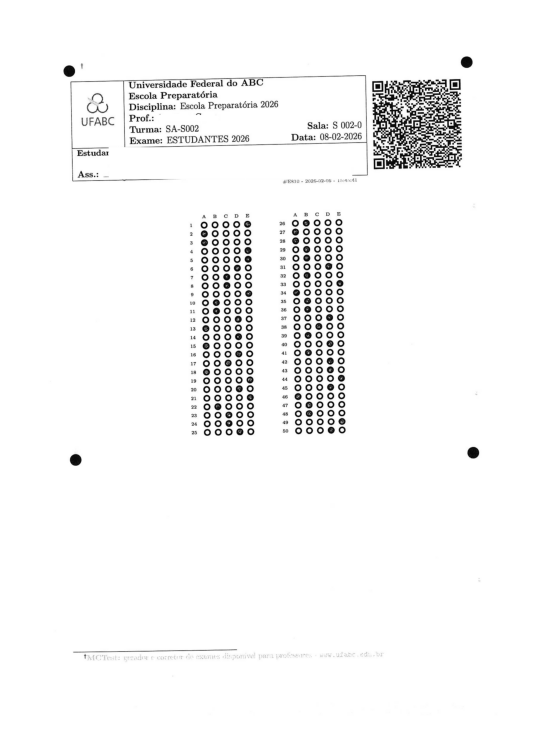

**Figura 6.5:** *Pipeline* di ingestione dei documenti: rasterizzazione adattiva delle pagine PDF in matrici discrete in formato PNG, mostrando la seconda pagina.


In [8]:
import os
import urllib.request
from pdf2image import convert_from_path
from skimage import data
import cv2

# Directory dei microdati e dei fogli di risposta dell'esame istituzionale
file_path = "dados/provas_qrcode_EP.pdf"
url_github = (
    "https://raw.githubusercontent.com/fzampirolli/"
    "pdi-vc/master/all/cap06/dados/provas_qrcode_EP.pdf"
)

# Se il file non esiste localmente, viene scaricato automaticamente da GitHub
if not os.path.exists(file_path):
    print(f"[DOWNLOAD] Download del PDF da GitHub: {url_github}")
    try:
        # Assicura che la cartella 'dati' esista prima di salvare
        os.makedirs(os.path.dirname(file_path), exist_ok=True)
        urllib.request.urlretrieve(url_github, file_path)
        print("[DOWNLOAD] PDF scaricato con successo!")
    except Exception as e:
        print(f"[DOWNLOAD] Errore durante il download del file: {e}")

print(f"PDF dei fogli di prova digitalizzati: {file_path}")

if os.path.exists(file_path):
    # Rasterizzazione delle pagine con risoluzione ottimizzata di 300 DPI
    pages = convert_from_path(file_path, dpi=300)
    for i, page in enumerate(pages):
        saida = f"test{i+1:02d}.png"
        page.save(saida)
        print(f"[INGESTIONE] Pagina PDF convertita con successo: {saida}")
else:
    print("[AVVISO] File PDF non trovato nel percorso. Attivazione del fallback tramite skimage.data.")
    # Inietta la matrice di testo pubblica per garantire l'esecuzione continua della pipeline
    img_fallback = data.text()
    cv2.imwrite("test02.png", img_fallback)
    print("[INGESTIONE] Immagine di fallback strutturata: test02.png")

# Carica e mostra l'immagine rasterizzata iniziale utilizzando l'ecosistema morph
if os.path.exists('test02.png'):
    img_original = mm.read('test02.png')
else:
    # Fallback definitivo nel caso in cui anche skimage fallisca
    img_original = np.ones((400, 400), dtype=np.uint8) * 255

mm.show(img_original, figsize=(4, 3))

### 6.8.2 Algoritmo di Rettifica dell'Inclinazione (*Deskew*)

La fase di *deskew* ha come obiettivo stimare e correggere l'inclinazione globale di un documento digitalizzato, allineando il suo contenuto agli assi dell'immagine. La [Figura 6.7](#fig-06-comparativo-pipeline) presenta il flusso completo di elaborazione, dall'immagine originale fino al risultato dopo la correzione geometrica. In modo complementare, il simulatore della [Figura 6.6](#fig-06-sim-06-deskew) consente di visualizzare il funzionamento della Trasformata di Hough e di comprendere come viene stimata l'orientazione predominante.

La procedura è composta da tre fasi principali:

1. rilevamento dei bordi tramite l'operatore di Canny;
2. stima dell'orientazione predominante mediante la Trasformata di Hough Lineare;
3. correzione dell'inclinazione utilizzando una trasformazione affine di rotazione.

Dopo la rettifica, il documento presenta un'orientazione approssimativamente orizzontale, favorendo le fasi successive di segmentazione, etichettatura delle componenti connesse e riconoscimento di caratteri e marcatori.

### 6.8.3 Modellazione Matematica

Le sottosezioni seguenti formalizzano, in termini matematici, le fasi precedentemente descritte, mettendo in relazione il gradiente dell'immagine, la parametrizzazione delle rette nello spazio di Hough e la matrice di rotazione impiegata nella correzione geometrica.

#### 6.8.3.1 Rilevamento dei Bordi

Inizialmente, l'immagine viene levigata tramite un filtro gaussiano, riducendo l'effetto dei rumori ad alta frequenza che possono generare bordi spurî. I concetti di filtraggio spaziale e convoluzione sono stati presentati nel **Capitolo 3**.

Successivamente, l'operatore di Canny stima il gradiente dell'immagine. Siano $f(x,y)$ l'intensità dell'immagine e $\alpha$ l'angolo di rotazione.

La magnitudine del gradiente è data da

$$
|\nabla f(x,y)| =
\sqrt{
\left(\frac{\partial f}{\partial x}\right)^2 +
\left(\frac{\partial f}{\partial y}\right)^2
}.
$$

dove:

- $f(x,y)$ rappresenta l'intensità dell'immagine nella posizione $(x,y)$;
- $\frac{\partial f}{\partial x}$ e $\frac{\partial f}{\partial y}$ sono le derivate parziali nelle direzioni orizzontale e verticale;
- $|\nabla f(x,y)|$ è la magnitudine del gradiente.

Dopo il calcolo del gradiente, l'algoritmo applica la soppressione dei non massimi (*non-maximum suppression*) e la sogliatura per isteresi, producendo un'immagine binaria contenente i principali bordi del documento.

#### 6.8.3.2 Trasformata di Hough

L'immagine binaria dei bordi viene elaborata tramite la Trasformata di Hough Lineare, il cui obiettivo è rilevare strutture approssimativamente rettilinee. Invece della rappresentazione cartesiana della retta, $y=ax+b$, si utilizza la rappresentazione in forma normale,

$$
\rho = x\cos\theta + y\sin\theta,
$$

dove:

- $x$ e $y$ sono le coordinate di un punto appartenente alla retta;
- $\rho$ è la distanza perpendicolare tra la retta e l'origine del sistema di coordinate dell'immagine;
- $\theta$ è l'angolo formato tra la normale alla retta e l'asse orizzontale dell'immagine.

In questa rappresentazione, ogni punto di bordo $(x,y)$ genera una curva nello spazio dei parametri $(\rho,\theta)$. L'intersezione delle curve prodotte dai punti appartenenti alla stessa retta origina massimi in una matrice bidimensionale denominata **accumulatore**. Pertanto, i picchi dell'accumulatore corrispondono alle rette predominanti dell'immagine, come i bordi del documento, le linee dei moduli o le righe di testo.

Per stimare l'inclinazione globale del documento, si considerano solamente le rette i cui angoli soddisfano

$$
-45^\circ \leq \theta \leq 45^\circ.
$$

Questa restrizione elimina orientamenti incompatibili con la disposizione attesa del documento e riduce l'influenza di rette verticali o di strutture irrilevanti. Sia $\theta_1,\theta_2,\ldots,\theta_n$ l'insieme degli angoli delle rette selezionate. La stima dell'inclinazione globale si ottiene mediante la mediana,

$$
\hat{\theta}=
\operatorname{med}\left(\theta_1,\theta_2,\ldots,\theta_n\right),
$$

dove:

- $\theta_i$ è l'angolo della $i$-esima retta rilevata dalla Trasformata di Hough;
- $n$ è il numero di rette considerate dopo il filtraggio angolare;
- $\hat{\theta}$ è la stima dell'inclinazione globale del documento.

La mediana viene adottata perché è meno sensibile alla presenza di rilevamenti isolati (*outlier*) rispetto alla media aritmetica, producendo una stima più stabile dell'orientamento predominante.

#### 6.8.3.3 Rotazione Affine

Sia $\hat{\theta}$ l'inclinazione stimata nella fase precedente. La correzione geometrica consiste nell'applicare una trasformazione affine di rotazione attorno al centro dell'immagine, affinché l'orientamento predominante coincida con l'asse orizzontale. Le trasformazioni affini sono state studiate nel **Capitolo 2**, insieme alle operazioni di traslazione, scala, taglio e rotazione.

Sia $(x,y)$ la posizione di un pixel rispetto al centro dell'immagine e $(x',y')$ la sua posizione dopo la rotazione. La trasformazione è descritta da
$$
\begin{bmatrix}
x'\\
y'
\end{bmatrix} =
R(\alpha)
\begin{bmatrix}
x\\
y
\end{bmatrix},
$$

dove

$$
R(\alpha)=
\begin{bmatrix}
\cos\alpha & -\sin\alpha\\
\sin\alpha & \cos\alpha
\end{bmatrix},
$$

essendo:

- $(x,y)$ le coordinate originali del pixel rispetto al centro dell'immagine;
- $(x',y')$ le coordinate del pixel dopo la rotazione;
- $\alpha$ l'angolo di rotazione applicato per compensare l'inclinazione stimata del documento;
- $R(\alpha)$ la matrice di rotazione.

In pratica, l'angolo applicato corrisponde all'opposto dell'inclinazione stimata,

$$
\alpha = -\hat{\theta},
$$

dove $\hat{\theta}$ rappresenta l'orientamento predominante ottenuto tramite la Trasformata di Hough.

Poiché le coordinate trasformate non sempre coincidono con posizioni intere della griglia di pixel, è necessario ricampionare l'immagine per determinare i nuovi valori di intensità. Nell'implementazione presentata in questo capitolo, la funzione `mm.rotate` esegue questa operazione utilizzando l'interpolazione bicubica, riducendo gli artefatti di ricampionamento e preservando la continuità visiva di bordi e caratteri.

In [9]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-06-deskew" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-06-deskew * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-06-deskew canvas { display: block; max-width: 100%; height: auto; border-radius: 8px; border: 1px solid #e4dcc8; background: #ffffff; margin: 0 auto; }
  #sim-06-deskew button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; display: inline-flex; align-items: center; justify-content: center; gap: 5px; transition: all 0.15s ease; font-weight: 600; }
  #sim-06-deskew button:hover { background: #e8dfcf; }
  #sim-06-deskew button.dsk_active { background: #26241d !important; border-color: #26241d !important; color: #7ee7c6 !important; }
  #sim-06-deskew .dsk_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .dsk_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .dsk_grid_stats { display: grid; grid-template-columns: repeat(3, 1fr); gap: 10px; margin-bottom: 14px; }
  .dsk_stat_box { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 10px; padding: 10px; text-align: center; }
  .dsk_stat_label { font-size: 9.5px; color: #8a8371; text-transform: uppercase; letter-spacing: 0.04em; margin-bottom: 2px; font-weight: 700; }
  .dsk_stat_value { font-size: 16px; font-weight: 700; font-family: monospace; color: #26241d; }
  .dsk_canvases { display: flex; gap: 12px; flex-wrap: wrap; justify-content: center; align-items: flex-start; }
  .dsk_cv_wrap { flex: 1; min-width: 200px; background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 10px; text-align: center; }
  .dsk_cv_label { font-size: 11px; color: #5e5a4a; margin-bottom: 6px; font-weight: 700; }
  .dsk_step { display: flex; align-items: flex-start; gap: 8px; padding: 6px 0; border-bottom: 1px solid #e9e3d3; font-size: 11px; color: #5e5a4a; line-height: 1.4; }
  .dsk_step:last-child { border-bottom: none; }
  .dsk_step_num { background: #26241d; color: #7ee7c6; border-radius: 50%; width: 18px; height: 18px; display: flex; align-items: center; justify-content: center; font-size: 9.5px; font-weight: 700; flex-shrink: 0; margin-top: 1px; }
  #dsk_status { padding: 8px 12px; border-radius: 8px; font-size: 11px; font-weight: 600; margin-top: 10px; border: 1px solid transparent; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🔄 Simulatore: Correzione dell'Inclinazione (Deskew)</span>
  <span class="dsk_pill">Canny → Hough → Rotazione</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Estatísticas -->
  <div class="dsk_grid_stats">
    <div class="dsk_stat_box">
      <div class="dsk_stat_label">Angolo Reale</div>
      <div id="dsk_angReal" class="dsk_stat_value" style="color:#2980b9;">0.0°</div>
    </div>
    <div class="dsk_stat_box">
      <div class="dsk_stat_label">Stimato (Hough)</div>
      <div id="dsk_angHough" class="dsk_stat_value" style="color:#b9770e;">0.0°</div>
    </div>
    <div class="dsk_stat_box">
      <div class="dsk_stat_label">Errore Residuo</div>
      <div id="dsk_angErr" class="dsk_stat_value" style="color:#27ae60;">0.0°</div>
    </div>
  </div>

  <!-- Controle do Slider -->
  <div class="dsk_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:6px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Inclinazione Applicata: <span id="dsk_slVal" style="font-family:monospace; color:#26241d;">0.0°</span>
      </label>
      <button id="dsk_resetBtn">↺ Ripristina</button>
    </div>
    <input type="range" id="dsk_slider" min="-15" max="15" step="0.5" value="0" style="width:100%; cursor:pointer; accent-color:#26241d;">
  </div>

  <!-- Exibição Visual dos Canvases -->
  <div class="dsk_canvases">
    <div class="dsk_cv_wrap">
      <div class="dsk_cv_label">📄 Originale Inclinato</div>
      <canvas id="dsk_cvOrig" width="220" height="150"></canvas>
    </div>
    <div class="dsk_cv_wrap">
      <div class="dsk_cv_label">🔍 Bordi Canny</div>
      <canvas id="dsk_cvCanny" width="220" height="150"></canvas>
    </div>
    <div class="dsk_cv_wrap">
      <div class="dsk_cv_label">✅ Corretto (Deskewed)</div>
      <canvas id="dsk_cvFixed" width="220" height="150"></canvas>
    </div>
  </div>

  <!-- Pipeline de Processamento explicativo -->
  <div class="dsk_panel" style="margin-top:14px;">
    <div style="font-size:11px; font-weight:700; color:#5e5a4a; margin-bottom:8px;">
      🧠 Pipeline di Elaborazione
    </div>
    <div class="dsk_step">
      <div class="dsk_step_num">1</div>
      <div><strong>Canny:</strong> Rileva i bordi dei segmenti di testo — pixel ad alto gradiente che formano i contorni delle righe.</div>
    </div>
    <div class="dsk_step">
      <div class="dsk_step_num">2</div>
      <div><strong>Hough:</strong> Ogni pixel di bordo vota per le rette associate. La <em>mediana</em> degli angoli delle rette con più voti stima l'inclinazione globale.</div>
    </div>
    <div class="dsk_step">
      <div class="dsk_step_num">3</div>
      <div><strong>Rotazione Inversa:</strong> Applica la trasformazione affine con l'angolo opposto stimato, riorientando il documento in orizzontale.</div>
    </div>
    <div id="dsk_status">–</div>
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Deskew(root){
    if (!root || root.dataset.sim06DeskewInit) return;
    root.dataset.sim06DeskewInit = "1";

    const dsk_ROWS = 80, dsk_COLS = 120;

    // Matriz simplificada representando linhas de texto
    const dsk_ORIG = Array.from({length: dsk_ROWS}, (_, r) => {
      const arr = new Array(dsk_COLS).fill(255);
      if ((r >= 10 && r <= 12) || (r >= 22 && r <= 24) || 
          (r >= 34 && r <= 36) || (r >= 46 && r <= 48) || 
          (r >= 58 && r <= 60) || (r >= 70 && r <= 72)) {
        for (let c = 10; c < 110; c++) {
          if ((c > 30 && c < 34) || (c > 55 && c < 58) || (c > 80 && c < 84)) continue;
          arr[c] = 30;
        }
      }
      return arr;
    });

    function dsk_bilinear(img, rows, cols, fy, fx) {
      const y0 = Math.floor(fy), x0 = Math.floor(fx);
      const y1 = Math.min(y0 + 1, rows - 1), x1 = Math.min(x0 + 1, cols - 1);
      const dy = fy - y0, dx = fx - x0;
      const v00 = img[Math.max(0, y0)][Math.max(0, x0)];
      const v01 = img[Math.max(0, y0)][x1];
      const v10 = img[y1][Math.max(0, x0)];
      const v11 = img[y1][x1];
      return v00 * (1 - dy) * (1 - dx) + v01 * (1 - dy) * dx + v10 * dy * (1 - dx) + v11 * dy * dx;
    }

    function dsk_rotate(img, angleDeg) {
      const rad = angleDeg * Math.PI / 180;
      const cos = Math.cos(rad), sin = Math.sin(rad);
      const cy = dsk_ROWS / 2, cx = dsk_COLS / 2;
      const out = Array.from({length: dsk_ROWS}, () => new Float32Array(dsk_COLS).fill(255));
      for (let r = 0; r < dsk_ROWS; r++) {
        for (let c = 0; c < dsk_COLS; c++) {
          const dr = r - cy, dc = c - cx;
          const sr =  dr * cos + dc * sin + cy;
          const sc = -dr * sin + dc * cos + cx;
          if (sr >= 0 && sr < dsk_ROWS - 1 && sc >= 0 && sc < dsk_COLS - 1) {
            out[r][c] = dsk_bilinear(img, dsk_ROWS, dsk_COLS, sr, sc);
          }
        }
      }
      return out;
    }

    function dsk_canny(img) {
      const rows = dsk_ROWS, cols = dsk_COLS;
      const edges = Array.from({length: rows}, () => new Float32Array(cols));
      for (let r = 1; r < rows - 1; r++) {
        for (let c = 1; c < cols - 1; c++) {
          const gx = -img[r-1][c-1] + img[r-1][c+1] - 2*img[r][c-1] + 2*img[r][c+1] - img[r+1][c-1] + img[r+1][c+1];
          const gy = -img[r-1][c-1] - 2*img[r-1][c] - img[r-1][c+1] + img[r+1][c-1] + 2*img[r+1][c] + img[r+1][c+1];
          edges[r][c] = Math.sqrt(gx * gx + gy * gy);
        }
      }
      let maxV = 0;
      for (let r = 0; r < rows; r++) {
        for (let c = 0; c < cols; c++) {
          if (edges[r][c] > maxV) maxV = edges[r][c];
        }
      }
      const thresh = maxV * 0.3;
      const bin = Array.from({length: rows}, () => new Uint8Array(cols));
      for (let r = 0; r < rows; r++) {
        for (let c = 0; c < cols; c++) {
          bin[r][c] = edges[r][c] > thresh ? 1 : 0;
        }
      }
      return bin;
    }

    function dsk_hough(angleDeg) {
      const noise = (Math.random() - 0.5) * 0.6;
      return Math.round((angleDeg + noise) * 2) / 2;
    }

    function dsk_drawImg(canvas, img, isEdge) {
      const ctx = canvas.getContext('2d');
      const W = canvas.width, H = canvas.height;
      const imgData = ctx.createImageData(W, H);
      const scaleR = dsk_ROWS / H, scaleC = dsk_COLS / W;

      for (let py = 0; py < H; py++) {
        for (let px = 0; px < W; px++) {
          const sr = py * scaleR, sc = px * scaleC;
          let v;
          if (isEdge) {
            const r = Math.floor(sr), c = Math.floor(sc);
            v = (r < dsk_ROWS && c < dsk_COLS && img[r][c]) ? 0 : 255;
          } else {
            v = Math.min(255, Math.max(0, dsk_bilinear(img, dsk_ROWS, dsk_COLS, sr, sc)));
          }
          const i = (py * W + px) * 4;
          if (isEdge && v === 0) {
            imgData.data[i] = 185; imgData.data[i+1] = 119; imgData.data[i+2] = 14; imgData.data[i+3] = 255; // Tom em Destaque (#b9770e)
          } else {
            imgData.data[i] = v; imgData.data[i+1] = v; imgData.data[i+2] = v; imgData.data[i+3] = 255;
          }
        }
      }
      ctx.putImageData(imgData, 0, 0);

      if (!isEdge && canvas.id === 'dsk_cvFixed') {
        ctx.strokeStyle = 'rgba(41, 128, 185, 0.25)';
        ctx.lineWidth = 1;
        ctx.setLineDash([4, 4]);
        for (let i = 1; i < 5; i++) {
          ctx.beginPath(); ctx.moveTo(0, H * i / 5); ctx.lineTo(W, H * i / 5); ctx.stroke();
        }
        ctx.setLineDash([]);
      }
    }

    function dsk_drawAngleLine(canvas, angleDeg) {
      const ctx = canvas.getContext('2d');
      const W = canvas.width, H = canvas.height;
      const rad = angleDeg * Math.PI / 180;
      const cx = W / 2, cy = H / 2, len = W * 0.7;
      ctx.save();
      ctx.strokeStyle = '#c0392b';
      ctx.lineWidth = 1.5;
      ctx.setLineDash([5, 3]);
      ctx.beginPath();
      ctx.moveTo(cx - Math.cos(rad) * len / 2, cy - Math.sin(rad) * len / 2);
      ctx.lineTo(cx + Math.cos(rad) * len / 2, cy + Math.sin(rad) * len / 2);
      ctx.stroke();
      ctx.restore();
    }

    function dsk_update() {
      const slider = root.querySelector('#dsk_slider');
      const angle = parseFloat(slider.value);
      root.querySelector('#dsk_slVal').textContent = (angle >= 0 ? '+' : '') + angle.toFixed(1) + '°';
      root.querySelector('#dsk_angReal').textContent = (angle >= 0 ? '+' : '') + angle.toFixed(1) + '°';

      const rotated = dsk_rotate(dsk_ORIG, angle);
      dsk_drawImg(root.querySelector('#dsk_cvOrig'), rotated, false);
      dsk_drawAngleLine(root.querySelector('#dsk_cvOrig'), angle);

      const edges = dsk_canny(rotated);
      dsk_drawImg(root.querySelector('#dsk_cvCanny'), edges, true);
      dsk_drawAngleLine(root.querySelector('#dsk_cvCanny'), angle);

      const houghEst = Math.abs(angle) < 0.3 ? 0 : dsk_hough(angle);
      root.querySelector('#dsk_angHough').textContent = (houghEst >= 0 ? '+' : '') + houghEst.toFixed(1) + '°';
      
      const err = Math.abs(angle - houghEst);
      const errEl = root.querySelector('#dsk_angErr');
      errEl.textContent = err.toFixed(1) + '°';
      errEl.style.color = err < 1 ? '#27ae60' : err < 3 ? '#b9770e' : '#c0392b';

      const corrected = dsk_rotate(rotated, -houghEst);
      dsk_drawImg(root.querySelector('#dsk_cvFixed'), corrected, false);

      const st = root.querySelector('#dsk_status');
      if (Math.abs(angle) < 0.3) {
        st.style.background = '#eafaf1'; st.style.borderColor = '#a3e4d7'; st.style.color = '#04342C';
        st.textContent = '✅ Documento perfeitamente alinhado — nenhuma correção necessária.';
      } else if (err < 1.5) {
        st.style.background = '#eafaf1'; st.style.borderColor = '#a3e4d7'; st.style.color = '#04342C';
        st.textContent = `✅ Inclinação de ${angle.toFixed(1)}° estimada e corrigida com sucesso (erro residual: ${err.toFixed(1)}°).`;
      } else {
        st.style.background = '#fef5e7'; st.style.borderColor = '#f8c471'; st.style.color = '#412402';
        st.textContent = `⚠️ Inclinação de ${angle.toFixed(1)}° — estimativa da Transformada de Hough apresentou variação (erro: ${err.toFixed(1)}°).`;
      }
    }

    root.querySelector('#dsk_slider').addEventListener('input', dsk_update);
    root.querySelector('#dsk_resetBtn').addEventListener('click', function() {
      root.querySelector('#dsk_slider').value = 0;
      dsk_update();
    });

    dsk_update();
  }

  function tryInitSim06Deskew(){
    var root = document.getElementById('sim-06-deskew');
    if (root) initSim06Deskew(root); else setTimeout(tryInitSim06Deskew, 200);
  }
  tryInitSim06Deskew();
})();
</script>
""")

**Figura 6.6:** Simulatore interattivo di correzione dell


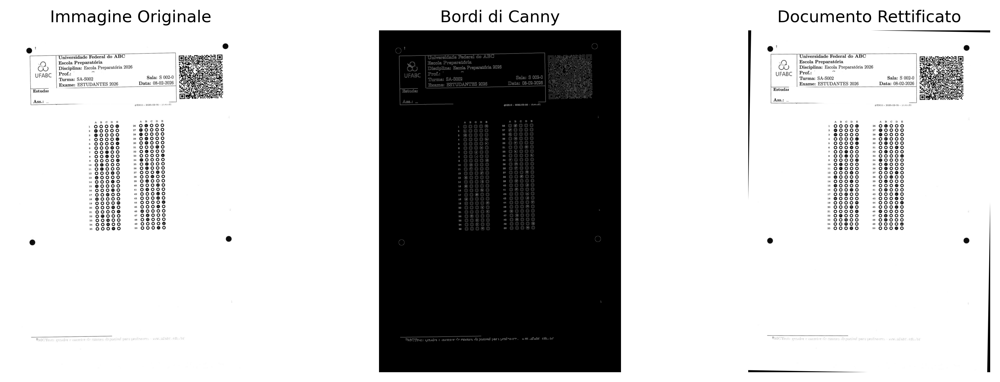

**Figura 6.7:** *Pipeline* di rettificazione assiale: visualizzazione comparativa tra l


In [10]:
def retificar_inclinacao_documento(img):

    gray = mm.gray(img) if img.ndim == 3 else img
    edges = cv2.Canny(cv2.GaussianBlur(gray, (5,5), 0), 50, 150)
    lines = cv2.HoughLines(edges, 1, np.pi/180, 200)

    if lines is None:
        return edges, img

    angulos = []
    for line in lines:
        angulo = np.rad2deg(line[0][1]) - 90
        if -45 < angulo < 45:
            angulos.append(angulo)

    if not angulos:
        return edges, img

    return edges, mm.rotate(img, np.median(angulos), interp="bicubic")

# Esecuzione del pipeline di deskew
img_edges, img_final = retificar_inclinacao_documento(img_original)

# Visualizzazione multipla standardizzata con il formato nativo del libro
mm.show(
    [img_original, img_edges, img_final],
    titles=["Immagine Originale", "Bordi di Canny", "Documento Rettificato"],
    cols=3,
    figsize=(12, 4)
)

> ### 📝 🧠 Perché funziona? — Trasformata di Hough
>
> Nella Trasformata di Hough, ogni pixel di bordo contribuisce con voti per
> tutte le rette che possono passare per la sua posizione. Invece di
> selezionare solo la retta con il maggior numero di voti, l’algoritmo
> considera tutte le rette la cui quantità di voti supera una soglia minima
> e calcola i rispettivi angoli. L’inclinazione globale del documento viene
> quindi stimata mediante la mediana di tali angoli, una misura robusta
> rispetto ai valori anomali. Così, le rette spurie prodotte da ombre,
> rumori o altri elementi dell’immagine esercitano scarsa influenza sulla
> stima finale, purché la maggior parte delle rette rilevate corrisponda ai
> bordi del documento.

### 6.8.4 Limiti Pratici

Sebbene presenti buone prestazioni in condizioni usuali di digitalizzazione, il metodo dipende dall'esistenza di strutture lineari sufficientemente definite per essere rilevate dalla Trasformata di Hough, come i bordi della pagina, le linee dei moduli o le righe di testo. La sua precisione può ridursi in immagini a bassa risoluzione, con rumore eccessivo, ombre intense o inclinazioni accentuate. In generale, documenti digitalizzati con una risoluzione prossima a 300 DPI e illuminazione omogenea forniscono risultati adeguati per applicazioni OCR e OMR.

L'implementazione presentata in questo capitolo ha finalità didattica, illustrando i principi della correzione automatica dell'inclinazione tramite il rilevamento dei bordi, la Trasformata di Hough e la rotazione affine. Poiché utilizza solo l'orientamento delle strutture lineari predominanti, il metodo può essere applicato a diversi tipi di documenti, senza dipendere da marcatori specifici.

Nei sistemi reali di analisi documentale, tuttavia, l'allineamento utilizza generalmente marcatori geometrici preventivamente noti. Nel modello di foglio di risposta impiegato dall'ecosistema MCTest, ad esempio, vengono utilizzati quattro dischi neri di riferimento, oltre alle regioni corrispondenti all'intestazione, al *QRCode* e ai riquadri delle risposte. La localizzazione di questi elementi consente di stimare simultaneamente rotazione, scala e traslazione del foglio, rendendo la registrazione meno sensibile alla quantità di testo, all'assenza di linee strutturali e alle variazioni di stampa o digitalizzazione.

Per questo motivo, l'approccio basato sulla Trasformata di Hough viene utilizzato in questo capitolo per introdurre i fondamenti del problema, mentre le fasi successive adottano l'allineamento tramite marcatori geometrici, strategia predominante nei sistemi OMR e nell'analisi documentale.

### 6.8.5 Rilevamento dei Bordi e dei Contorni

La localizzazione precisa delle regioni di interesse è una fase essenziale nei
sistemi OMR. Nel modello di foglio di risposta utilizzato in questo capitolo,
l'intestazione e il riquadro delle risposte sono contenuti in un rettangolo virtuale
delimitato da quattro dischi neri posizionati agli angoli. L'identificazione
di questi marcatori consente di localizzare la regione di interesse e correggere
le distorsioni geometriche introdotte durante l'acquisizione dell'immagine.

La procedura si compone di cinque fasi. Inizialmente, si applica una
**chiusura morfologica** (dilatazione seguita da erosione), operazione studiata
nel **Capitolo 4**, utilizzando un elemento strutturante a disco
(`mm.sedisk(33)`). Questa operazione riduce le piccole discontinuità e preserva
i dischi di riferimento, rendendoli più omogenei. Successivamente, l'immagine viene
invertita (`mm.neg`), così che i dischi vadano a costituire componenti
chiare su sfondo scuro.

Nella fase successiva, si applica l'operazione `mm.edgeoff` (**Capitolo 4**), che
rimuove i componenti connessi ai bordi dell'immagine, eliminando artefatti come
ombre di scansione, segni di taglio e altri oggetti spuri ai margini.
I componenti rimanenti vengono quindi analizzati a partire dai loro contorni e
filtrati in base a proprietà geometriche, come area e
circolarità, per identificare i dischi candidati. L'implementazione di
MCTest rende questo processo più robusto selezionando, tra tutti i
candidati, i quattro i cui centri formano un rettangolo con larghezza
compatibile con quella dell'immagine, riducendo così il verificarsi di falsi positivi.

Infine, i centri dei quattro dischi vengono ordinati spazialmente (in alto a
sinistra, in alto a destra, in basso a sinistra e in basso a destra) e
utilizzati come punti di controllo in una trasformazione di prospettiva
(*perspective warp*). Questa trasformazione raddrizza l'immagine, producendo una
rappresentazione allineata e con dimensioni note, adatta alle fasi
successive di segmentazione e riconoscimento.

Le principali fasi di questo *pipeline*, dal processamento morfologico fino
all'immagine raddrizzata, sono illustrate di seguito.

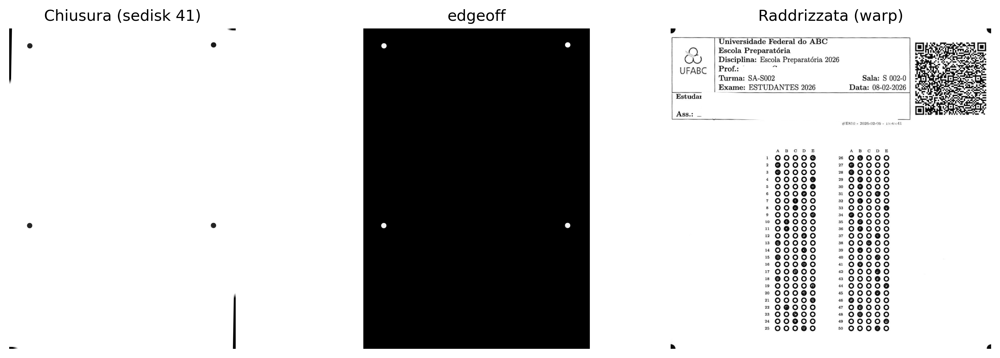

**Figura 6.8:** Rilevamento dei dischi marcatori, estrazione dei contorni e raddrizzamento tramite trasformazione prospettica.


In [11]:
import cv2
import numpy as np
from morph import mm

# img: immagine in scala di grigi del foglio di prova
if img_final.ndim == 2:
    img = img_final
else:
    img = mm.gray(img_final)

# 1. Chiusura morfologica: preserva i dischi scuri, rimuovendo tutto ciò che è più piccolo del disco
img_close = mm.close(img, mm.sedisk(41))

# 2. Inversione: i dischi scuri diventano componenti chiari su sfondo scuro
img_neg = mm.neg(img_close)

# 3. Rimuove i componenti connessi che toccano il bordo dell'immagine
img_edgeoff = mm.edgeoff(img_neg)

# 4. Estrazione dei contorni esterni
contornos, _ = cv2.findContours(img_edgeoff, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 5. Filtraggio per area e circolarità, mantenendo solo i 4 dischi
centros = []
for c in contornos:
    area = cv2.contourArea(c)
    perimetro = cv2.arcLength(c, True)
    if area < 50 or perimetro == 0:
        continue
    circularidade = 4 * np.pi * area / (perimetro ** 2)
    if circularidade > 0.8:
        M = cv2.moments(c)
        cx, cy = M["m10"] / M["m00"], M["m01"] / M["m00"]
        centros.append((cx, cy))

# Verifica robusta: interrompe il pipeline con un messaggio chiaro invece di AssertionError
if len(centros) != 4:
    print(f"[AVVISO] Attesi 4 dischi marcatori, trovati {len(centros)}.")
    print("  Verifica se l'immagine è un foglio di risposte MCTest valido")
    print("  o regola i parametri di circolarità e area minima.")
    img_retificada = img  # fallback: preserva l'immagine senza raddrizzamento
else:
    # 6. Ordinamento dei centri: in alto a sinistra, in alto a destra,
    # in basso a sinistra, in basso a destra
    pts = np.array(centros, dtype=np.float32)
    soma = pts.sum(axis=1)
    diff = pts[:, 0] - pts[:, 1]
    tl = pts[np.argmin(soma)]
    br = pts[np.argmax(soma)]
    tr = pts[np.argmax(diff)]
    bl = pts[np.argmin(diff)]
    pts_ordenados = np.array([tl, tr, bl, br], dtype=np.float32)

    # 7. Raddrizzamento tramite trasformazione prospettica (warp)
    largura, altura = 800, 800
    destino = np.array(
        [[0, 0], [largura, 0], [0, altura], [largura, altura]], dtype=np.float32
    )
    M_persp = cv2.getPerspectiveTransform(pts_ordenados, destino)
    img_retificada = cv2.warpPerspective(img, M_persp, (largura, altura))

    mm.show(
        [img_close, img_edgeoff, img_retificada],
        titles=["Chiusura (sedisk 41)", "edgeoff", "Raddrizzata (warp)"],
        cols=3,
        figsize=(12, 4)
    )

mm.write(img_retificada, "img_beetween_disks.png")

> ### 📝 🧠 Perché funziona? — Dalla chiusura morfologica alla rettifica
>
> **Chiusura morfologica:** la dilatazione seguita dall'erosione riempie piccole discontinuità e smussa i contorni degli oggetti senza alterare significativamente la loro forma complessiva. Utilizzando un elemento strutturante grande (`sedisk(41)`), dettagli sottili, come testi, linee del modulo e piccoli rumori, tendono a essere incorporati nello sfondo durante l'elaborazione, mentre oggetti di scala maggiore, come i dischi di riferimento, rimangono preservati e diventano più omogenei.
>
> **Circolarità:** dopo l'isolamento dei componenti candidati, la metrica $C=\frac{4\pi A}{P^2}$ quantifica quanto la loro forma si avvicini a un cerchio. Il suo valore è pari a 1 per un cerchio perfetto e diminuisce man mano che il contorno diventa più irregolare. Pertanto, una soglia come $C>0{,}8$ consente di scartare la maggior parte dei falsi positivi senza ricorrere a modelli di apprendimento. Un simulatore di questa metrica è presentato nella [Figura 6.9](#fig-06-sim-06-circularidade).
>
> **Trasformazione di prospettiva (*perspective warp*):** una volta identificati i quattro dischi di riferimento, i loro centri vengono utilizzati come punti di controllo per stimare la trasformazione proiettiva che mappa l'immagine acquisita sul piano del documento. Questa trasformazione corregge le distorsioni introdotte dalla prospettiva durante l'acquisizione dell'immagine, producendo una rappresentazione frontale con dimensioni note e adatta alle fasi successive di segmentazione e riconoscimento.

In [12]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-06-circularidade" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-06-circularidade * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-06-circularidade canvas { display: block; max-width: 100%; height: auto; border-radius: 8px; border: 1px solid #e4dcc8; background: #ffffff; margin: 0 auto; }
  #sim-06-circularidade button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-06-circularidade button:hover { background: #e8dfcf; }
  #sim-06-circularidade input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim06_circ_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim06_circ_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .sim06_circ_grid_stats { display: grid; grid-template-columns: repeat(3, 1fr); gap: 10px; margin-bottom: 12px; }
  .sim06_circ_stat_box { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 10px; padding: 10px; text-align: center; }
  .sim06_circ_stat_label { font-size: 9.5px; color: #8a8371; text-transform: uppercase; letter-spacing: 0.04em; margin-bottom: 2px; font-weight: 700; }
  .sim06_circ_stat_value { font-size: 16px; font-weight: 700; font-family: monospace; color: #26241d; }
  .sim06_circ_legend { display: flex; gap: 16px; font-size: 10.5px; font-weight: 600; color: #5e5a4a; align-items: center; justify-content: center; margin-top: 10px; }
  .sim06_circ_dot { width: 10px; height: 10px; border-radius: 50%; display: inline-block; margin-right: 5px; vertical-align: middle; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">⭕ Simulatore: Filtraggio per Circolarità</span>
  <span class="sim06_circ_pill">C = 4πA / P²</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Estatísticas e Slider -->
  <div class="sim06_circ_panel" style="margin-bottom:14px;">
    
    <div class="sim06_circ_grid_stats">
      <div class="sim06_circ_stat_box">
        <div class="sim06_circ_stat_label">Soglia C</div>
        <div id="sim06_circ_thVal" class="sim06_circ_stat_value" style="color:#2980b9;">0.60</div>
      </div>
      <div class="sim06_circ_stat_box">
        <div class="sim06_circ_stat_label">Accettati</div>
        <div id="sim06_circ_nAcc" class="sim06_circ_stat_value" style="color:#27ae60;">0</div>
      </div>
      <div class="sim06_circ_stat_box">
        <div class="sim06_circ_stat_label">Rifiutati</div>
        <div id="sim06_circ_nRej" class="sim06_circ_stat_value" style="color:#c0392b;">0</div>
      </div>
    </div>

    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:6px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Soglia di Circolarità: <span id="sim06_circ_slLabel" style="font-family:monospace; color:#26241d;">0.60</span>
      </label>
      <button id="sim06_circ_resetBtn">↺ Reimposta</button>
    </div>
    
    <input type="range" id="sim06_circ_slider" min="0.05" max="0.99" step="0.01" value="0.60">
    
    <div class="sim06_circ_legend">
      <span><span class="sim06_circ_dot" style="background:#27ae60;"></span>Accettato (C ≥ soglia)</span>
      <span><span class="sim06_circ_dot" style="background:#c0392b;"></span>Rifiutato (C &lt; soglia)</span>
    </div>

  </div>

  <!-- Canvas -->
  <div style="margin-bottom:14px; text-align:center;">
    <canvas id="sim06_circ_cv"></canvas>
  </div>

  <!-- Explicação Teórica -->
  <div class="sim06_circ_panel">
    <div style="font-size:11px; font-weight:700; color:#5e5a4a; margin-bottom:6px;">🧠 Formula della Circolarità</div>
    <div style="font-size:11px; color:#5e5a4a; line-height:1.5;">
      La metrica <strong>C = 4πA / P²</strong> mette in relazione l'area <em>A</em> del componente con il quadrato del suo perimetro <em>P</em>.
      Per un cerchio perfetto, C = 1; per forme più irregolari o allungate, C si avvicina a 0.
      Nel contesto del MCTest, una soglia come C &gt; 0,60 seleziona i dischi di riferimento, scartando testi, linee e artefatti del foglio di risposta.
    </div>
  </div>

</div>
</div>

<script>
(function() {
  function initSim06Circularidade(root){
    if (!root || root.dataset.sim06CircularidadeInit) return;
    root.dataset.sim06CircularidadeInit = "1";

    const COMPS = [
      {nome:"Círculo",       circ:1.0000, cx:80,  cy:75,  rx:52, ry:52, shape:"ellipse"},
      {nome:"Elipse leve",   circ:0.9649, cx:220, cy:75,  rx:60, ry:44, shape:"ellipse"},
      {nome:"Elipse along.", circ:0.7454, cx:375, cy:75,  rx:80, ry:32, shape:"ellipse"},
      {nome:"Quadrado",      circ:0.7854, cx:80,  cy:210, rx:48, ry:48, shape:"rect"},
      {nome:"Retângulo",     circ:0.6750, cx:220, cy:210, rx:70, ry:32, shape:"rect"},
      {nome:"Ret. fino",     circ:0.4740, cx:375, cy:210, rx:70, ry:16, shape:"rect"},
      {nome:"Estrela",       circ:0.2493, cx:145, cy:340, rx:48, ry:48, shape:"star"},
      {nome:"Forma-L",       circ:0.3704, cx:350, cy:340, rx:40, ry:48, shape:"L"},
    ];

    const W = 500, H = 430;
    const cv = root.querySelector('#sim06_circ_cv');
    cv.width = W; 
    cv.height = H;
    const ctx = cv.getContext('2d');

    function drawStar(cx, cy, r1, r2, n) {
      ctx.beginPath();
      for (let i = 0; i < n * 2; i++) {
        const angle = -Math.PI / 2 + i * Math.PI / n;
        const r = i % 2 === 0 ? r1 : r2;
        if (i === 0) ctx.moveTo(cx + r * Math.cos(angle), cy + r * Math.sin(angle));
        else ctx.lineTo(cx + r * Math.cos(angle), cy + r * Math.sin(angle));
      }
      ctx.closePath();
    }

    function drawL(cx, cy, rx, ry) {
      const bw = rx * 0.45, bh = ry * 1.0;
      const fh = ry * 0.28, fw = rx * 1.0;
      ctx.beginPath();
      ctx.rect(cx - bw, cy - bh, bw * 2, bh * 2);
      ctx.rect(cx - bw, cy + bh - fh * 2, fw * 2, fh * 2);
    }

    function draw(threshold) {
      ctx.clearRect(0, 0, W, H);
      ctx.fillStyle = '#fafaf7';
      ctx.fillRect(0, 0, W, H);

      ctx.strokeStyle = '#e4dcc8';
      ctx.lineWidth = 1;
      ctx.setLineDash([4, 4]);
      ctx.beginPath(); ctx.moveTo(20, 143); ctx.lineTo(W - 20, 143); ctx.stroke();
      ctx.beginPath(); ctx.moveTo(20, 278); ctx.lineTo(W - 20, 278); ctx.stroke();
      ctx.setLineDash([]);

      let acc = 0, rej = 0;

      COMPS.forEach(c => {
        const ok = c.circ >= threshold;
        if (ok) acc++; else rej++;

        const fill   = ok ? 'rgba(39, 174, 96, 0.15)' : 'rgba(192, 57, 43, 0.12)';
        const stroke = ok ? '#27ae60' : '#c0392b';

        ctx.save();
        ctx.fillStyle = fill;
        ctx.strokeStyle = stroke;
        ctx.lineWidth = 2.5;

        if (c.shape === 'ellipse') {
          ctx.beginPath();
          ctx.ellipse(c.cx, c.cy, c.rx, c.ry, 0, 0, Math.PI * 2);
          ctx.fill(); ctx.stroke();
        } else if (c.shape === 'rect') {
          ctx.beginPath();
          ctx.rect(c.cx - c.rx, c.cy - c.ry, c.rx * 2, c.ry * 2);
          ctx.fill(); ctx.stroke();
        } else if (c.shape === 'star') {
          drawStar(c.cx, c.cy, c.rx, c.rx * 0.42, 5);
          ctx.fill(); ctx.stroke();
        } else if (c.shape === 'L') {
          drawL(c.cx, c.cy, c.rx, c.ry);
          ctx.fill(); ctx.stroke();
        }

        // Ícone de aprovação/rejeição
        ctx.font = 'bold 18px sans-serif';
        ctx.textAlign = 'center';
        ctx.fillStyle = stroke;
        ctx.fillText(ok ? '✓' : '✗', c.cx, c.cy - c.ry - 6);

        // Nome da forma
        ctx.font = 'bold 11px Inter, system-ui, sans-serif';
        ctx.fillStyle = '#26241d';
        ctx.fillText(c.nome, c.cx, c.cy + c.ry + 14);

        // Valor de C
        ctx.font = '10px monospace';
        ctx.fillStyle = ok ? '#0e6251' : '#78281f';
        ctx.fillText('C = ' + c.circ.toFixed(4), c.cx, c.cy + c.ry + 27);

        ctx.restore();
      });

      root.querySelector('#sim06_circ_nAcc').textContent = acc;
      root.querySelector('#sim06_circ_nRej').textContent = rej;
    }

    function update() {
      const th = parseFloat(root.querySelector('#sim06_circ_slider').value);
      root.querySelector('#sim06_circ_thVal').textContent   = th.toFixed(2);
      root.querySelector('#sim06_circ_slLabel').textContent = th.toFixed(2);
      draw(th);
    }

    root.querySelector('#sim06_circ_slider').addEventListener('input', update);
    root.querySelector('#sim06_circ_resetBtn').addEventListener('click', () => {
      root.querySelector('#sim06_circ_slider').value = 0.60;
      update();
    });

    update();
  }

  function tryInitSim06Circularidade(){
    var root = document.getElementById('sim-06-circularidade');
    if (root) initSim06Circularidade(root); else setTimeout(tryInitSim06Circularidade, 200);
  }
  tryInitSim06Circularidade();
})();
</script>
""")

**Figura 6.9:** Simulatore interattivo di filtraggio per circularità: muovi lo *slider* per regolare la soglia C e osserva quali componenti sono accettati (verde) o rifiutati (rosso).


### 6.8.6 Isolamento, Segmentazione e Decodifica del *QRCode*

Dopo la rettifica geometrica del foglio di risposta, si esegue il rilevamento e la decodifica del *QRCode* presente nel modulo. Questo marcatore memorizza informazioni utilizzate dal sistema di OMR (*Optical Mark Recognition*), come l'identificazione dello studente, il codice della prova e la sua variazione, consentendo il recupero del gabarit corrispondente nel database. Per sicurezza, queste informazioni vengono crittografate prima della generazione del *QRCode*. Pertanto, la sequenza decodificata corrisponde a una *string* esadecimale, la cui interpretazione è eseguita esclusivamente dal sistema MCTest. La procedura è composta da tre fasi: preprocessamento morfologico, isolamento della regione del *QRCode* e decodifica del suo contenuto.

Inizialmente, l'immagine rettificata in scala di grigi viene binarizzata tramite l'operazione `mm.threshold`. Successivamente, si applica un'**apertura morfologica** (erosione seguita da dilatazione), studiata nel **Capitolo 4**, utilizzando un elemento strutturante quadrato (`mm.sebox(2)`). Questa operazione rimuove piccoli rumori e attenua le imperfezioni senza compromettere la struttura del marcatore. Infine, l'immagine viene invertita (`mm.neg`), in modo che il *QRCode* costituisca un componente chiaro su sfondo scuro, facilitando l'estrazione dei suoi contorni.

La localizzazione del *QRCode* viene eseguita tramite l'analisi dei contorni esterni dell'immagine binarizzata. Tra i componenti rilevati, si seleziona quello con area maggiore e geometria approssimativamente quadrata, scartando gli altri elementi stampati sul foglio. Successivamente, la regione corrispondente viene espansa con un piccolo margine di sicurezza, garantendo la conservazione integrale del marcatore.

Il *QRCode* viene quindi estratto direttamente dall'immagine rettificata in scala di grigi, preservandone la qualità radiometrica. Poiché questa regione presenta generalmente dimensioni ridotte, si applica un ridimensionamento con interpolazione cubica, aumentando la risoluzione spaziale e favorendo l'identificazione dei suoi moduli. La lettura viene eseguita dal rilevatore di *QRCode* di OpenCV (`cv2.QRCodeDetector`), che recupera la sequenza di caratteri originariamente codificata.

Il flusso completo di questo processamento, dal preprocessamento morfologico fino alla decodifica del *QRCode*, è illustrato nella [Figura 6.10](#fig-06-processamento-qrcode). Il segmento mostrato nell'output corrisponde solo all'inizio della *string* esadecimale crittografata; la sua interpretazione completa viene eseguita internamente da MCTest dopo la decodifica.

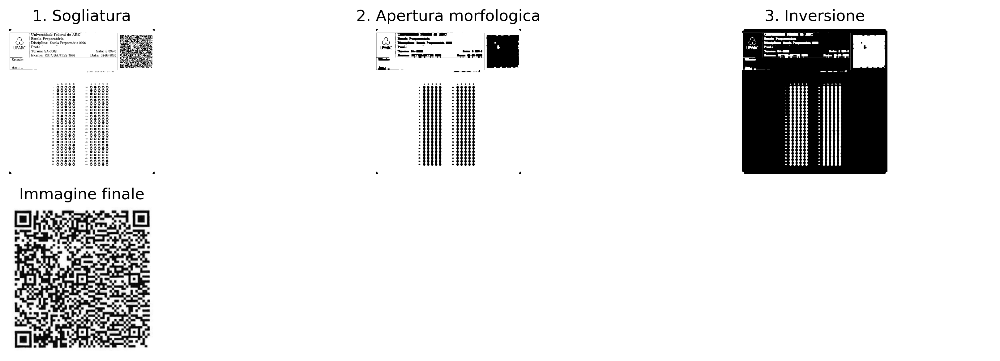

**Figura 6.10:** *Pipeline* di elaborazione del *QRCode*: sogliatura, apertura morfologica, inversione e ritaglio finale per la decodifica.


QRCode decodificato con successo: 
325a356b71367266556955646b7233454149624a694f417730...


In [13]:
import cv2
import numpy as np
from morph import mm

# f: immagine raddrizzata convertita al tipo corretto a 8 bit (0–255)
f = img_retificada.astype('uint8')

# 1. Sogliatura: conversione dell'immagine in toni di grigio in binaria
f_thresh = mm.threshold(f)

# 2. Apertura morfologica: elimina piccoli rumori e uniforma il contorno dei blocchi
f_open = mm.open(f_thresh, mm.sebox(2))

# 3. Inversione morfologica: i moduli scuri diventano componenti chiari su sfondo scuro
f_inv = mm.neg(f_open)

# 4. Conversione sicura in uint8 con scala 0–255
img_uint8 = (f_inv.astype(np.uint8) * 255) if f_inv.max() == 1 else f_inv.astype(np.uint8)

# 5. Rilevamento dei contorni esterni
contornos, _ = cv2.findContours(img_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if not contornos:
    raise ValueError("Nenhum contorno encontrado. Verifique o limiar ou a imagem de entrada.")

# 6. Filtraggio per il contorno più grande con proporzione approssimativamente quadrata
#    (aspect ratio tra 0.7 e 1.3 scarta rettangoli allungati del foglio)
def is_square_like(contorno, tol=0.3):
    x, y, w, h = cv2.boundingRect(contorno)
    ratio = w / h if h > 0 else 0
    return (1 - tol) <= ratio <= (1 + tol)

candidatos = [c for c in contornos if is_square_like(c)]

if not candidatos:
    raise ValueError(
        "Nenhum contorno quadrado encontrado. "
        "Verifique se o QRCode está presente na imagem ou ajuste a tolerância."
    )

# Seleziona il candidato quadrato più grande per area di bounding box
maior_contorno = max(candidatos, key=lambda c: cv2.boundingRect(c)[2] * cv2.boundingRect(c)[3])
x, y, w, h = cv2.boundingRect(maior_contorno)

# 7. Espansione della bounding box con margine di sicurezza (evita troncamento del QRCode)
margem = 5
h_img, w_img = img_uint8.shape[:2]
x1 = max(x - margem, 0)
y1 = max(y - margem, 0)
x2 = min(x + w + margem, w_img)
y2 = min(y + h + margem, h_img)

# 8. Ritaglio della regione di interesse dall'immagine originale (nitida, in grigio)
img_qrcode_final = img_retificada[y1:y2, x1:x2]

# 9. Ingrandimento per risoluzione minima di decodifica (400 px sul lato maggiore)
#    cv2.QRCodeDetector richiede moduli con almeno 3–4 px di larghezza per decodificare
#    in sicurezza; immagini più piccole di ~400 px tendono a fallire.
lado = max(img_qrcode_final.shape[:2])
escala = max(400 / lado, 1.0)
img_para_leitura = cv2.resize(
    img_qrcode_final, None,
    fx=escala, fy=escala,
    interpolation=cv2.INTER_CUBIC
)

# 10. Inizializzazione del rilevatore nativo di QRCode di OpenCV
detector = cv2.QRCodeDetector()

# 11. Rilevamento geometrico e decodifica dei dati testuali
dados, pontos, qrcode_reto = detector.detectAndDecode(img_para_leitura)


# Visualizzazione intermedia: progressione dalla binarizzazione all'isolamento del QRCode
mm.show(
    [f_thresh, f_open, f_inv, img_qrcode_final],
    titles=["1. Sogliatura", "2. Apertura morfologica", "3. Inversione", "Immagine finale"],
    cols=3, figsize=(12, 4)
)

# Validazione e uscita dei metadati estratti
if dados:
    print(f"QRCode decodificato con successo: \n{dados[:50]}...")
else:
    raise ValueError(
        "Falha na decodificação do QRCode. "
        "Verifique o limiar, as margens da região ou a qualidade da imagem."
    )

In [14]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-06-qrcode" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📱 Simulatore EP06: Isolamento del QRCode</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Threshold → Chiusura → Contorno · Gabarito Sintetico</span>
  </div>

<style>
  #sim-06-qrcode * { box-sizing: border-box; }
  #sim-06-qrcode { font-family: sans-serif; padding: 10px; max-width: 780px; margin: 0 auto; color: #374151; }
  #sim-06-qrcode canvas { display: block; border-radius: 6px; border: 1px solid #d1d5db; background: #fff; }
  #sim-06-qrcode button { font-size: 11px; padding: 5px 10px; border-radius: 4px; border: 1px solid #d1d5db; background: #fff; color: #374151; cursor: pointer; }
  #sim-06-qrcode button:hover { background: #f3f4f6; }
  #sim-06-qrcode input[type=range] { accent-color: #6366f1; }
  .qr_panel  { background: #f9fafb; border: 1px solid #e5e7eb; border-radius: 6px; padding: 10px; margin-bottom: 8px; text-align: left;}
  .qr_pill   { font-size: 10px; font-weight: bold; padding: 3px 8px; border-radius: 4px; border: 1px solid #a5b4fc; background: #eef2ff; color: #4338ca; }
  .qr_steps  { display: flex; gap: 6px; flex-wrap: wrap; margin-bottom: 8px; }
  .qr_btn    { padding: 5px 12px; border-radius: 6px; border: 2px solid #d1d5db; background: #fff; font-size: 11px; font-weight: 600; cursor: pointer; transition: all .15s; }
  .qr_btn.active { border-color: #6366f1; background: #eef2ff; color: #4338ca; }
  .qr_canvases { display: flex; gap: 12px; flex-wrap: wrap; justify-content: center; }
  .qr_cv_wrap  { text-align: center; }
  .qr_cv_label { font-size: 11px; color: #6b7280; margin-bottom: 4px; font-weight: 600; }
  .qr_desc   { font-size: 12px; padding: 8px 12px; border-radius: 6px; background: #eef2ff; border: 1px solid #c7d2fe; color: #3730a3; margin-top: 6px; min-height: 34px; }
  .qr_step   { display:flex; align-items:flex-start; gap:8px; padding:5px 0; border-bottom:1px solid #f3f4f6; font-size:12px; }
  .qr_step:last-child { border-bottom:none; }
  .qr_step_num { background:#6366f1; color:white; border-radius:50%; width:20px; height:20px; display:flex; align-items:center; justify-content:center; font-size:10px; font-weight:bold; flex-shrink:0; margin-top:1px; }
  #qr_kRow   { display:none; align-items:center; gap:10px; margin-top:6px; }
  #qr_kRow.visible { display:flex; }
  .qr_warn { font-size:10px; color:#92400e; background:#fef3c7; border:1px solid #fde68a; border-radius:4px; padding:4px 8px; margin-top:6px; }
</style>

<div class="qr_panel">
  <div style="font-size:11px;font-weight:700;color:#374151;margin-bottom:6px;">Seleziona la fase:</div>
  <div class="qr_steps">
    <button class="qr_btn active" data-step="0">0 · Originale</button>
    <button class="qr_btn" data-step="1">1 · Soglia</button>
    <button class="qr_btn" data-step="2">2 · Chiusura</button>
    <button class="qr_btn" data-step="3">3 · Contorno</button>
    <button class="qr_btn" data-step="4">4 · Ritaglio</button>
  </div>
  <div id="qr_kRow">
    <label style="font-size:11px;font-weight:600;white-space:nowrap;">Elemento strutturante — sebox(<span id="qr_kVal">1</span>):</label>
      <input type="range" id="qr_kSlider" min="0" max="3" step="1" value="1" style="width:140px;">
    <span id="qr_kDesc" style="font-size:10px;color:#6b7280;"></span>
  </div>
  <div id="qr_desc" class="qr_desc"></div>
  <div id="qr_warnBox"></div>
</div>

<div class="qr_canvases">
  <div class="qr_cv_wrap">
    <div class="qr_cv_label" id="qr_main_label">Originale</div>
    <canvas id="qr_cvMain" width="250" height="250"></canvas>
  </div>
  <div class="qr_cv_wrap">
    <div class="qr_cv_label">Ritaglio finale (QRCode)</div>
    <canvas id="qr_cvCrop" width="160" height="160"></canvas>
  </div>
</div>

<div class="qr_panel" style="margin-top:8px;">
  <div style="font-size:11px;font-weight:700;color:#374151;margin-bottom:6px;">🧠 Fasi del pipeline (replica fedele dell'algoritmo OpenCV di riferimento)</div>
  <div class="qr_step"><div class="qr_step_num">1</div><div><strong>Soglia</strong> (<code>mm.threshold</code>): Segmenta i moduli scuri del QRCode isolandoli dallo sfondo chiaro.</div></div>
  <div class="qr_step"><div class="qr_step_num">2</div><div><strong>Chiusura morfologica</strong> (<code>mm.close + mm.sebox(k)</code>): dilatazione seguita da erosione rimuove rumori e riempie le discontinuità. <code>sebox(0)</code> = kernel 3×3, <code>sebox(1)</code> = 5×5, e così via. Nota che qui si usa <em>chiusura</em> (≠ apertura usata nella cella di codice sopra), il che stimola il confronto tra i due operatori.</div></div>
  <div class="qr_step"><div class="qr_step_num">4</div><div><strong>Rilevamento dei contorni</strong> (<code>cv2.findContours</code>, <code>RETR_EXTERNAL</code>): Cerca il contorno esterno più grande con proporzione approssimativamente quadrata (rapporto larghezza/altezza tra 0.7 e 1.3), scartando i rettangoli allungati del foglio.</div></div>
  <div class="qr_step"><div class="qr_step_num">5</div><div><strong>Ritaglio + margine di sicurezza:</strong> Estrae la <em>bounding box</em> del contorno selezionato, con margine di 5px, dall'immagine originale in scala di grigi.</div></div>
</div>

<script>
(function() {
  // Imagem original do usuário (img_beetween_disks.png), redimensionada para 256x256 e
  // codificada em Base64. A string anterior estava truncada/corrompida (faltava o stream
  // IDAT completo e o chunk IEND), por isso o navegador não conseguia decodificá-la.
  const QR_B64 = "iVBORw0KGgoAAAANSUhEUgAAAQAAAAEACAAAAAB5Gfe6AABQtElEQVR4nO19d3xVxdP+7J57b3pvpPfQQg29g/SO9CpKVRQEBEVFUZqiiKKIgHQEpUgv0iH03ksSQkhIJb3cenaf3x8BRAL6fb9eXuPn9z4fzU0up8yZszsz++zMLnOkkhoXGP1/CMljmzlwToxbmPynhfln4KTRELdYxNh/WpB/BkxWGVBg0oRrRw6X/J8W5p8AI91XXrtZkSMJ5Z+W5R8Ewz8twT8JgDHkm5iqKAxcQCpM4YAEESmSgQkOpiF7I8wWhXEtIyGkwjhXpBQkFUVlTBVaTgqHYCRJYYKRZMQ4FA6pMsYZjJxx4qSFlCDGJIMFnLQMjMwK45IRMQnOGOeABLgCyQBGnHGSEoDCwCQRcYUxCElS4VyVYMQVzd/VgUb9KV5rdrAji41Jr9jZO2qZIU+1cFutIs0WjUaxc9IVOpqNOpX5Fauy0AH5jm7OKC40WOCiU6CHs97GwdmeyXSTWXF2dlKRpneAbZhSUCQKpYOjxqJkldjCLVjNLzIYuZ2tW5pe6yIchLtHrjY1X6M4kUkj9UyxdXTUmY1GUh0cRDEzFDkpdvb2wmgoVrUOilQKGNfZuNhrCrMsQnFkjlklKrOz0wS442/68Hwj/gqrgYRh25JG3AVw8ecn/2VjBu68A0Di5nQAwO1+4966DgDjjz46pmRIEoCcN0oe/v0dsHbMF3ORM3XrZzv+eCPx9J2lLCOM+MNXuekoe8j/CBoq0RDosRYZ0WOrwFD6ha1F8dzWxsd085BtjVuFO7yTg5M0lW7Zud6OPtPh+Pard3c2qXnkeyE3RdYwBitN3W6dbRq66l5q6u4etwzRZ1nnvGuBLGXPBWVnzhCpai++W6uB69XpLWuuadWyKEGqGkalt2RgjACGhzIwIsaICE++Yka89GACgRHpjMRICiIiUrgkLhgJhVPpdxpGRCpTBGcCCiOVFCYADRNgBCINEWlU9pc+wFHhLk4Otk7+n439vsv+jt/6Hwq4I757ZbOmTuryOxXjTp2Pq54fnffT9et2kdx3+qf71Ys5rf3zvlH1JxwGn0z2idbyvIn966w15n/7ltaU9PLyRnZuSSGOsVOcOuQwLXuo9tIfjP3++6NnfrqJs4c/S7VDRPyRF+cEhYiTZKz0O8kIGoJCUiGSTENSKkSP3R4YkUYj/ur5yZYkr55ncqsa1m17nZ9fXjrwXPpQpdmrBemJteO9OmzWh926Vdtv3V1nrZkj45PIub0KNs26nnatp9/2T4oZS7WYKS+py9krHdWNxEqO11mUrhZG+8e9dCD8gFfk33TBTBLYxS1kFBpNi1ZnDM1/qMDOdq1PlpO7yU3/hjcRWxjcYXtDz8W3RlWkOSmz7eamuw71+TLDwBRnMc4PTGNb/Jd3kYywctWy989FrIn+qYZ8O7L+VkFF0i7KvWRQwoqm1S019R4Xol5b4RNGCXZK5SUbmvXd4BHe/Hxjn+tNAysnWJwo7MsFdu3vZs0nWlO/T9w659BxDXq8/PPH3erIvxmCcC1JZf/uoSXGol1prQ/ltrSNrbJXn27st+7CgLfbpV/yDNRXvh0d9orzzz1Wn3u/cf7g99sljGgcMG3wkGLnrB79/cCYvtjzD20MEoz/sdXt6MQALjkRGJiqkcRVhYGZbP6oJ04A/6suJaCh0sZHYH/XgpO5xE3yGXZdV7LhB0++8v4Qv6C47zp0+X59Z+Vzl23XtYrybbXWP9rPzPyo9Re9d8ac29+mWX1l9ab6Pt/kpmgGdtlQU3KN5o/ygimP5HuMEgJjxElKjWCkCIWIgxjZEBEALomBGEkGYoIpkhExEow4AE4Exkg+6rikkGRMcjBrPD+Bg6iEnZ9JlUwOF4/29PgpgO6nBPZ11MzoZsqy8+ATQkfZddsl+pjG14727FVrf/q9QjMR189Mo6oqEZGG6Z6UQiiX1hij+7r9QbRsyffv5w/ersqlQpIrKbOme5JkhjlZ9m3bMCptxkLhQiFSCJyk3BJei7CpkS9JToyInhxscCJO7JEZ+5sKAAOZyYVICIu5e5+4ecpV42j9onvbWm13cLPfGtskJXmp4bOh4y6mvkK05VhUxmu+24tBcE0jRYKINOYnpZDKuivDHE5PmeX6xLfQMVZz5LfpmozUmPSiqNum6uZ7qY7hZhvTgZN1vm5AXpcDNLlqZFF87SsioqCg6s+2HXM3LS6QMkPcUSv+/bf8Z5BERNy20RR6aa8LT91yfcrOY4PbTD28H9X2Lvq4s9GpY/EPm5sMcp3tZjOzT+QlRwev8RHdazKt/4/3LfUMnIg0T4wEVam7cXEOUZDDhlFPyM1MRB5eswdjZoNLSR4HXJKMtW7cye/ckvuLRS0Dx9dyy7SlgoqxytZ+mg1dTIdeuxJpXjzh54LfpoqLV3LatX2hQy2AiBw+/s1e7XPtY0vgsrAGHc8raYOoh7I5KMVNmgZmR9amjC79Gm4b+lv7X7xyMpI6TvtmYUvNGxUlffuAERG3qL+r857hSkVYSLaM/0PrtCGigpEtVySlb818+76356l8s39cokIG3Zs/+ua/fSHfxuha+Su9zQn/yC7ZeSkBcsG5yJMF7Zsl5lZMjHuxoy0piKhxX2/fkLqj2meEteUrbuR8HlV95/57owf/fGj5KeniVtxh329TPt0we9WWqXHrNLERyw7PuPv92y+1atTmQx9ipHlCPsU52+LPFCJu+oMZ1Ei+yX7HoS53xSdfTZjwfdGQr5wSql8nw03HxGrxBbcnzPEL/yx39gXn/O9N/FbNm00XjxTvvvqrm/5W+FH/K5a/PVz5Uwgiwtgqo8Jtsh709p6e+02h2BNf0alw5LKoVVGXj2dV017JHHt99OKtK3VNV8lB06MbznI9Vqfv3Sgz/9aLiBEr5A6PL6YUXFSr+nD66f5kwX/vGmv7kcnOompJtSWzTnIwIou21C0SgVnYj3t+tiWTDRiYZIyIVA1IVTipGvGUT33Kw4DRf28lwEoKfMHnLe5jvKC27KRby8F553o/X3cR+sxelturq93i7Vbevf19/+IjTkadRdq899ODdHuz2cE8q8/m3dc7h4FphP6xApSUtTXtiopc1h6OSgx/4j7OjNmRVkvQCK4DAwO4QhxMKERg0KBXax2RjVCIgRMYQQNGWiJoqIwF+P1xwUhyAkPpSf9zMFKIGLXLr9t55dLIPTtvJrlUjGt8ueZvZ6uuyUxcdeSCU4vZsY4OURPHqk5eLh+9NEYbu0kLUcl+VdrNJeyjIZ5gpHn8gsAKZw9pkFagyfVY4o0rOS0fy6SVyqXzThXqaWObkQTjl/3cVbqaXSU1RlVK36CnZ15ysUtlWTpuPxbiLxlLu1bUwN+ieTjOAROcgTFQqoeOlTgwMMb0Gl2WrXOWi00hd/wvnp+IdIpUSMm/T53mfDhF6/QB98pecOPlyUVLbQaf7OhPLqPn3vK/M9i2I8c3/j/HtT1WbVE/u0pbuhRkfxPk1XCAE4j44y4qaG3HBma/MKkf4q2SzSLD43eiZwj9SodXii5xIkXQoRRFo7FdUXibaRhXjZxxVXWaH4JbnHHGOdce5QqH59qmu2K1jHPOGWecaTjjJYsYO6ZR+GXBOOino0uXbzmz+v63e3cm478kphlJOjI/a9fhr7vFfN5s1bfHc3MbEAt3ahPGpnRsGLPp3nuHdrrsvZmVlDmCkieMaVX73JYvM0e96lvDODbAlohIo3003GRkU1FopY12Vy2hVStGFNs9vAeKiLnYuTSffyNglZP/vWIP//z3o3NilGy7w+ur++NeoHPGAJONduqkCxfDkl31+jC37D03ewfoNMxw/50YCypcrxDKkusua8IyWu/qcaLi8VNVTQm38nq6VIo87VbfNjVyWY4I/u8en4SOM3QocN7mXKgU3Wvxw2+2lqYed8V7Vd54+83JtsfOXDcluRi/8ioJlqtanpqkj6/at1uDOscbU9TsmMmNl28LkpxrlMd+oCBVsah0N56TBUjXPlYyiFQDkfDdxpf+Oi+w/a1z6U2vbXM1nOVeXmcJu5o2IYVYJ4c7V2VOY321+1vUtCsmIr3tqPaJDX4Ooi4BF5MMyRnVs4PMPoYDtisTm3qll+w0Usz2BlUtufXWTKzQNs/w3xHTUAjMsHZf12rTd7jFf7atipeDC1kKXq7zwN3i0ZU3GNZ8V4tBsgV1Dkj64riq7zzBb6zS/urZD3ijYT90ftWWsdKg/mELqPVTsU5XeMxvs1arXVjZ5VGjhBmU6J3zcU9Pp5zu3i9fvC7ctFt8XzKaHEqUfPGrcDpymnihoUZKcpMinkhxXpW1JRE3SDjm2xgreXSuH5ycU5zDCysbbj1IdeMVH3T0ttFn2gVsozP7j6RfKzmzeadnkkX333UBqWGk6tZ1OOPhE3R87Z2BdVt8o1k/heUl1w/PKskfvooyDCn3GiV1HJI8/26zRY0/cp/V9K2JxyK6hFxv93qdxAwCMUux66MHZQeOuWkTu9RbbHASlqG/k23zxnHJyWAnpEWxITMjtJjZkkgKlZhWsXCztOMGG4vCVBu9alvgZtHBotGaiJGGCVgu337Z2UJc6MhkA8n1DiZStToBjZmbbA06bhTOaX7/pSssIQcy6+a/3br58Vyf7ODc4MVNm5pbtV8f1PCzTJt2V+653++Ve5j3eGnVeQ9TUFGuYjGbfZa2DtHpjYW+o/Y1CwRjqt7psTp5Rrypqi/RmQKP2r/fBF9OZIwe8iilhNVlXy96Vpt9ypmBwMAfGANlGVrHSijgTpKdm3SklzZ2RElUwkC1VpPGhgH1b0+rNfncT5ovJmy54DqrXusVtWocbpoR4J7zc+pbV+P4qeBqlm8/37tdrAmSnJkNzqWyMgAKEVk4Z0SqQpIRJyLQ55OhMqk6mrkCqaBYY8eISArlkQ5A4I8UIKFXhP3T0c9f4L+OhfRGVyZujk8fktNbs+5AhZ2J3WOWX1uTqw2NbG+zeoVTtU4N9p4w9s9Z7WArubdtvBPrdePq0MGe0X3OXfmlR9Dr3mBkKfmdIZWAKgGoD/8o/QVfq/JqxS8HLSg9KLvfTQFIqBb84cxSFlfK1B/iu99+/MWzqV2roShDSktqu0EbX178cQPqg/iI8Gnftag55y7kViyoeheL7XrXbnRphf340Lq4Sl0piAbMsaePM15fqCsVkhlhSyT5uQcd7sTVWmDftvahwq7iG+k19MEichtDjEBLhhOvOTV7Vf+Utk7ff/rTpj2u3zeoi+eZbTAqUWz/7qv9D2HK8mci8f0zsVn1wh3D2wXWbO1VaBd4v13r2jbv7hhkumyuX9nsYAmud2dOxYL40E23f3RiXYZH7PG0a3yv5o1B1cCISwMRgTJPUklaimFMJDt46ZL2xqicW/Mavd6tlNyxI05uKwuOpvpg9YfvtenoqfGyf36nZoCD7eM/SgesLww2XDByt035dH2rdhGTakzLrhrardp7d042ZGgdarMp+X6lenfSE02UWzKg9zr6rsrhhvrkV/Xdw33GNbv29ch0BuIaHRExcvGU3MW+8IQpo2/PTGBPkJPpJc/AUnpMB+Te7zaZPwhqlV3gkG5zboODhZ7/XOwPI+AXZf5KITSMNCkH/V2OOsfE2LpV+aFus0UuIcOqn1fUNjtwzV+rOgUYdQe6b7J5a+anww6/Pcyx4RRTn7QbeSzB5/ibNkTElVwQEWnCOdI1IY08ti09s9Ho2T3rsv+jJ6Ai0I0OxWpJxTty2E8zUwPNXlID+hM6/clnfrEtgBRGllr9avTvf+uLfSuj+miLi1wuv+oUtkthO/NZv5iW8WtZx1oH7V7vcOzmqLyZOxPmH6zieWeTz8lPswyne7kTIw1xMOIIO3ftbHCu2Tk/obNN4nbjNX1F0/f1KIYREVk4a9KE4DCJZOvWNLr0uR6ZfcEeUqQgAgNx/NE6/NcNQJZeCX+8AkqHVqWzR4yIM5JkcFh54714731n1kWbT38y+d7rImVrp+s7KjXycNj3df5LdZpE7wj1+ejQ1TnL8pt/1HJxuO676yuqwtGGwEjDHBkRwbv2Sc+ume2g7V+LAtPbHIyJiDh63C0GjEB2D5/EwjRCagRjBP44fFQIjFipuWO/z2f9/YbPwRiR5PSItINUSrXBhEIPx+LQEGluaaudUXos+cFzcnCXymv3fsnbxu/ZkHfdwG4L/ceT2xz4Lu8n7d1uzToZL6clu9jbROrG8saNO9vVfOOjCmCa0mfh1KgRwceHHGpJhIQQkaRmzUhyIkZGUOYdja2xHpGi0JMMD7JP+Vaz+WEEJ/VmSgNjfnC6MTrFFPk33vvjK9ODuxlBtcAv6aqU8i7ydFL1Kize5M1zQ7MyK9kqydyPQ2FSWe/W/qPeU5J63O8x2jDr4lI5/e6MmC/a39yyrmOj67cdfFSfo57v3029Xlhw0GfxtYgOldu9dibDO+RKbJGBwDTQld5RghSAEzgBAOck5cM5jhKpbKq0aMi2CGdVqsJGYzY7KPkOdsW2GpyonvzAEjvYjg7n1r2YbfzNrDsYfL5187+fc6Nqf/RreCHS5HFKCTa4CqMTy8xueaYKHSu0VQK2Bd/UN9hnTmpWgwFEPrYutEHndybbuffJtb+GLm+CX6rPOzRtUuzLU79rZTw1MrXKqSl2x8h3Uvc24XW7r/1B3W2w/XzX8BTuTow0lod35FTaetljw/2YFLNVqJ/7uurh47se81s/5nqRodHZed8kzFsyzpn5fjAwYE/YhqHUeHZCrcIma9pHHepyzd4KHUBB57c+33z4XJid/a2N/k0vDzH7Xts9iT8IrbbE3HTXO7Oc+Nl2iZkkVGKof+FI1zttXjX+nNXtePGCGW1bH+q1zrlamIuHB/+4nW7qcdvshonua25lJrajsJyVk+rXGO8bsXGPJo3VdCHS4K9Ya8BC5ErZeeEeForqNfR1H32fo3cdDdd6a8lk+HaFk1v7M4krgoZkHKxgKSzKDbpUv65Vwh/DZzfnxngmODkzh6O9vaXu+sjC2YtsTelmG/K8Gmz+3qJjjMgM4vGjW+1Ze+Fyiv/V3p6tvqCOv4532puc0jttgLfJbq2na+BHSuupnwenj5+0waLwu4FEnnNe85x/0tXgSYz4X7spbksEfe1MXeUCRx4o6lSMvB9zKbRp0BEDKUlXWxqvNmRZ491/Fb0i97bM2GB77sB5K+QdSpaYUPsN1daruvu96OY3D3PC8fsjuZN2V72wGy9tLXAb2P2+SxS4QoxeStyWfDE+olecTIpv2dXljlgUl1n0VbV36s57sL9+9SsHR/cfqI8/GZBda/qnt2nF58nK+uHpCQ6NJ899QCAy/FWGiJTLBUSxmm22pGcWGMwwl2SWQFgkJFTjlXtGYcguhnrnMgquIP2u/lqcRUoIKYUU4uH/D4cEEhB/MTYQ4nEKSN5dQA8AKgyAMBach4qiZGTfQnG2AOLSIc2pZonVCzDSK6Bifb8PP+v04MHrge/eXGs/vVuv9NHh/i7BHt6fJKR0UcKcXTclN/408Upe13l9iMgmUrMeAMD0Rre/eBlYM/BJmyY5lU7sgkpnN8tM/TyT6gYrPfA/GBlLXpq/9XDszZ64wxPWVXKSXKT42hAZ7HohJqHG7fmaxUzo5Aj6MFNbHHp31eXVttOHdbz33rxRY4bMqJuyY/v2FTJjy7aBR1b7nJp/KLXfCAdizJDt/+cSgdb0097OLJJNXYUCBgIXnMABRizvlp63PK9GxklLQD4POhNcYGjGWQmzPdEwLSnijr3wSCsKC7niHOBIcYF2twNsrtaim6G2zzESYEVXREEzl9KpBzAQMai3QxzPhnpKfXIVy/WaEBnmsJzcyHgX7wxLICjTzUbof9yZ69rFmOV3qn/aWscS1yZpF1auy29Sf8HxrlVOn7CPiaqwNqLkGD62/axmbY/VyaOb3fC7+5FXz+AlUypKrrG1/GWSglnVpvXr5ezYQgGTnJiqkZxZtIwgiid1di6+H7H2uk32yF9cX79y9VKzS+MLe82vvOViu+N8tRqdcbn3sXq6NGPNBzd+C41vqpy+VfPMxf7Pffem9w3dLwwOM9lcEDHcrCMCyzrg6PmguI5jypa72ZTYzZx+qE4esgoujbp57JVApuVS2UYDb3wx3KbmzRWTFm0vSJ5C007d9py24KTdhJOdNn1i/HqEOP9p4B7V7uPJsV13LCx2pOGnfpldvfHV3VHgpPkPLLZRSy1jNNFBExpktv8lsN4OjXSO9lvV3uFeR3NgU2Pf1FtoPuyI0ixfF/Dufr9Biw7Vti2QcydhCnDprdjUiu3PXmkVhoR6J26P+w29Pjo7zOV5cRKTni0cJr+/ufqJQVuzKv6U9N6uatVp2+AfLMVOTsY7A3aylz9/2az131qn+qLxSd9W7aFjkhiRqSDIiT7YdL1CY3JPfXVwheCsYb/Ffue/4tLJ3Dcbr/+p+k+ar3LV14/9OKRlz0qxq/IH+cTsrLxQk99yYeVgMP4wTenPYCAiS7ElcdiS7raOX10zBaYGnhiVui7bC5yo4IFtzB6zXT6TIoNyzIJs1dOeP3Ia/2MhMwlZJfuepkmlvTep4Z0OgZTZ/uLYbOfFfzKOcsol50yPw5tq1mXGw2uqOYGytM5R+ZuWLLPo7N643mfuyco2TYpKwnwipcORWyR1ROS+bOcA08aMKoW9e03PkUpmg36/rOmV+FqnLfO2YHvnn71HDG/364ofI4y703/K+3HDW4fbD5434L3FQdO3BhGjZ8xdlXkvRqG5fKGJOK2p9GnzWwGXk51NCcfqpHXAtbpK7oWPkr58d0iR/khE65D1e9yzz7snxHz42fjLN5s1vNj80qmxl0WD6d69DIXs5qzhupNNDx4aV/O03fPuBJ53+H5Adrtvo666H72fYnfTN4LRS1vVhG5Hm3hc2qeuOFplgO10j1qFd1xnBvvrCzxI2ilMtr10IHp43cl2hinmu/6u66ITooo9pi9Jb9QlMXJuv/MLh42YNNQ15+dt9VoZUrL8HAc3zRw8seI7KbPqJbs5ETFkeT6ixn8feP0xe+WDj3VxtyAqJ8acrJqmtXkQlORZ0HBfpG9KLco7553rl6mtxo671jFet4lISzdFlyS33Od/v6aXRXsu56X7d1yN7gXOVZF7RNf0nof5fIUmh5sqpfNlVJrvV6plEBGxgkOWknpVTjDml1LtitFNegQrhVdDke1TgRLzvOMfVI3GgbQeJdnB+8x9b9iHksniSChmlmEXezTTyyYfFvicOLpuoffpj6939bqbw3NO9FE3Dcrd1Puy73DHJE/PhVu/+C3AdCDBRTe28ttTNo6qKTmJXAFhNBktAlIKVQgpLAAgpBBSlVKq8h3Tf0PXPXL7T/j4378vc/CTBz6DbHxETz46UAIqIIT6wCKxYhpSz3xZ3+cL9Gg7iTaWqK+0X6DdYVLRdt5UhwpEu9Hm23HOdBFVPpUZxvbvClNJcYONqPUjVIDJa7m2FheLnaHQZBJ6Wy972KoJRdLkOJiXDr6J0ny5BBFJDkVCGgrSS4qQZ8ov0DFoFS5NeouNs9ZRNRTqLRZFo+U2FhRJW0cXSbJALxSy5WQxG+wdbV31JUaL2VaxsbNIi2oR7vZak6ovVBUHPTEis619ibMNp+IirjU6ghQykr3FVmuw6A2MYKvVcrNQNRWkxmwyFUstt9cPaCg1K1ObXx85b99093MpkSMafHvi84Ehb/QsrFGwa/SdPT1buSw96dugrTHXc2H6oPg2eys3WLWPh+Hl/Rn3vRcEgTGR56g5szMic6gP5TrqiIhu75j4F1YBRM+nxErnGp+YBP9D/5KCMS4ZKw11JGOSS6GAMxCDKE0hY8QkB2MghtLpBwHirDQ0ACMGApNgxEmkBGrZ/kn134qK36Edn7J4z7l+6+I+SeT12nQdf47XnfuKm25mQZz9B5fdDe810g/ru7fNWJuSWvGnKlad2Y7b2+iISDxQkVxpxTdHrx8dvPLWhesp9+a0vLv73rUzz2iG5Q4StwzAGer9fV/k3gEyL90rem/GMWrziXalJWfa4vtzZqUMDK4ecnAofZduRtbEBcYPt6ExpX/+a9GQhtVuQ0AjbRQKbJ4w5eKkXlnFtzcEpfHqNe4fybhbUvdxAFp+a8rAGJGosMiyKGmrzc0qa8b7vKOp1JZ9G0Nutwd94bqmsas+ID5gXOH66F+OvVHkaRN9ImjQh8JhhGOLSo5jHwhvcGKWTB/NiQHTjoQ65Wqd+k3R3nfpvylCy8zik39BJQ1Ykq+NUGjFwfpnV2T6zM+YmT4/xH+QZoTPl0sPtbnifDZl1/RIjNesXNdgP184a45zsc4ngw5s+cH7QMiIU+rGqpIzS5ofv5BAolJumL6o3qliX5tr3hUyinwKW/3TT/cfACzVW8MOJzajhGFNhI3XYMOi6zPuzP/Ey2VBqlBbvHFDnMsz8eaWA6FyxUd3ilvnKzafd6qzLiBys9C0qFzUzI0TQ6bX7+Ozf1/5WL6TIoxjHWrs9bo8w3xz9oALqXFfTdpdcndCeODSr/tdfnuJOpyMyxyvuL/p5N5p9biOJz85sTPs2PoFXdrcCcveU0VyhhQ/RUoGDg7igqjU+LK/ZIrKB4ocGLZf8box4tDnoz7KHWxYuKb1lZ9/ytCEJ57Z1DTdve4B371Bil+JuzZWvBbzRu0899o7w5ODq9QOvd55VOOaTmCctIy4RtFwhXFOiqLwh//904/2n0GRxJMXLd347pkFth1+XN633/06+SG3J6rn3jLnLqrBpjd36bbisGXC1aolzv3O7F+1/LsxPY1tNe9foaoOS9ydBCOGfJfya+X/GnmOWipKkEpxSGys7ptKdSZ4fVky/YuvwinJ39h2xYT5dYuF9oM2nvc/3fPZpuCz0YM0tLDKxZP6ChQx0fTNp9XBubD9Fz+/pBJBcKoVU7NJQER/n4rB693yltlVKKlX3f3w/IVBF5S2c5fwkLjRZwLGrely99eEExOKNzXS/NzryKrERo1X7eWMSCOfM4vzoie2rQJG4GC7+kGBoh328XusZITdl2/Sl5te13hm0yf9N3+33rVi2NvZk2IdNMUrq+nhND7mZPVmdSYNDg7sPHCGGzhp8Fx66n/5Yf4bMDIRkb5Z7xLutCV53zm/Atft15q9IhrWO5Kd7LC3ccGF3g5H1S2/dS927bVBXF3sbHe6Q2OvtQ/e8k41ZFTY2aCG5GTOUSWeUbL3L0G8QWLjt2lRFdf+OGI22ZA3keO374+cQwfQeDTeJX8fW9o2zmbzW7tR5/Xse/f0b7oFurpX8CB+reMskwXQ8DxnRmCl5XjE/l2xQCn/LPXJcZRsq3fReMkcu6m3Doft8HeekTTtSNeEIbmnqHf9k1Pi9lTNpYNvHztkd+HtmzERTkWj317ao5uWiDQESUJZFNXiUZP/Fz0/lY5TNIqGyOJUBPXTio1HO6wjPkRGLRUD6twdUDFje0ylN6MvNn9t9NQHnwzquDjfu0/vDR8ap25sUqu7l6oh0nAjEYoSj7ZMs9fku6kOpqu1bIj+JTaASMfAWJ7PFl5la16X6C1Hhu+qf+zaMEfbJc17Tt75TucNP7qHSV7w0QbnHj5t4+6tvulibHm27cDL3SLnsmKDDRFpmI5LzSnbosz9K6cu8JzoUhhXh4jA5P8w0+0fgk4hcljwq9bW6VbDX+/Zz3Oq29/GQgZtdnbjn5RX6O6wzG7FDY5fmzW8W9qI92rv+Xiw7NjmwJGslXWGju2MTkIhhlthutTZH4wP6bjR2bY4rFpoUl2F8DgFpLyj0F4DQ4qFJOOeZHAuUN09LIYHTqyIORXZ+VjyHQ02RluzdMmyMxZ6qgZ3R+W+Q0mRzsOFUZqzIxEx3ArRJZ0ccCglpLjKDX+3GxWPDlCYSdUy7e8kKf7ICbAnfv5DwCMRTNr/6EU9HtqXGeMzJAdZUbD/dZi0/GHxXGkxNTFWWutbWplYSm8/dBbsUXF86VGl71dD2+47qwaN4Bo7xrT6YkXV2jo42UpLvtZMNq7MXGhvytPp7FydbISpUKgOjvZanR231dnZajjn1qh+fASUivzwj4fM/DPqS8FKbjDS2Ng62AiupScd18PUjsfts1S80ifnjw95sgkzFJs4SQJ7WG8uiTjnDCSIQFqSuOXuScSZwgBJ4ApJhRFToLDHKwyAGD1kMdnDGplnPuGfFcuWxh9/OOBRH3zySxAjKcw6CUaKULV/PbH15/h7ZX3A/6gFPE8BYGBgslApcrctsmXQEpUY7CBcyKIUOJrtmeRmrnly5sZg0dk+60r/c/wHCsD/ir1Tj2vtVtaOKDFpbGs4Sm3a1/1Otbmma6E9WXddS5EfH1HNFhopEkLzS7y18fYOZ90bWydk/Q8u8mKTXR8CyvkTHsGNvEz2pHEwnmOye1VPWWR/Pt07y0FJoZKC3JvxyDZnXtPGXsu1t0l3tVY9ZrlZRwiAUqBVmIVzpmGwaC3abI9CO52eGV00eU653kQiW+dMZFRdim2K7JnNX1/zP0G5UcDvKF1agJ6INPDYFkqmaq0bpZcrBTz02U/+SY8U8nsC7lNH/U2UKwX8E/h3RPwvEP+ngH9agH8a/6eAf1qAfxr/p4B/WoB/Gv+ngH9agH8a/6eAf1qAfxr/p4B/WoB/Gi9SARClQ83SRU+hovTjP6moerhOKklJRPRwjZ1H17MqXsxw+PFwHaXTzY/SZcuSvH9yLj2TKbY2XkgLkMxCBEpZn85A4If3CCbpzrIUBkkpXx/9k9J7shADgS7sshAR+InrRET3j5qIQHc23fuzU/87vAgFSD7iAAkipeh4MQn6Jf/aXRJ0GFeTCMTc4w1/cq72nWSSoMysC4BKX5ky9aSypVlJRgLFa83qn5z63+EFKAB0iV0tYUQyN0UlIve8SHdixJOLNURUkp2hf+57lHTYtJ4Rkf5yKiNiums+OoBK4m6qkGTMTLF+h30BNgBICEr3sQfLvhQZDAZ2zSWQwDKuRPuBWNbFyLDndmrQraDUUC3kvcRob8YkP+UbDKL798L8QJSRGBxgdXtgVQU8uXbC05KCEZHk6rP5fEnPa4wPryMUkvxF5O9Y84JgXBIRsNOjTyJBbqky+B5BbKvd7y4J9kvwK3kEzZaYsXlllc455yDA/EvMEpOA6ef+K82Q6oauqxlAv/RZrgB8d+cF3Pq7oVgvYUsifq8QELjiOW9oO4krkd/26Cxx02Vu79aqjA39tn1XYJ9/Y+r2dE6awKYtOzdCqFhd+evIacByW1f6HFgbNq/iDGB+lXlVPgYWBs2vMelR7ZDVYFUFpF2SAgJfvgc0TsPKD4DGiVg5GegQj6FvwNxaj4mV59WqZS5z5sVjfeYJVaLzz7jcCxhS51XPXkDT+TjbEwieg1PtgKpTEdvU6gqwYhdg5Fxi5ERouvbQ6/ZeqLnywATmi0brf5lkCsErGzaMMdqi361Vtzw1ZRqyEG+3BpfU4+NL7/oRdT5nk+1FNOzra586Eo1ZfnqaP9HQTZdnWT+Zw6pGUFi0CpHkS89iUoTkCy8b364plDU72IdVJV94Up1aCXzpMXVCradtGUxca9YxMPFpguMcJ276OsvykScMH6U7febCzFOTPGa6kTop1WaOr7XdwIsIhSXPdVFUDVGxI0muajK9GZjkmT4kuUVrtP3TbW1yPAiMqLRwmtJ9SXLJ80pL/PNdrR8WW9WtlI5cYHzLx3e7BobxFcJ+48DkCv6bmORvVAg9wKX2LbvK++XTXQBmIQgkkdW36rA7hOxBnj0SQPkjg/vmE0qGVeqfDRheqzww15riEpF1FSALXr1HADv/XWPP6Xp27Lezk2YY2ckdlyfNNvG1F64Pf9fM1564/tqkp1MQJW1Y+dnrDMSWXquzdiFjX+TH0meMzY07VzKRs0lpe0reZGxK8i7DSPbX+0H8z2BFBYAKbRyIiDIjG4UmZVFKh8qv2xVSwkvVx7nm04moKqPdVDoQUuUtP8tTCmCsnXv7riQZXdVUjsgjOtalxowSotiu1UdkE51tWmtcPtGxprVeTbeeuI/FtiLyb1gAKVN8iEZBpIdMqDUUIjtqWqO+UmRWmFRrEOS9kLcb9P5DdTAAibhLxUJCxQnS0DfAAbfvI2YAsc4Lo6YBu1wWhE8BNrj+UGmi1d3gCzCCEtfO2LfzlPz6aV1PO8njjmj62YGdv2Tb0xbsUqxDv2ctNFS6cBgOZDh1AzfvuRYwhIh2n/d7Dcy8M921PyN1+8WIwdanBqysUABQcbF0+5/bmRCw4GIGVAmczYQEEPsnWwNJ4HxpofgBCSkhzwJCBY6U7i+0w2z9ugarKsCcrgIShV3IeyHU3B4hvvMBQ28f34UQJR0q+K8CCrt6+a9++jGkzEwryZUQuNnAre4lifg6HtUvS5lax7/eTSnu1HKLviXk/QauFS9Ia2vAqqFwRtskSIEtvl1q1crGzmamPbVzsLOx+WBMOuY1w856ZsyMwdZo01NNQGDDkqETYBF417s7HwGMGmKZ3Bd4Y6BpUk+gU2/1/c5A/87ig5fwdBj9d2HNUFi6V5NERIWeWiNnVBigq8aNJAO00TqFchwoWMeIOVOA7dOJh4yiYyo2g8IoT+sTYSYyhmsaGIlygnStVKLkMKWaILoXzquo1s9ZtKIyZXGqBZAyN5r4V1ALY7oHToEwx3QJ/wiqqUYH/6kQxirdQj542pRLJGVk3QcErrpXsNsGXHN703edwM2gt8NWAaf9xwSsBk5Fvh200OpGwMpeoNS8642qN4iJS86RYCSu20ZJxsypmkDBLZarHpFlNl14DJFdZBtAJLKvhIeBUcbZaiFElHwjpBIRpVwLqmpVaYmsHAo/Yr/zp28WJGX24n1EkrKWHpMcdPerY8Sge7D7+vMXrpHswdJiklDMZ40EQeYrRpIg8yV7Asgcr7M+K2zVLoD0AkAg2bdl0GuQ6ZHNQocDmaHNIl6BTA1vFTwWuBdqy8pEMwInzx4/DaniqH87j2US+9ztXTdCHojsELAZ+C2qQ+hGIDayU+CKck2IyLSB9yAFvh+JvOg4zB+KwsYZWNYfha1z8M5wJDUzYaxLM486oiwjtHL0AgiJDguxaSDQqXrHgMFAi0/xeSegygz82Bao/z5WN346iPzbsGYXYJoIByKi0Lj0QxonCojP3wc38r2Xd6bIlqpcSL0sOFUtqJVreNoEcGpasXtdYqDwE3RXR1TpQXieLVH0OUrTEIVfphtEFHqN7juUay+AhwuSGwe3jtoGizq4Q+WtEOjVqc46SNGradVfIWS/+oGby5hymV+cWSwhZGqNdlWvCKTWiY48Cdyv06vmacjrddpVPgYkVG8XfaR8ewGYdaXk98PpQIuWJH/IfoAVOxJIaAqdn3Ny6buNjyQwooQIkgw835UATpdrEBjR9arlmxABs2FEBOyuNOg+I2xvOPgel8ruaq+kkGRrI4cWSGi2tX0jt4zSH1XeCMPXrWcbIE0L+39nZBALGv1AABb2m08ArRz6rRWlfXxvq0HKhM8tkALnfGd26Apc8pjVrhNw2/Pjtq0k9vvNavUycFbnbNu17Fhgx+7N26VQsSxols90YKVrbZoNbPSfGToL+LryrMgZwLeRMyPfK9deQNysnAwpMPd9oEEy5kwGmiZi6higywP0G47sZiZM1kxr5C+eGg8K7Ph21g6LlGi3BicGAN1qj/PuDdT+Btu6AN5fYksboOpn2NqwXNPi8P3GiRhRvbXrX3P1ppbrN45SfNH3t9Xj9K4YuXvz26RDP7HmhB+XT/dk+8YxfgpJaj8nbrobUecLP2T5EL2y+OoyH6JB6xKWeRF1XHd9ibfVIyHrGsHS5cL4ktOWT0Ik/+G0eWoloSw/ZJwRJZQlx40fVxbKsn0O70Y+bcokjHYWHYPAlBLDXA8qmJHi8pkrK5mYp5vvRiWTc5R53lT8XonpC//yTYurSql4BjsCIyp2JBCjAheSDLzQmQjgZt0zTnxYnCs5FToTIDUlDgRGlBxEkjFKCSTBGT3PgfwdWHe2VcOIIPVdXZx3MGka6OTxK5Pmka5ev5KkkS5Bu0jyEbaR+6gMLf5wqTmW2calezKooK9jjweEggHBvYoJRf2rDjtLMPdx6Vdg9e0KrKgASXf75xHAf8u++tVsPd964/on88zKlttXp80RypJ13bynkzL3wvVh75bpAfTT0sPnCWCzPC8q33D+seW8nM7YF0Xnct/h/L2TjZbNVPj7xWdLRpVnWpxITSwkIkpqVHGQLKT4llVedTRRYnT0SOdiuq4fXEFPdDGo8ivOZfoxs0sMFgSFYjvWnFREdKpd7YlZRPtbxfS7S3TJXDtcR7S9Xp3X7llT3FJY0aNINdcECHkvsGfwmxD3w9r6DIdICXvZfwhkRgWidyBSwjqEji4TByA+KT0DEDjk9kGFb4D9bu/7zpI46jnD8zNgD2lpHrDFe3b0++WeFgcYsfjjmt42ksedtO1uI3lirK6nDizugnMbjVRun3bqpH3+kOZAsnNPMPrtrldPIjqaaN+HCAdylG5aor3xFXpaV1oisvaOoIyIyNPPwwaMvP2dbUDkE2qvA6SbewUtcfLz89Q89/nBavAYkpzVsalJkrHqlqYkidc720gL8Ba8zgvIGbRiaxKGO3pAipSoSJePILKrBGunQRRFE42HyK0e6vg51KL6Feyml+0CD4wPDIAQF0Ic/A9IcSuCfA8JcaeiU/gJKW5VdAo9LUV8Ne5/1Oq0uFWNYMneQgL4rpZxV/dk8Y3Nkq7uzeEbb/YI2VvAP41K3L9NKJ96pB/abH7qNYJ2f7HnUxLEZ40pnriG8elB7XKWcT62e2G/Lxnv2bXwlemMv9ZEjJ5qha0L/ghrTo7y3BgfyYjcb6de5Bqyi8u4LXTkJa4mKVpyz8m6wxi55GfEsbI3tamoq0dckmNRAZNETucVqRK5F5kUByK7bJOiEGlLzIYXsIevNZuTahCAFPndSbcGQt+TNMshTH3IcylUcxfmsxFC9iGP9WXmxmQJDJAQamKUu9chqaZUoQqHpZpdKSriolQzqkWGHxYiNSbKr5wTIo82X6AMV1sQsVQ3e0hS0j10qiKV+/6MJPF7vrpnzY1S6Ub1ItNTR2CU5WxLIErx1RIIqe4OQpGU6upU9p5/E9ZtUw+Tu1dewtgwofx8AhNDSNl4Xr4eRMovZ+TbwUK76bCcGFomFOTgpWstL43zflsnNKsvBrzNia2+HDmKpLLpVPQrXPLtpyr3s34fsF5jksj8xQgIXPFf3b8r5MXANb07SHlN50YdhDzn8/OAdpAn/b5r36xMnqC8dOvMJUhVrguZU3ka5IbgDyM/gdwa9GnI55C/hkwP+wzyV60D+7pcEyIys2UCpMCM94E6SfhgPNAmC4vcvm5SXY8+w1HS1oB+vWFu/vRi7QIHdiyfDVWiwSZcHgrUWY7zg4B6C7C+I+D7FdY2B2qGrPS2Pi1u1SaFHj5ERK1b+R7y9aeBLSKP6dzRsGRmSSc7GjN88TbY0Bv9lxzWacsYAaNiE0lMKoPm5H/fimjwD9rFNYm6rHSe145owC+B3zQgGjjpkr5quabFH22zqe5qMuYupNzVeEwSpNjWY8JdSKyvNiZDSqytOjRTfU6GhJT6KR5THwi1+APPcZlCWCY4TTULFVM8J+ilUD9yeqPQ6uucv5iSmYQQjeREue4E9vgj25PAiB548GfFs4+4FFVTulYSJ8kf7jYDnudGkqnahzyLVWHVSNBwm4gAMWB47VUcou+gmsuZoNcG1F3PSH15QK0tTJj71Guyqmw4V5StMRGB8rrXa5FALK9jv6ZxnAzdere+Ryy/Y7+X4hiz9OjeMcH6L8x6jUmKGy3vQwpsbm7ZXisLO5uou2o8wK8NSvbWz8fXdfSb6pmxyKVX82qWpxuyuLb+8GyoAjPtWvLRwMddCycOBia2zho8FBjaLKFnH2Bi07sje5ZrVpj515EgogIfTSVuIaOfUkXqyeRvX0MnKc/LrqKWSCpheWW29pG82C02hUB0P0pwE9HV+k5NioluNfFqmU10plF4z2yiIw1C2qZYT9xHsKY281IgIWVBtf6hsyH0tbqFzoBqqt8tYjKkrNYtcjakvq6X/WdlJ0YSTyEBUsVFd53LVuBi+ODgdcC5sCFBayF3Rg4OXwEcrDIwbJEs54TIwzTwu84ekknlglcgwFicfYCqsfA7Lj5EREmurs9KllY1RARWGB/kRUR5++qFgFj6qboBEJrso419AH5vT/NKj2yl1WDlGhwOIiDuw8UGzlj8sh0GYuz2F78aCNobM3cCoFsTl6CMDcSjmNxyb1kKSSAzOZ+IKDPLQKRQztVkIlDRPSNZ+/mt2gVKTl65DCkRX+HlykOAJC+uGQmkBPaq3Ae4W6Fv5AggKbRXpeFlQ+FTZ/cehlCxy3OA9zLgoCYwfDGwN2RIyCpga6UBfouBvYF9Q5eW51AYBa+99VmCtGD+GBiq38Nqr2+i6z/AD0OhtnqA4YOR2dCAUb1R2OjpcFZg44yOU2AR6LAQe0cBXevNDh8MtJ+D79sClb/Azy2B2lOxpUm5DoXt+yAgiDGq9+131339qGrB/MJoF6q56Mtk1Yl6jV8b62qLThNWXrJ5+qZMeLRpEEUKqM7mdrt0RNE7lQxbogZb+8YGEjXeOeCkO1G9E/knPawo7kNYWaEAVPXL6EbXpFC/q9b4IlQsqFzrHFR8VbflVZiwoE7nq2UIEQEVApDCPKRHt2RYxFs1OiRBqoN7NL0D6Pv17nIb0L/Wt+dtq+/5Y1UvIB+t1qpqSH3o7R+tR/nQPzynWkbwR7seSk5k1pauHffwGmCSE/BiCr2teVEBkkSQxle6V9yjUU3jfKMOkGCvx0RsIsFH1q+1i4TyZkzVX8vODSpMARFEQYdGbe6CFQ2q+FICCTkwomcWJPWu2juZJBsZ+PID629lbsXWpJ9bsgNCYFvjwg0xuTjKentFl2BX/eu/NLJgSbW4ZU0F1le7vrxemRwpcejYT/cgVUztfXvcGOBr7cvKMODDNkd6vAmMaX262yDg3UZ7Og8oz6EwqfuSDhIRZddyasOKKcUtRjHl09XIKq1tCuhE9chGEHSoYpUWZHwqzQE848y+7USMLreP6lRCdDKguVsR0d4OzfolEe3sVm94PtGeru0Gxls/VdR6upQll+6dlVLKpKotqo4USA4hGg+ZFdYo+DXI+LBWgZOBe5UbBE4oGwqfTbx8S0ghtwW9FLgY8qgN0feQsQFNXVZLuSuss/tSKXcHN/dfWJ7rBQAAEpBIn7UDQsrcb3dLqcr7H/4iVIE7E3dBlUibsv751LbAwbEHIQXOTD0IKfDb2P1QLTj0xmEIC46PO2r1HmDVOACPVq22a+xEHIwHuxJx5tTAkxiXLl3cSSHwFhWeQ2sJhbisNMSTGFFomwAiTnVdvUkhqvSejjinSiPt/3qD0P+51E+9wb/hZw1nbh2QUorM8DeqvAtRGDoqehxEYejQqJGQ+VWIpkLmR46oNazs3ODdy2dPq1Bx1WOy70+QV33Guy4TSKjwesBq4LyHj+0ayLjwkf4rrD4xYs0uYBh1/Fe9VDFvLB60KMDc4chqko1lg5HXNAfvaNePCAbebIsHzZ5uxxIXDh5dDyHQ5SscHgq0mIbtfYC+k7C8E9A1pINDd6DZKGxsU469AKiYJRyyY0ShxwsOki0Fny7cbdaQ99WcXSZ7Cg3I/M2NKDq9ZJ/+6ehL0v0LNZsTI/K+qt+uJaqeYjxrQ+SWpD9rT2Sb5A9J5GMwX1TLsxeAqSglG5Aif0hw5I9AcR/vStsAy6thVddJWdLbNWK/hOgVFL356XhW4kE2VEDIG00rxJyGSGzoVOOckEn1fRolSHm3Lm96S4rk+k5Vzz2daf+38QLGAtKCa0VQYcZJPQSAJMAkBO4AEirO6J8Zz5fuUA+cBiCAA4AqgQul+8xeAoQADsPqg8EXQYuDHf4lZJAfsX2rKrzrwWh7rONrAZJv3+Ez3oWxDVt93/V4ph+QHEy/9nLl0YwZ1l6PfB3M8kuG9xCCZdXtgLHg6vprAaOtPyCwojKL955aBCnlbceamoFS3vZe3a03cNftx5c7Qp73XdyhE3DKdWm/tmXXEDm7ee9uKVT87PtrxAxgo/v6ah8D2xxDlZnA6vBfKk0BFnmuqDW2XBMixa+f/1EvVWxwf791eDq+fg9omoYP3wS6lGDoUOS0MOKN/tA3L0uIHNzUezaEQNfVONkPaLsU1/sBLwWPju4MhMzGifZAzZlYX7dce4Fs3+RcDTEKy7WwcHdqvHTv63BFt027x+ptqMu+o5NJS+0OHXrHpMgypxa08iMCNfkmdrI/UbO1sa97EHXLz7gdTtTj1Ilp3kRt9x9bEW41cX+/ufUhljbtewmwLKn/8gWoWFqrfxyk+DKqd4qU+Kp+/8TnRVtS5o0PGpMrZcG4gNEPhCz4uMrEEilLRvm+XiClaVzA4GKrF09b1wg+WgQ/1Z8kl7zAhcAkTwohoRDFRdHDpUSev5QWo6LSJJASB4LQPDG7SGCkty/faXKqChWQUk5s0nw/pPygfftDkJhWr/F+AG/Xan1VSjm6cccTZf2g0WQolhDI7t9tyAOgaEyHQdlQMwd3H5QvkDu075B0wDCm78A0q1Ni1lOARN6MosWQAkcqpsxubcTuivHTmxpxLPz2FzEl2Ew1HZsDqyre/TKm7Fggdu22nVKomNHmXt83gc/IncYAM+on9RoOjG2W1O9V4N3GdwYMLMdGkBFLWr3cSKAzPQMmFOfThfYRU7QldP6lqLccCmhv+FuRRHSgUshIh7LtWKu9VsiI0aGBQR+YiA7XmeWTQRTbP7hHKtHxvsGvpBHt6Bw2Ktlq4j6C9YbDoJIWzWxKbIl611L2RfnQ4DpOh8LdaUCNKYeDfemdleNZf6JpDT44GsieokbB9A6hNiDQuLeTf3iXaGxHV2NzohHv6Je9DjZyXv6PrxFNe1ddOcBq4v5+c6tBPv5MeP/HAgkZ/873xULixsQlxUKKSzM2WlSpXnn/5+dYcgkpjdte3W+B1O8fuwFSiq2jNkJI7BryK6TEjkFrrW4CXgwjhPOZkBK4mA8JgQsPoAI4nQ8JFfvuPOMp1MdnHxAQEjheSk1cK/3ybql6L1hZWMC6WWKFSYnnhJQyr0tk4DzIgmZtqyyCRPtWFb8Bsuu1r7gEKGzatOI3z2A1chMTIQVu1moVcULiXu3WNWOBe7XbVz0nkVKpUtWTwK3abWseKMdeAMj9YEIvoQrs55Pa1M3Dkm44F5OG+W1xoaUeH3TErroWfNASZ2qXXUPk2PIvfrJIgUET8fVQYNAYzO8L9HkNH/YERrA2fXoDHQdgVvNy7AWItE71upVwkEWerKq1kJaRxs6BmCQddGRjInvJyMFCCn96MAi6fNPWjojIRks6lcjDiZxtiSzO5KMhSqpVIR5Exa70n+2u+Oii/+Fx1kNxRvo1SInC1sG+30CW1O4WMQdCtuhc9QvIwlrtKs4HsmM6VJ77jNd4P+G2RQpcD3457IDEzag+/r8CN2r0iDgGXI909TkCeSa8V8SW/5wTVP+zI62aKSofWbOLGRDSjLgHMEsVN7MhpcCxexASOJ/6jH4s8NB+WvbpoQKGiwWQEthXCAlhic2DFCj4Ldf6tLhVk6QYkUIEefXdrYUE5eLcdYUMyrkv1+UT+Kkf9llUotOfb35GzQOnUkbdfPTXG8Qhju9OIjA6tOMGAfz83iRinK4euWE9aR/DaqqUMm1j/GFAxTXfNxoOAq6HvVV7AHA9dFyzAcCJMC8aCxwNG9egTIYIYDp1IwtSxarQcYErBda7ezitBTZETYxYJrEm7K2Q74FNEeNCvyrPtLjM7Dv6FQiBTz6A4aVCTJ8Ifcc8TBkNU7s89Arv37OJRPcByKgvnuoDKpZ0S0+UEqj6M44PAVpV3FS7N9DkGyxrC4TOxuaWQNQMbG9k9T5gzZkh97EijLigupNr7rV3ooZvvrTX5EidXvttr8WZBm5SjCGMBozfssPm6epxRhWNwpmY5G0XVv4yhKj1+9tvNSbqu7bRhopEL+3q+3MEUest3RaHWFHch/e2PikqlGnH9D9WUTWzT5V8VV3yGSfN31RRNZ/t8f4sTPK5R41zajxjgWiLhhHI/EaButyN5ISTUXO9mBid5fG1MxW8ZcQCbyp8A6b5fuW5ehwqo9Jsv0c/StM8Hv5CD3M9ngUBTZltBEGMHp5c7PjCdhmw6jI6Wo2GiAi/1B9xhwmxOnxQsgBfX2/EPUi2uMLAfAk+175zpiyjdUVDDATkjXT/yABZOIBNNAMl47TjSErj2+HvQEr1FTbcXI6X1pa4tXLTm8VQccZ9U7cuqjzlt7lHewuu8npVekr5S+SWbh2Bnf7bhrQoa8ny9/34A1SBz6tvr/IhMK/hzupTgG/r7KoxBfiQImkK8GbDPS2GlWdaXBgmpX8phcB3M4D6aXh3CtAmF+903DC6uUCvkUhtJjFgIIwtn3ZlKr4cfWqrRQDNN+JIf6D6clwZCER8j1+6ArWjWnt3ACLnYnO9cqwAKVP3F+UBAhe9Ng/opuK0/84+PYBzEQOpG7DXffOAlsB+r40Dy0yMSFz55eodIQWWhR+u+QGwJPBgvcnAgog91T8ApoY1tJkAzIo42OyNcl09Lh+Vgqza4zE5kGj5aceJvkSrYyuM8RG09IDHdHeGb685T/Z+jkEDMyy4GvoRY/pF8f6TdGT6Ji50CifTnOSQyVoyfZESNOlPdtqW+K+yJ6ypzcfxzdVSOiMTAEpnRYXEGTOEVJGAZxEipV8JIKl0nvR+6RUSSj9ulH6kPOvUvwlr2gCzwQJAomCgrsY+KQsHBNU7CJgGuFU/ClnS3zn6ipCmvh6Nzj4jnhWFKiDE7eb+3e8LmdC0QrcMKdM7unTNETKlnXu3B1I+aBvQKevvZLA8E1acGuMp874ZRgK0+fA8OY+xn+6e6jFLpeWJNwdOsbBPkhMGjeTs/cQbbYeVOZXOzfnpY1KJfxJ1xjKTs/Hh5+WHjE10u8UncPbm/pgjkxgb43rGuTyvIcKoAvdpTAyU6GpXzUKUVNu3r2qhK1E+gzWgSz5ebThRupd3uzKEiKQTyc0diXG6WMdvUAnR3Tp+A/KJrtep0CqP6Hq/d31ziS5E+TbPspq4j2G1tiRl7s2cZEDK9IjaNBsyM2hkpQ8h74eOqvQ2ZELgmxEfQKYFDA2eUNaUlySdvQQp8JvLzIBVAnu8PvRaAmwInBq0DljlGEQrgTWeHwd8W56rx8EeVY9n39dWIWJpydoYEMtM0NUlojs5NjVALCVVbag8f3Lw9n3fqpJbbiUGxBBw6Z5vAyK69sCjOhEu3A2qZzVpH8GqW2w8ulr+vmxGIOORPJKgouM5RILYkUySIMsxW+XpFSSIRGn+tGS5F4iY1ObcciEJrtxyISHIdMyBpGQ8w5OsbQKsGgrnp6SmQwgZHxnl9QnkjciqPp9B3oqKcJsFeaVSuMM3Ut6KDmbznkHX3ZP3pBRyR2ANr/1S7vKr5bVfyn1B1QIPSrndLyrotJSxOvI9aHUvYE0FJM99Y4RQVbz2Ic63N6PfBJztIvDKG7jYyoIWg7CrKtCh5ryefmVTZNa9uqE3LEDoz5jzKhC8El/2A4K/wIgWQMVFmNAQaFhhmlfrcryoKiPfSm0aMsaoztnMi7YKVb+YGFvCqNbV2/tUhRrGJR0KIGp0a7O+TN0Lo8p1whsSk1T7QOp1Z6LoA7fjXYiqX8i8HUIUfiT9ZghRmMlU6GM1cR/DisosTXSTwtg6xncnVNE50m8bhOgU4r0VFkvHSv7nIUR/m5ATzzPl0pJTo3pMgpBFNUOqxUEWNKrTKk2I1Oa1mmVKZMQoL923ehew6lgAgJaIVI3kBAZmtKXHRMbDgcJzSmagclJKS8fZ7yQKkVDAJKfHS/CV773GuKLREpHULG49OpupbFHb17Mh2fLmwzNI5T+2+NAMqaxrPqqwzKwNmFZRQCD6pNliIaVmeovFEoK+arOKSUnL+v5EUtLCxit4OfYCQsaeOXUEUmBrxMe1BwKHI9+v0Rc4Evx+g17ALxGtXUcC24I/jH65TBcQ+YdiMwQEZsRMClwAzK3xcchXwPxqnwYuBr4jbrcUmB05NbI8ryEixLEvv1orpIpe85AzBOg2GykvlaDLRCS3NqBFncmBoUCD4bhc9ekxncCSgZ9OgAXw349lg4AKm7GsL+C7Fl+1AgLCZwe3BiI34quK5bhwkrEQHwNAjHrOdt0jiIZOqfGTrT2NHN94h8aWhg8SKf2J3py8fnnA0wQnkw18I9KIS/7yLDa3N9Gwz11/aEo05jvHRUOIOq6/ee91orYzHRb1LtdriACARULgw2Yt4mDBtLZtbkHFzFadb0mBOS0HpkHF7Fady+YJPlp9BJaBHUbpJeTg9q/kS4GRrScIgZIBNUYaJdTXWw62lOvCSQH2ZEnLQ4uNR0WQRCS4qqVn2XIp+JON8Yn9eSV7tGVvGd7cKrCmF1A0ikIEaR5l1+4OCbxl2+Y+STZN0yqRCc1E25fzSWqnuvTKKqt1rlU0RBCFgxw+sJiloT97C1IV/dj7HMLSg40jVVJ/5TWrLyZnRQUI2rvy1HUC+Lpzv7pNlsqKKxsrvAO+aMt67zFQPj/4Kx+qKLMWNdr/atnHuLN6/hqSUKZsrbtwno5PMG48MZ1rRhZv3DWDa0YWbzwxVctHp228PcXqftB6CuAU/MAzi4joSK8O30kL7WreeXYxaP9LL88wCdrVuuOkeKKjrj3qXnjakglatyvtMklOm7oO8LtN9FP/nlMuE/3aq+fL+4kODe3ZaR/Rodd69NpuNXEfw2rWRCIzvSBNQshzAR/EjIG8EPxa9VGQ5wIGh42APFphbNAHkKfsFI/xZZy5zLudnwsp5I8RVZQ1El/7fuS9CFgY+n6FTZAzIt7zWioxK2CO96ryTIjQQ0sl+W/HvUfqJD90MGCInVCO7ncf7gi2LzbwVUUqZ37zG/ZsWwZGkq+Kr9ELjJbdje4LRqvuVO4H0PL4agMtWsuPmZEDrSktEb2QtcUhjame7gQypHq6SYK86+ZFgCWpggtJ8DsebmW9wO+7MKRHMBAzpQboCMyQFi4JijmxEklOlnthxMpzHFCslqgSUmRVCbXfAJHXwM9mGURRjVD3FRA50bU8tkHNb+LvsLXsFhsoKSwWEOJyBZ+a14S8FWhXN0HKpCDfmqlSnAutUPu+QFyIe83MckyICBzYEPsRhMDrr1t2d5V4t+HEmJYWvNnbsrKJwIDu+K4u8Gpb87dVyk6NHZxw9QepAnXnGgeMBJpFvlrtDaDRJGOvQUDN9w2DOgGNxpUM7lyOCREiefhOOhFIERqDhUjc3ZZlA4JOowGRxUYoFiK9VsNF2TzBjBLxMlNAZjsbT0mUHOJbSET5jjbOBiKLg62jgUjvaO9UYEVxH93cWpDILX5QLCBEanUnh8UQWXVJWQ6RV8vbYQVERozGb59U8xopXgeeUf1oLJ0ZOuVXoeJ5gSNeVPGqFFci/KvFSXnAOyLihpSxAZUDbpbjLvAYEuZT6YCEPJcOISFiUwEJnCqCFMDx7GfE8/LhDj3IOG6CkEg9kw0pkXmiGMKCrOMFkBKFJ3KsPzf4AhYmYbTnzHYjgXYc2lpCRPtvHDAQo40nNlgYp+2xm81lXU9p4T0UOn5+HzGGS1cuEGN0/uxlYgpOXrxIxLD34lXrDwataQQvH7qwC0Ig1mdNo1GQJ1y/azIU8ox3bRoObPBdFP0WsM33u+hXy0YzxRcuJ0EK/BA6w3e1xHLnSvargVURM0O3SiyuMj5qn8QPFSZX2F2O8wQFzn55fCaEihYzkdsbaDcF9zsCwyssGl4FqD8OJ2sATV/B/qCyhMiyHt+8BQukzVbMGwIENHjNYxDg8SMmtgCiNmJSfaDSCkyvU669gKro7UCMRq/aNUhLNHzN7gmORJ0yNh0PJ3p5354vwoh6XNy7IuppTpBRk5YeVYkJ1nPN3lXhoOaXtDlRRM337N/fmCh69eFjzYii18UebFrOCREJFVKa5jYcc19I0/f1R2UJoX5RZ1SOGfiq7lt5UsW0sNdznmfKhcwaFvCJECLnjZCPIGTRWz6fQoqifh7jIETxCJ9RVq+et7IXEABQWukiJXASUKXEhdKkj4uliSIn8az8iMcZIrdKrxBX+pFUeqF7pUclWlXYUli1bjAFRRISae1qNjoO5LSJrHlMorC3W+0LkJltqzW9CJnfvVrdk89YC8f4oFBClVfaN+yVI3Ctdfu+WQKJndr0LgBudW83JE/ibudWQ57lQv8erGcDJJ1ZFjuOCdACzeEWM4g+sbvY72NGX+94HSOJjbM7VudVYhOLT3R/9el+DDrywfqvmOBsXNUdBdM4vRG1yjKF09Dgn1KnEg0NXpU6kdHbO7DzkzKrcP1dWJMQqTL0TC4IlBHq0p4T3fFyaKshijcGMyORydm5ipko39MxUpYNhfdnR5uJiBLrujfMJbpd26tOIVF8lFflu0Q5Db0rxRHd6TbUklSO1xCRyL2DNAEp0wOHe82DTA8fUGEuZEYk0feQN0KHRi2BuBLSJ+jLskZApF1JhVSxImJyyDYVi0Im+GwUWBw2ocJhYE7lyRF7gHlVB3oeKtes8EO6V7KC636hRJR30ytScsrJtAslopw4z0giyr7n+oxFAECMwCCVuLTwQEjcKXCpKLm4W+wYQWDnk2pEEMnLcIyyprREZO1FVR/uLxC/7TZBUtr6+wRBGd/Fk5SUsiOHICh3Vdwz0jwYI2LEGN3dDCJoCjY7Eknl7jItSUH8gpYkuHaDTXnedlfi6vX4m5BCngl5yXceZGxYA79ZUl6IbO47G/JopIPLj5DHwpoGfv20F5Di0r34S1IKubRiveBYyGUVa4WdV+XakPqhZ6X8xcY94oTEpsD6EQfLdSh88MupnaCqaDMNZ3sCdScjtg3QdQL21BNoGzGgSiDQfAh2+j3dkc3oPfLUPKiAzWa8PwBw/xljuwEVVmNEO6Cy71sh7YEqy/FezXIcCjPya99qDDFGtY+lHVaJWp8uOiiIGhzNOO7IqV6CmlyRqP7ZuG2BT5+q0OC+AXWJgRpsTTwcStRoW8LFUKLGsbcvxRBFliQmNSKKOJx6qWG5DoUFLACkNHdoFXNEQnToErUfQu3UuuphSH1vz+irUIsb1qt85lmmXAUgkBbTsHGOQEq9Bk1zJdKaxPTQS8TVrjBAL3C7Tqtu+vK9v8BjtrvIkRGBPdwgUW//5L8W2z9zf4FHlHKREyOhlO6tKFmOJxGRFFoiIip5xtILfxcvYoOFhxsklP0Ao7+Y4QQjgJNk7NHxxAjEJGMkGZPWZ8VfzA4T/yK8kLV6/034PwX80wL80+Bla/j+/wKXLyC8/jdBI4lZf6nafw0kaUjzAvJP/y0QCvHP9+q59Qty/x2AkrKHKaLpJjfrb13yb4BQdr+WxZw1uW8s+P+yE4ByG9/x4mazfewLmHL8FwAs4bZj/v8DaO9cFbWUAyYAAAAASUVORK5CYII=";
  const SZ = 256;
  const DISP = 250;

  const origImg = new Image();
  origImg.src = 'data:image/png;base64,' + QR_B64;

  let BIN = null;

  const cvMain = document.getElementById('qr_cvMain');
  const cvCrop = document.getElementById('qr_cvCrop');
  const ctxM   = cvMain.getContext('2d');
  const ctxC   = cvCrop.getContext('2d');

  origImg.onload = function() {
    const off = document.createElement('canvas');
    off.width = off.height = SZ;
    const octx = off.getContext('2d');
    octx.drawImage(origImg, 0, 0, SZ, SZ);
    const data = octx.getImageData(0, 0, SZ, SZ).data;
    BIN = Array.from({length: SZ}, (_,r) =>
      Array.from({length: SZ}, (_,c) => {
        const i = (r*SZ+c)*4;
        return data[i] < 128 ? 1 : 0;
      })
    );
    setStep(0);
  };

  function erode(bin, k) {
    const out = Array.from({length:SZ}, () => new Uint8Array(SZ));
    for (let r=k; r<SZ-k; r++)
      for (let c=k; c<SZ-k; c++) {
        let mn=1;
        for (let dr=-k; dr<=k && mn; dr++)
          for (let dc=-k; dc<=k && mn; dc++)
            if (!bin[r+dr][c+dc]) mn=0;
        out[r][c]=mn;
      }
    return out;
  }

  function dilate(bin, k) {
    const out = Array.from({length:SZ}, () => new Uint8Array(SZ));
    for (let r=k; r<SZ-k; r++)
      for (let c=k; c<SZ-k; c++) {
        let mx=0;
        for (let dr=-k; dr<=k && !mx; dr++)
          for (let dc=-k; dc<=k && !mx; dc++)
            if (bin[r+dr][c+dc]) mx=1;
        out[r][c]=mx;
      }
    return out;
  }

  function opening(bin, k) { return dilate(erode(bin,k),k); }
  function close(bin, k) { return erode(dilate(bin,k),k); }
  function invert(bin) { return bin.map(row => row.map(v => v^1)); }

  // ---- Detecção de contornos via flood-fill com rastreamento de bounding box ----
  // Replica cv2.findContours(img, RETR_EXTERNAL) + filtro is_square_like(tol=0.3)
  // seguido da seleção do maior candidato por área de bounding box (igual ao
  // algoritmo Python de referência).
  function findSquareContours(bin) {
    const H = bin.length, W = bin[0].length;
    const visited = Array.from({length:H}, () => new Uint8Array(W));
    const comps = [];
    for (let sr=0; sr<H; sr++) for (let sc=0; sc<W; sc++) {
      if (!bin[sr][sc] || visited[sr][sc]) continue;
      const q=[[sr,sc]]; visited[sr][sc]=1;
      let minr=sr,maxr=sr,minc=sc,maxc=sc,area=0;
      while(q.length) {
        const [r,c]=q.shift(); area++;
        minr=Math.min(minr,r); maxr=Math.max(maxr,r);
        minc=Math.min(minc,c); maxc=Math.max(maxc,c);
        // 8-conectividade, como o OpenCV usa para contornos
        for (const [dr,dc] of [[-1,0],[1,0],[0,-1],[0,1],[-1,-1],[-1,1],[1,-1],[1,1]]) {
          const nr=r+dr,nc=c+dc;
          if(nr>=0&&nr<H&&nc>=0&&nc<W&&!visited[nr][nc]&&bin[nr][nc])
            { visited[nr][nc]=1; q.push([nr,nc]); }
        }
      }
      comps.push({minr,maxr,minc,maxc,area});
    }

    // Filtro: aspect ratio da bounding box entre 0.7 e 1.3 (tol=0.3)
    const isSquareLike = (c) => {
      const w = c.maxc-c.minc+1, h = c.maxr-c.minr+1;
      const ratio = h>0 ? w/h : 0;
      return ratio >= 0.7 && ratio <= 1.3;
    };
    const candidatos = comps.filter(isSquareLike);
    return { total: comps.length, candidatos };
  }

  function pickLargestByBBoxArea(candidatos) {
    if (!candidatos.length) return null;
    return candidatos.reduce((best, c) => {
      const areaC = (c.maxc-c.minc+1)*(c.maxr-c.minr+1);
      const areaB = best ? (best.maxc-best.minc+1)*(best.maxr-best.minr+1) : -1;
      return areaC > areaB ? c : best;
    }, null);
  }

  function expandWithMargin(bbox, margem, H, W) {
    return {
      minr: Math.max(bbox.minr - margem, 0),
      minc: Math.max(bbox.minc - margem, 0),
      maxr: Math.min(bbox.maxr + margem, H-1),
      maxc: Math.min(bbox.maxc + margem, W-1)
    };
  }

  function renderBin(ctx, bin, W, H, invert=false, highlight=null, highlightLabel='') {
    const imgData = ctx.createImageData(W, H);
    const scaleR = SZ/H, scaleC = SZ/W;
    for (let py=0; py<H; py++) for (let px=0; px<W; px++) {
      const r=Math.min(SZ-1,Math.floor(py*scaleR));
      const c=Math.min(SZ-1,Math.floor(px*scaleC));
      const v = bin[r][c] ^ (invert?1:0);
      const i=(py*W+px)*4;
      imgData.data[i]  = v?255:0;
      imgData.data[i+1]= v?255:0;
      imgData.data[i+2]= v?255:0;
      imgData.data[i+3]= 255;
    }
    ctx.putImageData(imgData,0,0);
    if (highlight) {
      const s = DISP/SZ;
      ctx.save();
      ctx.strokeStyle='#dc2626'; ctx.lineWidth=2; ctx.setLineDash([5,3]);
      ctx.strokeRect(highlight.minc*s, highlight.minr*s,
                     (highlight.maxc-highlight.minc)*s, (highlight.maxr-highlight.minr)*s);
      ctx.setLineDash([]);
      ctx.fillStyle='rgba(220,38,38,0.10)';
      ctx.fillRect(highlight.minc*s, highlight.minr*s,
                   (highlight.maxc-highlight.minc)*s, (highlight.maxr-highlight.minr)*s);
      ctx.font='bold 11px sans-serif'; ctx.fillStyle='#dc2626'; ctx.textAlign='left';
      ctx.fillText(highlightLabel || 'Maior contorno quadrado', highlight.minc*s+3, Math.max(highlight.minr*s-4,10));
      ctx.restore();
    }
  }

  function renderCrop(originalBin, bbox) {
    ctxC.clearRect(0,0,160,160);
    ctxC.fillStyle='#f9fafb'; ctxC.fillRect(0,0,160,160);
    if (!bbox) {
      ctxC.fillStyle='#9ca3af'; ctxC.font='11px sans-serif';
      ctxC.textAlign='center';
      ctxC.fillText('Disponível na', 80, 72);
      ctxC.fillText('etapa 5 · Recorte', 80, 88);
      return;
    }
    const cw=bbox.maxc-bbox.minc+1, ch=bbox.maxr-bbox.minr+1;
    const sc=Math.min(148/cw, 148/ch);
    const dw=Math.round(cw*sc), dh=Math.round(ch*sc);
    const ox=Math.round((160-dw)/2), oy=Math.round((160-dh)/2);
    const imgData=ctxC.createImageData(dw,dh);
    for(let py=0;py<dh;py++) for(let px=0;px<dw;px++) {
      const r=Math.min(SZ-1, bbox.minr+Math.round(py/sc));
      const c=Math.min(SZ-1, bbox.minc+Math.round(px/sc));
      const v=originalBin[r][c]?0:255;
      const i=(py*dw+px)*4;
      imgData.data[i]=v; imgData.data[i+1]=v; imgData.data[i+2]=v; imgData.data[i+3]=255;
    }
    ctxC.putImageData(imgData,ox,oy);
    ctxC.strokeStyle='#dc2626'; ctxC.lineWidth=2;
    ctxC.strokeRect(ox,oy,dw,dh);
  }

  const DESCS = [
    "Imagem original em escala de cinza: documento com QRCode no canto superior direito e bolhas de respostas.",
    "Binarização (mm.threshold): Separa os módulos escuros (QRCode, texto, bolhas) do fundo claro da folha.",
    "Fechamento morfológica (sebox(k)): Ruídos finos menores que k px são juntados, se próximos, pela dilatação seguida de erosão.",
    "cv2.findContours(RETR_EXTERNAL) + filtro de proporção quadrada (0.7–1.3): seleciona o maior contorno candidato.",
    "Recorte final com margem de 5px a partir da imagem original em escala de cinza, na bounding box do contorno selecionado."
  ];

  let curK = 0;  // sebox(0) = 3×3 padrão
  let cachedOpened = {};

  function getProcessed(k) {
    if (!BIN) return null;
    if (!cachedOpened[k]) {
      // mm.sebox(k) = kernel (2k+3)×(2k+3): sebox(0)=3x3, sebox(1)=5x5...
      const kKernel = k + 1;  // mapeia sebox(k) para raio do kernel quadrado
      cachedOpened[k] = close(BIN, kKernel);
    }
    return cachedOpened[k];
  }

  function render() {
    if (!BIN) return;
    const k = curK;
    const opened  = getProcessed(k);
    const inverted = opened; //invert(opened);

    const { total, candidatos } = findSquareContours(inverted);
    const maiorContorno = pickLargestByBBoxArea(candidatos);
    const bboxComMargem = maiorContorno ? expandWithMargin(maiorContorno, 5, SZ, SZ) : null;

    const warnBox = document.getElementById('qr_warnBox');
    if (maiorContorno) {
      const w = maiorContorno.maxc - maiorContorno.minc + 1;
      const h = maiorContorno.maxr - maiorContorno.minr + 1;
      const ratio = w / h;
      if (ratio > 1.5 || ratio < 0.67) {
        warnBox.innerHTML = '<div class="qr_warn">⚠️ O maior contorno quadrado detectado incorporou uma linha horizontal da folha, distorcendo a bounding box. Isso ocorre porque sebox(' + k + ') funde módulos do QRCode com elementos adjacentes. Na prática, o algoritmo MCTest usa critérios adicionais (área mínima e proximidade com a borda superior) para evitar essa situação. Reduza k para obter o recorte correto.</div>';
      } else {
        warnBox.innerHTML = '';
      }
    } else {
      warnBox.innerHTML = '<div class="qr_warn">⚠️ Nenhum contorno quadrado encontrado. Reduza k.</div>';
    }

    const kDescs = [
      'sebox(0) = 3×3 — fechamento leve, preserva módulos finos',
      'sebox(1) = 5×5 — fechamento médio, ideal para segmentar o QRCode',
      'sebox(2) = 7×7 — começa a fundir módulos adjacentes',
      'sebox(3) = 9×9 — destrói a estrutura do QRCode'
    ];
    document.getElementById('qr_kDesc').textContent = kDescs[k] || '';

    cvMain.width = DISP; cvMain.height = DISP;

    switch(curStep) {
      case 0:
        ctxM.drawImage(origImg, 0, 0, DISP, DISP);
        renderCrop(BIN, null);
        break;
      case 1:
        renderBin(ctxM, BIN, DISP, DISP);
        renderCrop(BIN, null);
        break;
      case 2:
        renderBin(ctxM, opened, DISP, DISP);
        renderCrop(BIN, null);
        break;
      case 3:
        renderBin(ctxM, inverted, DISP, DISP, false, maiorContorno, `Contorno (${candidatos.length}/${total} quadrado-like)`);
        renderCrop(BIN, null);
        break;
      case 4:
        ctxM.drawImage(origImg, 0, 0, DISP, DISP);
        if (bboxComMargem) {
          const s = DISP/SZ;
          ctxM.save();
          ctxM.strokeStyle = '#dc2626';  // era '#6366f1'
          ctxM.lineWidth = 2;
          ctxM.setLineDash([5,3]);
          ctxM.strokeRect(bboxComMargem.minc*s, bboxComMargem.minr*s,
                          (bboxComMargem.maxc-bboxComMargem.minc)*s,
                          (bboxComMargem.maxr-bboxComMargem.minr)*s);
          ctxM.setLineDash([]);
          ctxM.restore();
        }
        renderCrop(BIN, bboxComMargem);
        break;
    }
  }

  function setStep(s) {
    curStep = s;
    document.querySelectorAll('#sim-06-qrcode .qr_btn').forEach((b,i) => b.classList.toggle('active', i===s));
    document.getElementById('qr_main_label').textContent = ['0 · Original','1 · Limiarização','2 · Fechamento','3 · Contorno','4 · Recorte'][s];
    document.getElementById('qr_desc').textContent = DESCS[s];
    document.getElementById('qr_kRow').classList.toggle('visible', s===2);
    render();
  }

  document.querySelectorAll('#sim-06-qrcode .qr_btn').forEach((btn,i) => btn.addEventListener('click', ()=>setStep(i)));

  document.getElementById('qr_kSlider').addEventListener('input', function() {
    curK = parseInt(this.value);
    document.getElementById('qr_kVal').textContent = curK;
    render();
  });
}());
</script>
</div>
""")

**Figura 6.11:** Simulatore interattivo del *pipeline* di isolamento del QRCode: naviga tra le fasi di filtraggio, regola l


> ### 📝 🧠 Perché funziona? — Isolamento e decodifica del *QRCode*
>
> **Apertura morfologica:** a differenza della chiusura, l’apertura (erosione
> seguita da dilatazione) rimuove piccoli rumori e protuberanze senza alterare
> significativamente la geometria degli oggetti più grandi. In questo modo,
> preserva la struttura del *QRCode* mentre elimina componenti spurie che
> potrebbero ostacolarne la localizzazione.
>
> **Selezione per geometria:** il *QRCode* ha una forma approssimativamente
> quadrata ($w/h \approx 1$). La combinazione di questo criterio con la selezione
> della componente a maggiore area scarta linee del modulo, testi e altri
> elementi stampati, consentendo di isolare il marcatore senza l’uso di modelli
> di apprendimento.
>
> **Ridimensionamento prima della decodifica:** quando il *QRCode* occupa pochi
> pixel nell’immagine, i suoi moduli diventano difficili da distinguere. Il
> ridimensionamento con interpolazione cubica aumenta la risoluzione spaziale
> della regione di interesse, facilitando l’identificazione dei pattern del codice
> da parte di `cv2.QRCodeDetector` e rendendo la decodifica più robusta.

### 6.8.7 Decodifica dei Codici a Barre

Nella sezione precedente, la decodifica dei *codici QR* è stata eseguita utilizzando il rilevatore nativo di OpenCV (`cv2.QRCodeDetector`), che integra in un'unica interfaccia il rilevamento geometrico del simbolo, la sua rettifica e l'estrazione delle informazioni codificate.

Per i codici a barre lineari (1D), come EAN-13, Code 39 e Code 128, un'alternativa ampiamente utilizzata è la libreria `pyzbar`. A differenza di `QRCodeDetector`, essa supporta diverse simbologie di codici a barre e può essere impiegata anche nella lettura dei *codici QR*.

La procedura consiste nel localizzare automaticamente ogni simbolo presente nell'immagine e nell'interpretare la sequenza corrispondente di barre e spazi, producendo la stringa di caratteri codificata. Oltre ai dati decodificati, la libreria fornisce informazioni come la simbologia identificata e la posizione del codice nell'immagine, consentendone la successiva validazione o elaborazione.

La [Figura 6.12](#fig-06-barcode-decode) presenta un esempio di codice a barre e il risultato della sua decodifica utilizzando la libreria `pyzbar`.

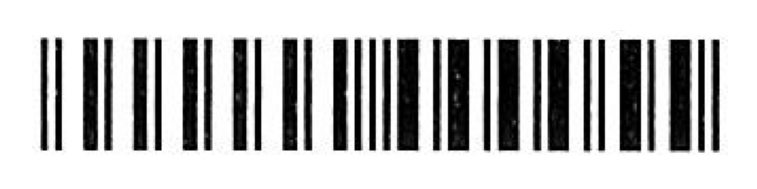

**Figura 6.12:** Decodifica del codice a barre lineare con *pyzbar*: immagine di input e dati estratti.


Codice a barre decodificato con successo [EAN13]:
0000000000055


In [15]:
import os
import urllib.request
import numpy as np
from pyzbar.pyzbar import decode
from morph import mm

barcode_path = 'dados/barcode.png'
url_github = (
    "https://raw.githubusercontent.com/fzampirolli/"
    "pdi-vc/master/all/cap06/dados/barcode.png"
)

# Se il file non esiste localmente, lo scarica automaticamente da GitHub
if not os.path.exists(barcode_path):
    print(f"[DOWNLOAD] Scaricando il codice a barre da GitHub: {url_github}")
    try:
        os.makedirs(os.path.dirname(barcode_path), exist_ok=True)
        urllib.request.urlretrieve(url_github, barcode_path)
        print("[DOWNLOAD] Immagine scaricata con successo!")
    except Exception as e:
        print(f"[DOWNLOAD] Errore nel scaricare il file: {e}")

if os.path.exists(barcode_path):
    image = mm.read(barcode_path)
else:
    # Fallback sintetico: genera un modello di barre verticali che simula un Code-128
    print("[AVVISO] File 'dati/codice_a_barre.png' non trovato.")
    print("        Uso di immagine sintetica per la dimostrazione del pipeline.")
    h, w = 100, 400
    img_synth = np.ones((h, w), dtype=np.uint8) * 255
    # Barre scure in posizioni regolari (modello semplificato)
    for x in range(20, w - 20, 8):
        if (x // 8) % 3 != 0:
            img_synth[:, x:x+4] = 0
    image = img_synth

mm.show(image)

# Esegue la decodifica di pyzbar
try:
    barcodes = decode(image)
except ImportError:
    print("[ERRORE] zbar di sistema non trovata. Esegui: !apt-get install -y libzbar0")
    barcodes = []

if barcodes:
    dados_bc = barcodes[0].data.decode("utf-8")
    tipo = barcodes[0].type
    print(f"Codice a barre decodificato con successo [{tipo}]:\n{dados_bc}")
else:
    print("[INFORMAZIONE] Nessun codice a barre rilevato nell'immagine.")
    print(
        "In immagine sintetica è previsto — "
        "sostituiscilo con il file reale per decodificare."
    )

## 6.9 Il MCTest come Caso di Studio: dal Prototipo al Sistema in Produzione

Fino a questo punto, le principali fasi del *pipeline* di elaborazione sono state presentate e analizzate singolarmente, inclusa la correzione dell'inclinazione (*deskew*), la rilevazione dei marker, la rettifica prospettica e la lettura dei *QRCodes*. Sebbene questo approccio faciliti la comprensione di ciascuna tecnica, le applicazioni reali richiedono l'integrazione di queste fasi in un flusso di elaborazione unico e coerente.

Il **MCTest** costituisce un esempio di tale integrazione. Sviluppato presso l'UFABC e reso disponibile come software open source, il sistema è utilizzato dal 2012 per la correzione automatizzata delle valutazioni, offrendo supporto a diversi modelli di fogli di risposta, griglie di correzione individualizzate e generazione automatica di report sulle prestazioni (ZAMPIROLLI, 2023).

A partire da questo punto, l'attenzione non è più rivolta all'implementazione isolata degli algoritmi, bensì all'organizzazione di tali algoritmi in un'applicazione completa. Oltre alla qualità dei metodi di elaborazione delle immagini, un sistema di questa natura deve soddisfare requisiti quali robustezza in diverse condizioni di acquisizione, facilità di manutenzione e capacità di evoluzione verso nuove funzionalità.

Nelle prossime sezioni, verrà analizzato il modulo di Visione Computazionale del MCTest, implementato nel file `CVMCTest.py`. L'obiettivo è mostrare come i concetti presentati nel corso di questo capitolo vengono combinati in un *pipeline* di elaborazione impiegato in un'applicazione reale.

### 6.9.1 Ottenimento e Preparazione del Modulo

Il file `CVMCTest.py` integra il sistema MCTest e, nella sua versione originale, dipende da modelli, configurazioni e altri componenti del *framework* Django. Poiché tali dipendenze non sono disponibili nell'ambiente utilizzato in questo capitolo, il modulo deve essere adattato per essere eseguito in modo indipendente.

A tale scopo, il file viene ottenuto direttamente dal repository del progetto tramite la libreria `requests`. Successivamente, vengono impiegati comandi `sed` per rimuovere le importazioni e le dipendenze specifiche dell'ambiente Web, producendo una versione autonoma del modulo. Questo adattamento preserva l'implementazione degli algoritmi di Visione Artificiale, consentendone l'esecuzione e l'analisi senza la necessità di installare o configurare l'intera infrastruttura del sistema MCTest.

In [16]:
import requests
CVMCTest = requests.get(
    "https://raw.githubusercontent.com/fzampirolli/mctest/master/exam/CVMCTest.py"
    )
with open('CVMCTest.py', 'w') as writefile:
    writefile.write(CVMCTest.text)

Ogni comando `sed` rimuove importazioni specifiche dall'ambiente Django,
rendendo il file `CVMCTest.py` utilizzabile in modo indipendente in questo capitolo.

In [17]:
# rimuovi righe con "form django.", ...
!sed --in-place '/from django./d' CVMCTest.py
!sed --in-place '/from exam./d' CVMCTest.py
!sed --in-place '/from mctest./d' CVMCTest.py
!sed --in-place '/from student./d' CVMCTest.py
!sed --in-place '/from topic./d' CVMCTest.py
!sed --in-place '/from .models import VariationExam/d' CVMCTest.py

> ### 📝 🧠 Perché rimuovere le dipendenze da Django?
>
> Nell'implementazione originale, il file `CVMCTest.py` fa parte di un'applicazione sviluppata con il *framework* Django e, pertanto, importa modelli, configurazioni e altri componenti specifici di tale ambiente. Poiché questi elementi non sono disponibili in questo capitolo, il modulo non può essere importato direttamente.
>
> I comandi `sed` rimuovono soltanto queste dipendenze, senza alterare le routine di Visione Computazionale implementate nel file. In questo modo, il modulo può essere eseguito in maniera indipendente, preservando il comportamento degli algoritmi presentati.
>
> Questa procedura illustra un principio importante dell'ingegneria del software: separare la logica dell'applicazione dall'infrastruttura in cui è inserita, facilitando il riutilizzo, i test e lo studio di componenti specifici.

### 6.9.2 Estrazione dell'Area delle Risposte

Dopo la lettura del foglio, la funzione `getAnswerArea` esegue automaticamente le fasi di rilevamento dei marcatori di riferimento e di rettifica prospettica presentate nelle sezioni precedenti. Come risultato, si ottiene un'immagine contenente solo la regione destinata alle risposte, allineata e con dimensioni standardizzate.

Questa standardizzazione semplifica le fasi successive di elaborazione, poiché la posizione dei campi di marcatura diventa nota e indipendente dalla posizione originale del foglio durante la scansione.

La [Figura 6.13](#fig-06-mctest-img-original) presenta il foglio delle risposte originale in scala di grigi, mentre la [Figura 6.14](#fig-06-mctest-answer-area) mostra la regione delle risposte ottenuta dopo l'applicazione della funzione `getAnswerArea`.

[ASSUNZIONE] Pagina convertita: extra02.qrcode_p0.png


[ASSUNZIONE] Pagina convertita: extra02.qrcode_p1.png


[ASSUNZIONE] Pagina convertita: extra02.qrcode_p2.png


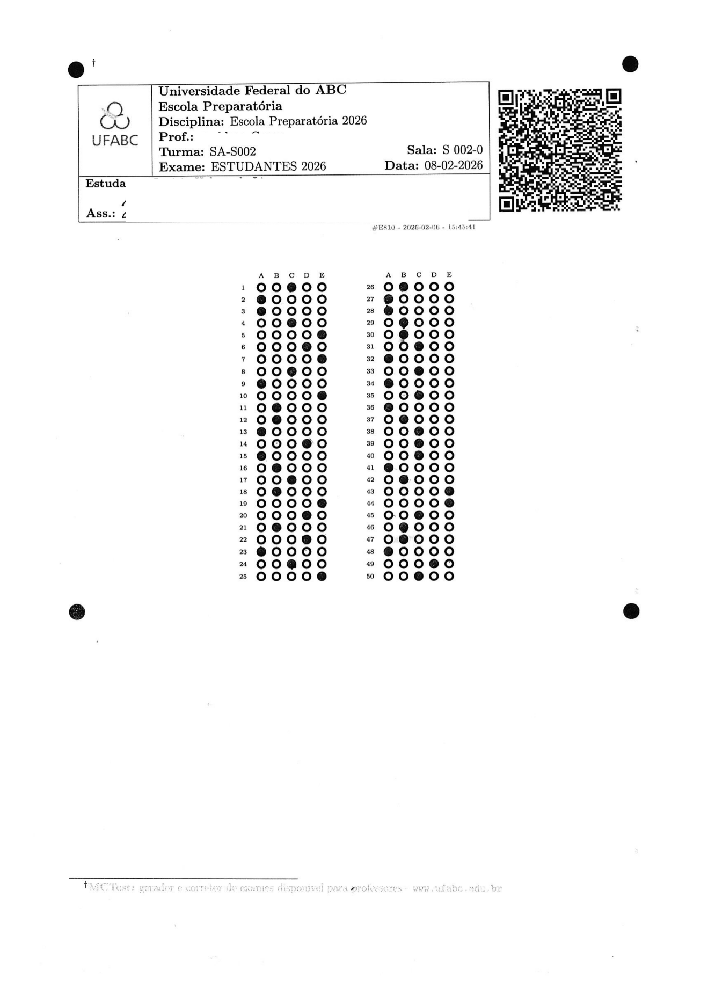

**Figura 6.13:** Immagine del foglio delle risposte in scala di grigio caricata dal PDF rasterizzato.


In [18]:
import os
from pdf2image import convert_from_path
from skimage import data as skdata
import cv2
from morph import mm

file = "dados/provas_qrcode_EP.pdf"
MYFILES = 'extra02.qrcode'

if os.path.exists(file):
    pages = convert_from_path(file, 200)  # dpi 100=min 500=max
    numPAGES = 0
    for page in pages:
        myfile0 = MYFILES + '_p' + str(numPAGES) + '.png'
        page.save(myfile0)
        numPAGES += 1
        print(f"[ASSUNZIONE] Pagina convertita: {myfile0}")
    pages.clear()
    img_color = mm.read(myfile0)
    img_inicial = mm.gray(img_color)
else:
    print("[AVVISO] File 'dati/prove_qrcode.pdf' non trovato.")
    print("        Uso dell'immagine pubblica skimage.data.page() come sostituto.")
    img_inicial = skdata.page()

mm.show(img_inicial)


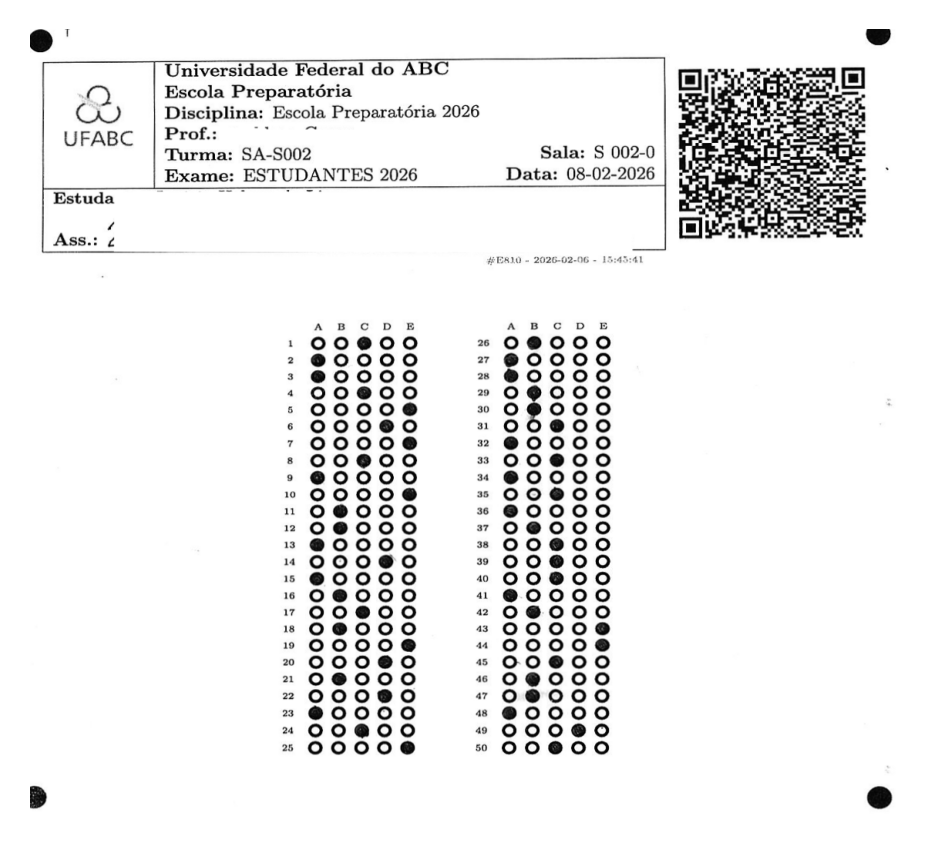

**Figura 6.14:** Area di risposte estratta da *getAnswerArea*: regione raddrizzata contenente i riquadri di marcatura.


In [19]:
import CVMCTest
countPage = 0
img_getAnswerArea = CVMCTest.cvMCTest.getAnswerArea(img_inicial, countPage)
mm.show(img_getAnswerArea)

**Nota di compatibilità:** le versioni recenti di NumPy (≥ 2.0) hanno rimosso l'alias `np.int0`. Se `CVMCTest.py` utilizza questo tipo, il comando seguente applica la correzione direttamente al file prima di ricaricarlo:

In [20]:
!sed -i 's/box = np.int0(cv2.boxPoints(rect))/box = cv2.boxPoints(rect).astype(np.intp)/' \
    ./CVMCTest.py

In [21]:
import importlib
import CVMCTest

importlib.reload(CVMCTest)

<module 'CVMCTest' from '/home/fz/VSCode/pdi-vc/gen/quarto/py.it/cap06/CVMCTest.py'>

### 6.9.3 Segmentazione del *QRCode*

Dopo l'estrazione dell'area delle risposte, il MCTest esegue due fasi preparatorie per la lettura delle marcature: la segmentazione del *QRCode* e la localizzazione dei riquadri che contengono le domande.

La funzione `segmentQRcode` isola la regione dell'immagine corrispondente al *QRCode*, presentata nella [Figura 6.15](#fig-06-mctest-qrcode-seg2).. Successivamente, tale regione viene elaborata dalla funzione `getQRCode`, responsabile della sua decodifica e dell'estrazione dei metadati della prova.

Qualora il *QRCode* non possa essere decodificato, l'elaborazione del foglio prosegue normalmente. Le risposte dello studente vengono comunque lette e registrate nel file CSV di output; solo le informazioni ottenute dal *QRCode*, come l'identificazione della prova o dello studente, rimangono non disponibili.

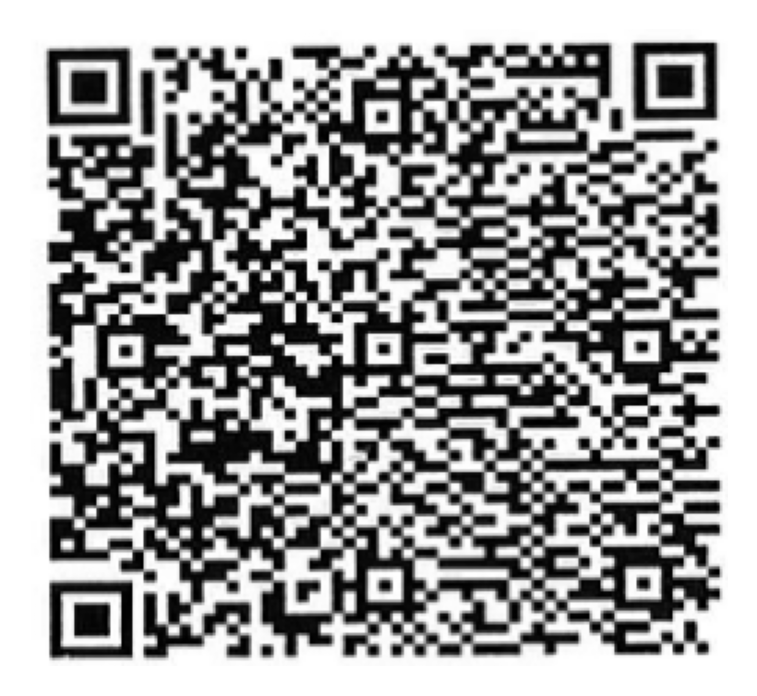

**Figura 6.15:** Regione del *QRCode* isolata da *segmentQRcode* all


In [22]:
import CVMCTest
imgQRcode = CVMCTest.cvMCTest.segmentQRcode(img_getAnswerArea, countPage)
mm.show(imgQRcode)

La funzione `CVMCTest.cvMCTest.getQRCode(img, countPage)` integra le fasi di segmentazione e decodifica del *QRCode*. Internamente, utilizza `CVMCTest.cvMCTest.decodeQRcode(imgQRcode)` per interpretare la *stringa* esadecimale codificata nel simbolo e costruire il dizionario `qr`, oltre a restituire l'indicatore logico `myFlagArea`, che informa se la lettura è stata eseguita con successo.

Il dizionario `qr` raccoglie i metadati della prova utilizzati nelle fasi successive di elaborazione. I suoi campi principali sono:

- **`date`:** identificatore temporale della prova, composto dalla data di generazione e da un *timestamp* interno del MCTest.
- **`idClassroom`, `idExam` e `idStudent`:** identificatori della classe, della prova e dello studente.
- **`term`:** periodo accademico.
- **`stylesheet`:** foglio di stile utilizzato nella generazione del modulo.
- **`var1` a `var5`:** numero di domande per ciascun livello di difficoltà.
- **`text`:** numero di domande a risposta aperta.
- **`answer`:** numero di alternative per domanda.
- **`numquest`:** numero totale di domande.
- **`correct`** e **`dbtext`:** campi compilati durante la correzione, contenenti il gabarit e informazioni aggiuntive.
- **`variations`** e **`variant`:** informazioni sulle versioni della prova.

Questi metadati identificano la prova e lo studente, consentendo di selezionare il gabarit corrispondente e di parametrizzare le fasi successive di lettura e correzione delle risposte.

In [23]:
myFlagArea, qr = CVMCTest.cvMCTest.getQRCode(img_inicial, countPage)
myFlagArea, qr

(True,
 {'date': '260208-1770403541363',
  'idClassroom': '955',
  'idExam': '810',
  'idStudent': '448898',
  'term': '0',
  'stylesheet': '1',
  'var1': '50',
  'var2': '0',
  'var3': '0',
  'var4': '0',
  'var5': '0',
  'text': '0',
  'answer': '5',
  'numquest': 50,
  'correct': '',
  'dbtext': '',
  'variations': '0',
  'variant': '0'})

Questi metadati consentono di identificare la prova, recuperare il corrispondente schema di correzione e parametrizzare le fasi successive dell'elaborazione.

Dopo la decodifica del *QRCode*, il processo torna all'area delle risposte per individuare i riquadri che contengono le marcature dello studente.

### 6.9.4 Localizzazione dei Riquadri delle Risposte

L'immagine prodotta da `getAnswerArea` contiene l'intera regione utile del foglio, inclusa l'intestazione, dove si trova il *QRCode*, e i riquadri destinati alle risposte. Poiché la lettura delle marcature utilizza solo questi riquadri, la regione corrispondente all'intestazione viene scartata tramite il ritaglio `img_getAnswerArea[300:, :]`.

La [Figura 6.16](#fig-06-mctest-answer-area-crop) presenta questa regione di interesse. Sebbene questo ritaglio venga successivamente utilizzato dalla funzione `findSquares` per localizzare i riquadri delle risposte, MCTest esegue inizialmente la lettura del *QRCode*, poiché esso contiene i metadati necessari per identificare la prova e configurare le fasi successive dell'elaborazione.

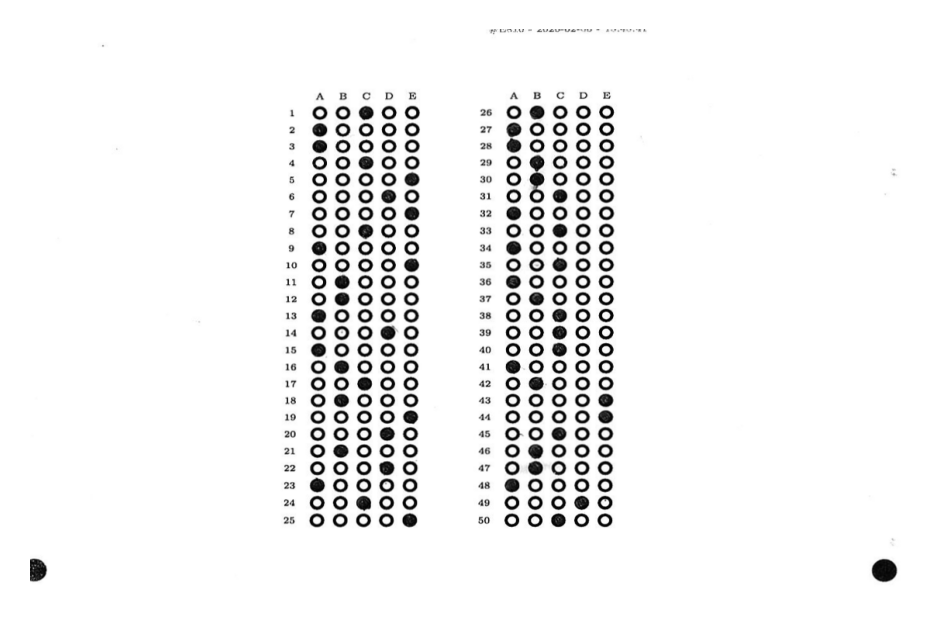

**Figura 6.16:** Ritaglio inferiore dell


In [24]:
img_getAnswerArea_aux = img_getAnswerArea[300:,:]
mm.show(img_getAnswerArea_aux)

La funzione `findSquares` riceve l'immagine dell'area delle risposte e i metadati memorizzati in `qr`, restituendo le coordinate dei riquadri che delimitano i gruppi di domande.

Ogni elemento di `rectSquares` contiene le coordinate dei vertici in alto a sinistra e in basso a destra di un riquadro di risposte, che saranno utilizzate nella fase di segmentazione delle bolle.

In [25]:
rectSquares = CVMCTest.cvMCTest.findSquares(qr,img_getAnswerArea, countPage)
rectSquares

[[[np.int64(395), np.int64(350)], [np.int64(950), np.int64(516)]],
 [[np.int64(394), np.int64(602)], [np.int64(951), np.int64(767)]]]

### 6.9.5 Lettura Automatica delle Risposte

Noti i metadati della prova (`qr`) e le coordinate dei riquadri delle risposte (`rectSquares`), MCTest identifica automaticamente le alternative selezionate dallo studente.

Il codice seguente integra le fasi presentate in precedenza. Per ciascun riquadro delimitato in `rectSquares`, le funzioni `setColumns` e `setLines` stimano, rispettivamente, il numero di alternative per domanda e il numero di domande a partire dalla distribuzione spaziale delle bolle. Successivamente, `segmentAnswers` determina l'alternativa selezionata in ciascuna domanda e `setAnswersOneLine` raccoglie i risultati di tutti i riquadri nel campo `qr['answers']`.

Nella modalità operativa adottata in questo capitolo, in cui MCTest viene eseguito in modo indipendente dal proprio database, il contenuto di `qr['answers']` viene confrontato con il gabarito memorizzato nella prima pagina del file PDF, corrispondente al modello di prova senza enunciati utilizzato negli esempi.

La [Figura 6.17](#fig-06-mctest-answers) presenta i riquadri delle risposte elaborati dall'algoritmo, mentre l'output del programma mostra il contenuto finale di `qr['answers']`.

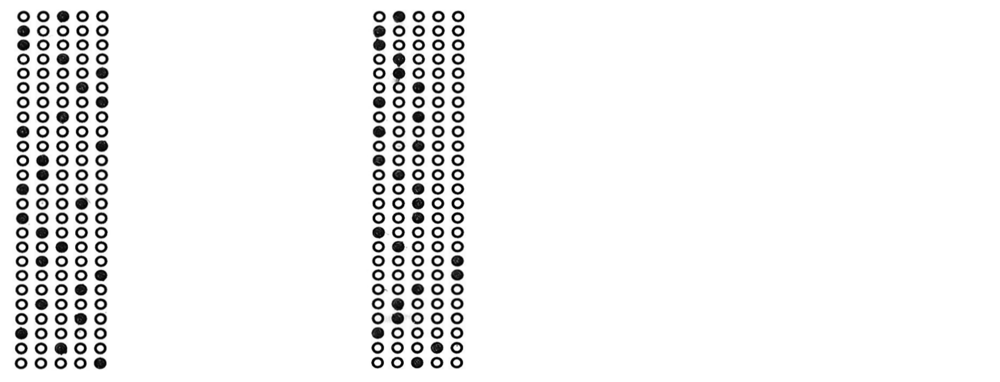

**Figura 6.17:** Risposte lette automaticamente da MCTest dopo la segmentazione e classificazione di tutte le bolle.


Risposte lette delle 50 domande:       
C,A,A,C,E,D,E,C,A,E,B,B,A,D,A,B,C,B,E,D,B,D,A,C,E,B,A,A,B,B,C,A,C,A,C,A,B,C,C,C,...


In [26]:
testAnswers = []
if myFlagArea:
  
  imgQ_all = []

  for countSquare in range(len(rectSquares)):
      p1, p2 = rectSquares[countSquare]

      if True:
          imgQi = CVMCTest.cvMCTest.imgAnswers[p1[0]:p2[0], p1[1]:p2[1]]
          [NUM_COLUMNS, img] = CVMCTest.cvMCTest.setColumns(imgQi, countPage, countSquare)
          [NUM_LINES, img] = CVMCTest.cvMCTest.setLines(imgQi, countPage, countSquare)
          NUM_RESPOSTAS = NUM_COLUMNS
          NUM_QUESTOES = NUM_LINES

      imgQiNC = CVMCTest.cvMCTest.imgAnswers[p1[0]:p2[0], p1[1]:p2[1]]
      testAnswers.append(CVMCTest.cvMCTest.segmentAnswers(
          [imgQi, imgQiNC], countPage, countSquare, NUM_QUESTOES, qr

      ))

      imgQ_all.append(imgQiNC)

  qr = CVMCTest.cvMCTest.setAnswarsOneLine(testAnswers, qr)  
  # lascia le risposte di ogni quadro su una riga

mm.show(imgQ_all)
print(f"Risposte lette delle {len(qr['answers'].split(","))} domande: \
      \n{qr['answers'][:-19]}...")

> ### 💡 Collegando i Punti
>
> Il campo `qr['answers']` rappresenta il risultato finale del *pipeline* di Visione Artificiale presentato in questo capitolo. La sua ottenzione integra tutte le fasi studiate, dalla rasterizzazione del documento e la rettifica geometrica fino all'estrazione dell'area delle risposte, alla decodifica del *QRCode*, alla localizzazione dei riquadri e all'identificazione delle alternative marcate.
>
> Questo *pipeline* illustra la transizione da un prototipo a un sistema in produzione. Nel MCTest, gli algoritmi di Visione Artificiale rimangono essenzialmente gli stessi; le principali differenze si concentrano su aspetti di ingegneria del software, come la gestione delle eccezioni, il supporto a diversi modelli di moduli, l'integrazione con il database, l'interfaccia Web e i meccanismi di audit e manutenzione.
>
> Negli esperimenti di questo capitolo, la prima pagina del file PDF contiene il foglio delle risposte corrette della prova, mentre le pagine successive corrispondono ai fogli delle risposte degli studenti. Dopo l'ottenimento di `qr['answers']`, il MCTest confronta automaticamente le risposte lette con il foglio delle risposte corrette per calcolare il punteggio di ciascuno studente.
>
> Nell'utilizzo completo del sistema, i risultati della correzione vengono consolidati in un file CSV e inviati al docente insieme a un file compresso contenente informazioni ausiliarie per l'audit. Tra questi file vi sono i ritagli delle domande in cui sono state rilevate marcature multiple o altre situazioni che richiedono una revisione manuale. Il docente può quindi ispezionare queste immagini, decidere l'interpretazione più adeguata e, se necessario, aggiornare il file CSV prima dell'importazione definitiva dei voti.

## 6.10 Ispezione Industriale Automatizzata

L'ispezione visiva automatizzata è un'applicazione della Visione Artificiale in cui immagini di pezzi o prodotti vengono analizzate per verificare il rispetto di criteri di qualità precedentemente definiti. In una linea di produzione, le immagini possono essere acquisite tramite telecamere o altri dispositivi di acquisizione ed elaborate automaticamente per identificare difetti, misurare dimensioni o verificare la presenza di componenti.

La strategia di ispezione dipende dalle caratteristiche del prodotto, dal tipo di difetto di interesse e dalla disponibilità di un'immagine di riferimento. In questo capitolo vengono presentati due approcci classici:

- **Sottrazione di immagini:** confronta l'immagine del pezzo ispezionato con un'immagine di riferimento considerata priva di difetti. Le regioni in cui la differenza di intensità supera una soglia vengono classificate come possibili difetti. Questo approccio presuppone che le immagini siano geometricamente allineate e siano state acquisite in condizioni di illuminazione simili.

- **Analisi della trama:** utilizza caratteristiche della trama della superficie per identificare regioni il cui aspetto differisce dal modello atteso, senza la necessità di un'immagine di riferimento. Questo approccio è adatto a materiali che presentano una trama approssimativamente omogenea, come tessuti, carte e superfici metalliche.

Nelle prossime sezioni, queste due strategie vengono illustrate mediante esempi costruiti a partire da immagini della libreria `skimage.data`. L'obiettivo è presentare i principi di funzionamento di ciascun approccio in esperimenti che possano essere integralmente riprodotti dal lettore.

### 6.10.1 Riferimenti e *Dataset* Pubblici

Nelle applicazioni di ispezione industriale, le prestazioni degli algoritmi di rilevamento dei difetti vengono spesso valutate su *dataset* pubblici, che forniscono immagini rappresentative e, in molti casi, annotazioni di riferimento (*ground truth*). In questo capitolo, tuttavia, gli esempi utilizzano immagini sintetiche derivate da `skimage.data` (vedi [Figura 6.18](#fig-06-industrial-defeito)), consentendo di riprodurre tutti gli esperimenti senza dipendere da basi di dati esterne.

Per studi più approfonditi e confronti tra algoritmi, si segnalano i seguenti *dataset* pubblici:

- **MVTec *Anomaly Detection Dataset* (MVTec AD):** insieme di immagini di oggetti e texture, contenente campioni senza difetti e con difetti, accompagnate da maschere di segmentazione a livello di pixel per le immagini anomale (BERGMANN, 2019). Disponibile su: <https://www.mvtec.com/company/research/datasets/mvtec-ad>.

- **Kolektor *Surface-Defect Dataset* (KolektorSDD):** insieme di immagini di componenti industriali con difetti superficiali annotati, utilizzato in studi di rilevamento e segmentazione dei difetti (TABERNIK, 2020). Disponibile su: <https://www.vicos.si/resources/kolektorsdd/>.

- **NEU *Surface Defect Database*:** insieme di immagini di superfici in acciaio laminato, organizzato in sei categorie di difetti superficiali, spesso impiegato nella valutazione di metodi di classificazione e rilevamento (SONG, 2013). Disponibile su: <http://faculty.neu.edu.cn/songkechen/zh_CN/zdylm/263270/list/index.htm>.

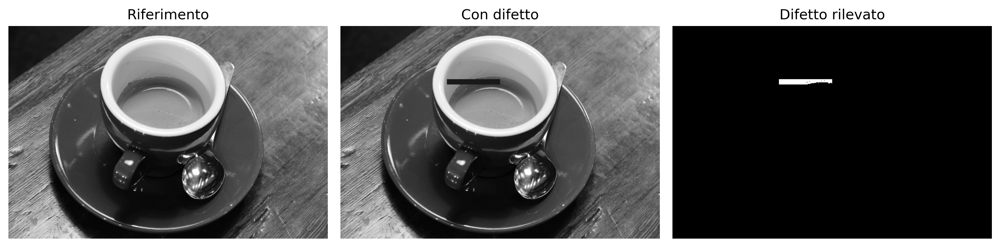

**Figura 6.18:** Rilevamento di difetti per sottrazione dell


Defeito detectado.


In [27]:
import numpy as np
from skimage import data, color
from morph import mm

# Immagine di riferimento (prodotto senza difetti)
product_color = data.coffee()
product_gray = color.rgb2gray(product_color)

# Inserimento di difetto simulato: graffio scuro di 10×100 px
defect_image = np.copy(product_gray)
defect_image[100:110, 200:300] = 0.1

# Rilevamento per sottrazione e sogliatura
difference = np.abs(product_gray - defect_image)
defect_threshold = 0.15          # regolabile in base all'applicazione
detected_defect = (difference > defect_threshold).astype(np.uint8) * 255

mm.show(
    [product_gray, defect_image, detected_defect],
    titles=["Riferimento", "Con difetto", "Difetto rilevato"],
    cols=3,
    figsize=(12, 4)
)

status = "Defeito detectado." if detected_defect.any() else "Produto conforme."
print(status)

> ### 📝 Sottrazione di Immagini: Registrazione Geometrica e Principio di Funzionamento
>
> La sottrazione di immagini presuppone che l'immagine di ispezione sia geometricamente allineata all'immagine di riferimento. Differenze di posizionamento, rotazione, scala o prospettiva producono regioni di differenza che possono essere confuse con difetti.
>
> In applicazioni con acquisizione controllata, questo allineamento viene ottenuto durante la cattura tramite maschere meccaniche, nastri trasportatori e telecamere fisse, consentendo di confrontare direttamente immagini successive. Un esempio è l'ispezione di una cassetta degli attrezzi sempre posizionata nella stessa orientazione per verificare l'assenza di un elemento.
>
> Quando questo controllo non è possibile, si impiega la **registrazione di immagini**, che stima una trasformazione geometrica per compensare differenze di traslazione, rotazione, scala e, quando necessario, prospettiva.
>
> Dopo la registrazione, si esegue il confronto pixel per pixel tra le due immagini. Nelle regioni senza variazioni, le differenze di intensità tendono a essere prossime a zero; dove è presente un difetto, emergono differenze locali che possono essere evidenziate tramite sogliatura. L'uso della differenza assoluta consente di rilevare sia difetti più chiari sia più scuri rispetto al riferimento.
>
> Le prestazioni del metodo dipendono principalmente dalla qualità dell'allineamento geometrico e dalla scelta della soglia utilizzata per separare piccole variazioni di acquisizione dalle differenze associate ai difetti.
>
> La [Figura 6.19](#fig-06-sim-06-industrial) illustra l'effetto del disallineamento tra le immagini e l'importanza della registrazione geometrica prima dell'applicazione della sottrazione.

In [28]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-06-industrial" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-06-industrial * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-06-industrial canvas { display: block; border-radius: 8px; border: 1px solid #e4dcc8; background: #ffffff; margin: 0 auto; }
  #sim-06-industrial button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-06-industrial button:hover { background: #e8dfcf; }
  #sim-06-industrial button.sim06_ind_active { background: #26241d !important; border-color: #26241d !important; color: #7ee7c6 !important; }
  #sim-06-industrial input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; margin: 4px 0; }
  .sim06_ind_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim06_ind_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .sim06_ind_grid { display: grid; grid-template-columns: repeat(auto-fit, minmax(220px, 1fr)); gap: 12px; }
  .sim06_ind_control_group { background: #ffffff; border: 1px solid #e9e3d3; border-radius: 10px; padding: 10px; }
  .sim06_ind_label_wrap { display: flex; justify-content: space-between; font-size: 11px; font-weight: 700; color: #5e5a4a; }
  .sim06_ind_val { font-family: monospace; color: #26241d; }
  .sim06_ind_canvases { display: flex; gap: 12px; flex-wrap: wrap; justify-content: center; align-items: flex-start; }
  .sim06_ind_cv_wrap { flex: 1; min-width: 200px; background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 10px; text-align: center; }
  .sim06_ind_cv_label { font-size: 11px; color: #5e5a4a; margin-bottom: 6px; font-weight: 700; }
  .sim06_ind_status { font-size: 11px; font-weight: 700; padding: 10px 12px; border-radius: 8px; text-align: center; margin-top: 10px; transition: all 0.2s ease; border: 1px solid transparent; line-height: 1.4; }
  .sim06_ind_status.ok { background: #eafaf1; color: #04342C; border-color: #a3e4d7; }
  .sim06_ind_status.fail { background: #fdecea; color: #4A1B0C; border-color: #f5b7b1; }
  .sim06_ind_status.warn { background: #fef5e7; color: #412402; border-color: #f8c471; }
  .sim06_ind_reg_toggle { display: flex; gap: 6px; margin-top: 8px; }
  .sim06_ind_reg_toggle button { flex: 1; font-weight: 600; justify-content: center; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">⚙️ Simulatore: Sottrazione di Immagini e Registrazione Geometrica</span>
  <span class="sim06_ind_pill">|Riferimento − Ispezione| &gt; Soglia</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim06_ind_panel">
    <div class="sim06_ind_grid">
      
      <div class="sim06_ind_control_group">
        <div style="font-size:11px; font-weight:700; color:#5e5a4a; margin-bottom:8px; border-bottom:1px solid #e9e3d3; padding-bottom:4px;">
          🔄 Disallineamento dell'Acquisizione (Nastro Trasportatore)
        </div>

        <div class="sim06_ind_label_wrap"><span>Traslazione orizzontale (Δx):</span><span id="sim06_ind_txVal" class="sim06_ind_val">0 px</span></div>
        <input type="range" id="sim06_ind_sliderTx" min="-8" max="8" step="1" value="0">

        <div class="sim06_ind_label_wrap"><span>Traslazione verticale (Δy):</span><span id="sim06_ind_tyVal" class="sim06_ind_val">0 px</span></div>
        <input type="range" id="sim06_ind_sliderTy" min="-8" max="8" step="1" value="0">

        <div class="sim06_ind_label_wrap"><span>Rotazione (θ):</span><span id="sim06_ind_rotVal" class="sim06_ind_val">0.0°</span></div>
        <input type="range" id="sim06_ind_sliderRot" min="-5" max="5" step="0.5" value="0">

        <div class="sim06_ind_reg_toggle">
          <button id="sim06_ind_btnModoDireto" class="sim06_ind_active">Sottrazione Diretta</button>
          <button id="sim06_ind_btnModoRegistro">Sottrazione con Registrazione</button>
        </div>
      </div>

      <div class="sim06_ind_control_group" style="display:flex; flex-direction:column; justify-space-between;">
        <div>
          <div style="font-size:11px; font-weight:700; color:#5e5a4a; margin-bottom:8px; border-bottom:1px solid #e9e3d3; padding-bottom:4px;">
            🎛️ Parametrizzazione dell'Ispettore
          </div>
          <div class="sim06_ind_label_wrap"><span>Soglia di tolleranza (T):</span><span id="sim06_ind_thVal" class="sim06_ind_val">35</span></div>
          <input type="range" id="sim06_ind_sliderTh" min="10" max="100" step="5" value="35">
        </div>
        <div style="text-align:right; margin-top:12px;">
          <button id="sim06_ind_btnReset">↺ Ripristina Simulazione</button>
        </div>
      </div>

    </div>

    <div id="sim06_ind_msgStatus" class="sim06_ind_status ok">Prodotto conforme.</div>
  </div>

  <!-- Canvases de Exibição -->
  <div class="sim06_ind_canvases" style="margin-top:14px;">
    <div class="sim06_ind_cv_wrap">
      <div class="sim06_ind_cv_label">1. Riferimento Stabile</div>
      <canvas id="sim06_ind_cvRef" width="220" height="170"></canvas>
    </div>
    <div class="sim06_ind_cv_wrap">
      <div class="sim06_ind_cv_label" id="sim06_ind_inspLabel">2. Ispezione (acquisizione reale)</div>
      <canvas id="sim06_ind_cvInsp" width="220" height="170"></canvas>
    </div>
    <div class="sim06_ind_cv_wrap">
      <div class="sim06_ind_cv_label" id="sim06_ind_diffLabel">3. Maschera di Anomalia</div>
      <canvas id="sim06_ind_cvDiff" width="220" height="170"></canvas>
    </div>
  </div>

  <!-- Explicação Teórica -->
  <div class="sim06_ind_panel" style="margin-top:14px;">
    <div style="font-size:11px; font-weight:700; color:#5e5a4a; margin-bottom:6px;">🧠 Sfida Pedagogica</div>
    <div style="font-size:11px; color:#5e5a4a; line-height:1.5;">
      Con la modalità <strong>Sottrazione Diretta</strong> attiva, utilizza i controlli di traslazione e rotazione per simulare piccoli
      disallineamenti sul nastro. Osserva che variazioni di pochi pixel o gradi generano bordi facili da confondere con difetti reali.
      Aumentare la <strong>soglia di tolleranza</strong> per ignorare questi bordi riduce la sensibilità, rendendo il sistema cieco a difetti sottili (come il graffio sul lato sinistro).
      Passando a <strong>Sottrazione con Registrazione</strong>, l'allineamento viene ripristinato prima della differenza, isolando con precisione il difetto reale senza falsi allarmi.
    </div>
  </div>

</div>
</div>

<script>
(function() {
  function initSim06Industrial(root){
    if (!root || root.dataset.sim06IndustrialInit) return;
    root.dataset.sim06IndustrialInit = "1";

    const W = 220, H = 170;

    const cvRef  = root.querySelector('#sim06_ind_cvRef');
    const cvInsp = root.querySelector('#sim06_ind_cvInsp');
    const cvDiff = root.querySelector('#sim06_ind_cvDiff');

    const ctxRef  = cvRef.getContext('2d');
    const ctxInsp = cvInsp.getContext('2d');
    const ctxDiff = cvDiff.getContext('2d');

    let modoRegistro = false;

    function drawComponent(ctx, hasDefect, tx, ty, rotDeg) {
      ctx.clearRect(0, 0, W, H);
      ctx.fillStyle = '#fafaf7';
      ctx.fillRect(0, 0, W, H);

      ctx.save();
      ctx.translate(W / 2 + tx, H / 2 + ty);
      ctx.rotate(rotDeg * Math.PI / 180);

      ctx.fillStyle = '#bdc3c7';
      ctx.strokeStyle = '#2c3e50';
      ctx.lineWidth = 3;

      ctx.beginPath();
      ctx.rect(-60, -45, 120, 90);
      ctx.fill(); ctx.stroke();

      ctx.beginPath();
      ctx.arc(0, 0, 35, 0, Math.PI * 2);
      ctx.fillStyle = '#ecf0f1';
      ctx.fill(); ctx.stroke();

      ctx.fillStyle = '#fafaf7';
      const holes = [[-40, -25], [40, -25], [-40, 25], [40, 25]];
      holes.forEach(([hx, hy]) => {
        ctx.beginPath();
        ctx.arc(hx, hy, 8, 0, Math.PI * 2);
        ctx.fill(); ctx.stroke();
      });

      ctx.beginPath();
      ctx.arc(0, 0, 12, 0, Math.PI * 2);
      ctx.fillStyle = '#2c3e50';
      ctx.fill();

      if (hasDefect) {
        ctx.save();
        ctx.strokeStyle = '#17202a';
        ctx.lineWidth = 3;
        ctx.lineCap = 'round';
        ctx.beginPath();
        ctx.moveTo(-45, 5);
        ctx.lineTo(-25, -15);
        ctx.stroke();
        ctx.restore();
      }

      ctx.restore();
    }

    function update() {
      const tx  = parseInt(root.querySelector('#sim06_ind_sliderTx').value);
      const ty  = parseInt(root.querySelector('#sim06_ind_sliderTy').value);
      const rot = parseFloat(root.querySelector('#sim06_ind_sliderRot').value);
      const th  = parseInt(root.querySelector('#sim06_ind_sliderTh').value);

      root.querySelector('#sim06_ind_txVal').textContent  = (tx > 0 ? '+' : '') + tx + ' px';
      root.querySelector('#sim06_ind_tyVal').textContent  = (ty > 0 ? '+' : '') + ty + ' px';
      root.querySelector('#sim06_ind_rotVal').textContent = (rot > 0 ? '+' : '') + rot.toFixed(1) + '°';
      root.querySelector('#sim06_ind_thVal').textContent  = th;

      drawComponent(ctxRef, false, 0, 0, 0);

      const tx_insp  = modoRegistro ? 0 : tx;
      const ty_insp  = modoRegistro ? 0 : ty;
      const rot_insp = modoRegistro ? 0 : rot;
      drawComponent(ctxInsp, true, tx_insp, ty_insp, rot_insp);

      const dataRef  = ctxRef.getImageData(0, 0, W, H);
      const dataInsp = ctxInsp.getImageData(0, 0, W, H);
      const dataDiff = ctxDiff.createImageData(W, H);

      let defectPixelsDetected = 0;

      for (let i = 0; i < dataRef.data.length; i += 4) {
        const diff = Math.abs(dataRef.data[i] - dataInsp.data[i]);

        if (diff > th) {
          dataDiff.data[i]   = 192; // R
          dataDiff.data[i+1] = 57;  // G
          dataDiff.data[i+2] = 43;  // B (#c0392b)
          dataDiff.data[i+3] = 255;
          defectPixelsDetected++;
        } else {
          dataDiff.data[i]   = 250;
          dataDiff.data[i+1] = 250;
          dataDiff.data[i+2] = 247; // #fafaf7
          dataDiff.data[i+3] = 255;
        }
      }
      ctxDiff.putImageData(dataDiff, 0, 0);

      root.querySelector('#sim06_ind_inspLabel').textContent = modoRegistro
        ? '2. Inspeção Registrada (alinhada)'
        : '2. Inspeção (captura real)';
      root.querySelector('#sim06_ind_diffLabel').textContent = modoRegistro
        ? '3. Máscara de Anomalia (com registro)'
        : '3. Máscara de Anomalia (direta)';

      const msgBox = root.querySelector('#sim06_ind_msgStatus');
      const hasMisalignment = (tx !== 0 || ty !== 0 || rot !== 0);
      const misalignmentVisible = hasMisalignment && !modoRegistro;

      if (defectPixelsDetected > 0) {
        if (misalignmentVisible && defectPixelsDetected > 150) {
          msgBox.className = 'sim06_ind_status fail';
          msgBox.innerHTML = '❌ Falsos positivos detectados! O desalinhamento mecânico gerou anomalias fantasmas nas bordas (' + defectPixelsDetected + ' px comprometidos).';
        } else if (misalignmentVisible) {
          msgBox.className = 'sim06_ind_status warn';
          msgBox.innerHTML = '⚠️ Anomalia localizada, mas parte da diferença ainda vem do desalinhamento (' + defectPixelsDetected + ' px afetados).';
        } else {
          msgBox.className = 'sim06_ind_status fail';
          msgBox.innerHTML = '⚠️ Anomalia localizada! Defeito superficial detectado na estrutura interna (' + defectPixelsDetected + ' px afetados).';
        }
      } else {
        if (misalignmentVisible) {
          msgBox.className = 'sim06_ind_status warn';
          msgBox.innerHTML = '✓ Conforme sob risco. O limiar alto omitiu as bordas desalinhadas, mas tornou o sistema cego para defeitos reais.';
        } else {
          msgBox.className = 'sim06_ind_status ok';
          msgBox.innerHTML = '✓ Produto conforme. Sistema corretamente registrado em nível geométrico.';
        }
      }
    }

    ['#sim06_ind_sliderTx', '#sim06_ind_sliderTy', '#sim06_ind_sliderRot', '#sim06_ind_sliderTh'].forEach(sel => {
      root.querySelector(sel).addEventListener('input', update);
    });

    const btnDireto   = root.querySelector('#sim06_ind_btnModoDireto');
    const btnRegistro = root.querySelector('#sim06_ind_btnModoRegistro');

    btnDireto.addEventListener('click', () => {
      modoRegistro = false;
      btnDireto.classList.add('sim06_ind_active');
      btnRegistro.classList.remove('sim06_ind_active');
      update();
    });

    btnRegistro.addEventListener('click', () => {
      modoRegistro = true;
      btnRegistro.classList.add('sim06_ind_active');
      btnDireto.classList.remove('sim06_ind_active');
      update();
    });

    root.querySelector('#sim06_ind_btnReset').addEventListener('click', function() {
      root.querySelector('#sim06_ind_sliderTx').value = 0;
      root.querySelector('#sim06_ind_sliderTy').value = 0;
      root.querySelector('#sim06_ind_sliderRot').value = 0;
      root.querySelector('#sim06_ind_sliderTh').value = 35;
      modoRegistro = false;
      btnDireto.classList.add('sim06_ind_active');
      btnRegistro.classList.remove('sim06_ind_active');
      update();
    });

    update();
  }

  function tryInitSim06Industrial(){
    var root = document.getElementById('sim-06-industrial');
    if (root) initSim06Industrial(root); else setTimeout(tryInitSim06Industrial, 200);
  }
  tryInitSim06Industrial();
})();
</script>
</div>
""")

**Figura 6.19:** Simulatore interattivo di ispezione industriale per sottrazione di immagini: controlla le distorsioni geometriche di disallineamento (registrazione) e la soglia di rilevamento per osservare l


### 6.10.2 Rilevamento di Difetti tramite Analisi della Texture

In applicazioni in cui non è disponibile un'immagine di riferimento, il rilevamento di difetti può basarsi sulle caratteristiche della texture della superficie. In questo caso, si cerca di identificare regioni la cui apparenza differisce dal pattern predominante del materiale.

In questo esempio, si utilizza la **varianza locale** come misura di eterogeneità. Per ogni posizione dell'immagine, si calcola la varianza dei livelli di intensità in un intorno di dimensioni fisse. Le regioni con bassa varianza tendono a presentare una texture più uniforme, mentre alterazioni locali, come graffi, macchie o imperfezioni, possono produrre valori più elevati di tale misura.

La [Figura 6.20](#fig-06-industrial-textura) illustra questa procedura utilizzando l'immagine `skimage.data.brick()`. Inizialmente, si calcola la mappa della varianza locale tramite una finestra scorrevole. Successivamente, si applica una sogliatura per evidenziare le regioni la cui varianza supera il valore specificato, identificando potenziali aree di interesse per l'ispezione.

#### Modellazione Matematica

Si consideri un'immagine in scala di grigi rappresentata da

$$
f:\Omega\subset\mathbb{Z}^2\rightarrow\mathbb{R},
$$

dove $\Omega$ è il dominio dell'immagine e $f(x,y)$ rappresenta l'intensità del pixel nelle coordinate $(x,y)$. Nelle immagini a 8 bit, queste intensità appartengono all'intervallo $[0,255]$. In questo esempio, tuttavia, sono state normalizzate nell'intervallo $[0,1]$, senza alterare il funzionamento dell'algoritmo.

Per ogni posizione dell'immagine, si considera un intorno quadratico $W_{x,y}$ di dimensione $15\times15$ pixel.

La media locale è data da

$$
\mu(x,y)=
\frac{1}{|W_{x,y}|}
\sum_{(u,v)\in W_{x,y}}
f(u,v),
$$

e la varianza locale è calcolata come

$$
\sigma^2(x,y) =
\frac{1}{|W_{x,y}|}
\sum_{(u,v)\in W_{x,y}}
f(u,v)^2 -
\mu(x,y)^2.
$$

Nell'implementazione seguente, queste due medie sono ottenute tramite la funzione `cv2.blur`,

```python
mean  = cv2.blur(img, (15,15))
mean2 = cv2.blur(img**2, (15,15))
var   = mean2 - mean**2
```

Successivamente, si calcola la differenza tra le mappe di varianza dell'immagine di riferimento e dell'immagine ispezionata,

$$
D(x,y)=
\left|
\sigma_d^2(x,y)-\sigma_r^2(x,y)
\right|,
$$

dove $\sigma_r^2(x,y)$ e $\sigma_d^2(x,y)$ sono, rispettivamente, le varianze locali dell'immagine di riferimento e dell'immagine contenente il difetto. Dopo la normalizzazione della mappa $D(x,y)$, si applica una sogliatura per ottenere la maschera delle possibili anomalie.

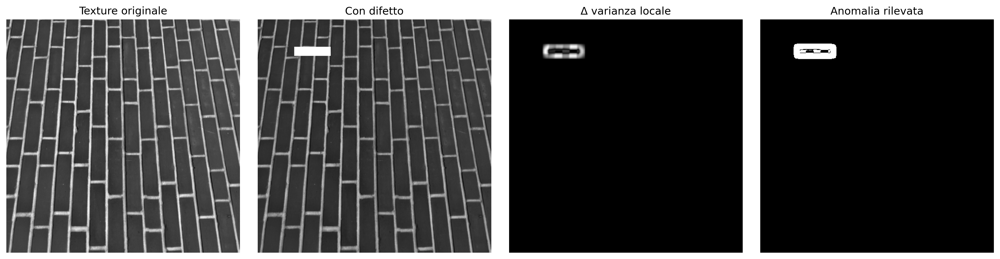

**Figura 6.20:** Rilevamento dell


Defeito de textura detectado.


In [29]:
import numpy as np
import cv2
from skimage import data as skdata
from morph import mm

# Immagine di texture uniforme (mattone)
texture = skdata.brick().astype(np.float32) / 255.0

# Inserimento di difetto sintetico: macchia chiara 20×80 px
texture_defect = np.copy(texture)
texture_defect[60:80, 80:160] = 0.95

# Mappa di varianza locale (finestra 15×15)
def variancia_local(img, ksize=15):
    img_f = img.astype(np.float32)
    mean  = cv2.blur(img_f, (ksize, ksize))
    mean2 = cv2.blur(img_f ** 2, (ksize, ksize))
    return np.clip(mean2 - mean ** 2, 0, None)

var_ref    = variancia_local(texture)
var_defect = variancia_local(texture_defect)
diff_var   = np.abs(var_defect - var_ref)

# Normalizza e soglia
diff_norm = (diff_var / diff_var.max() * 255).astype(np.uint8)
_, mask   = cv2.threshold(diff_norm, 30, 255, cv2.THRESH_BINARY)

mm.show(
    [texture, texture_defect, diff_norm, mask],
    titles=["Texture originale", "Con difetto", "Δ varianza locale", "Anomalia rilevata"],
    cols=4,
    figsize=(16, 4)
)

status = "Defeito de textura detectado." if mask.any() else "Superfície conforme."
print(status)


> ### 📝 🧠 Perché funziona? — Analisi della trama
>
> La varianza locale misura la dispersione delle intensità in un intorno dell'immagine. Nelle regioni in cui la trama rimane uniforme, tale misura tende a variare poco. Quando un difetto modifica il pattern della superficie, anche la distribuzione delle intensità si altera, producendo differenze nella varianza locale.
>
> In questo capitolo, la rilevazione viene eseguita confrontando le mappe di varianza dell'immagine di riferimento e dell'immagine con difetto. Dopo la normalizzazione, si applica una sogliatura per evidenziare le regioni in cui tale differenza supera un valore specificato.
>
> I parametri principali del metodo sono la dimensione della finestra utilizzata nel calcolo della varianza e la soglia impiegata nella segmentazione. Finestre più piccole sono più sensibili ai dettagli fini, mentre finestre più grandi producono mappe più uniformi e possono ridurre la risposta a difetti di piccole dimensioni.

## 6.11 Riassunto

In questo capitolo sono stati presentati metodi di Visione Artificiale applicati all'analisi di documenti e all'ispezione visiva automatizzata. Le principali tecniche studiate sono state:

- **Pre-elaborazione di documenti:** applicazione di normalizzazione dello sfondo, equalizzazione adattativa (CLAHE) e sogliatura di Otsu per ridurre gli effetti dell'illuminazione non uniforme e migliorare la segmentazione del testo.

- **Riconoscimento ottico dei caratteri (OCR):** conversione di immagini di documenti in testo codificato tramite Tesseract OCR, evidenziando l'influenza della pre-elaborazione sulla qualità del riconoscimento.

- **Traduzione automatica:** applicazione di tecniche di elaborazione del linguaggio naturale per tradurre il testo ottenuto dall'OCR.

- **Rettifica geometrica di documenti:** utilizzo del rilevatore di bordi di Canny, della Trasformata di Hough e di trasformazioni proiettive per correggere la prospettiva di documenti digitalizzati.

- **Localizzazione e rettifica di moduli:** impiego di operazioni morfologiche, analisi dei contorni e trasformazione di prospettiva per identificare marcatori di riferimento ed estrarre automaticamente regioni di interesse.

- **Lettura di codici bidimensionali e unidimensionali:** rilevamento e decodifica di *QRCodes* e codici a barre per l'identificazione automatica di documenti e metadati.

- **Riconoscimento ottico dei marcatori (OMR):** lettura automatizzata di moduli e fogli di risposta, illustrata da un caso di studio del sistema MCTest.

- **Ispezione industriale:** rilevamento di difetti mediante confronto con un'immagine di riferimento e analisi della varianza locale.

Nel corso del capitolo, gli algoritmi sono stati implementati e valutati con immagini della libreria `skimage.data` e con documenti reali, consentendo di riprodurre gli esperimenti presentati.

### Prossimi Passi

I metodi presentati in questo capitolo mostrano come tecniche di Elaborazione Digitale delle Immagini, Visione Artificiale ed Elaborazione del Linguaggio Naturale possano essere integrate in *pipeline* per l'analisi automatizzata di documenti.

Nel prossimo capitolo verranno studiate tecniche di **estrazione di caratteristiche** e **riconoscimento di pattern**, con particolare attenzione ai descrittori capaci di rappresentare le immagini tramite attributi numerici per confronto, classificazione e riconoscimento automatico. Questi concetti costituiscono la base per i capitoli dedicati all'apprendimento automatico e all'apprendimento profondo applicati alla Visione Artificiale.

## 6.12 🤖 Uso del Gemini Notebook come Tutor Complementare

Come supporto allo studio di questo capitolo, si raccomanda l'utilizzo del **Gemini Notebook** come tutor complementare. Lo strumento impiega modelli di intelligenza artificiale per rispondere a domande, elaborare riassunti e spiegare concetti sulla base dei documenti forniti come fonte di consultazione, consentendo allo studente di rivedere il contenuto in modo interattivo.

> ### ❗ 🎓 Studia con il Tutor Intelligente
>
> [🚀 ACCEDI AL GEMINI NOTEBOOK: CAPITOLO 06](https://notebooklm.google.com/notebook/835ec2a8-dbc3-46c4-8c2c-2040af3754a4)
>
> #### 🌐 Lingua e Linguaggio di Programmazione
>
> Il progetto di questo capitolo nel Gemini Notebook è stato realizzato esclusivamente con il testo in **portoghese** e gli esempi di codice in **Python**. Se stai studiando dall'edizione in inglese o francese, oppure seguendo il percorso in C++, le risposte del tutor potrebbero non corrispondere esattamente alla versione che stai leggendo.
>
> #### ⚠️ Uso Critico delle Risposte
>
> Le risposte generate dal Gemini Notebook sono prodotte automaticamente da un modello di intelligenza artificiale e possono contenere omissioni o imprecisioni. Per questo motivo, devono essere utilizzate come materiale di supporto e non come sostituto dello studio del capitolo.
>
> Ogni volta che sorgono dubbi, consulta il testo di questo libro, esegui gli esempi presentati e, quando necessario, integra la consultazione con libri, articoli scientifici e altre fonti accademiche affidabili.

## 6.13 Lista di Esercizi

Gli esercizi seguenti consolidano i concetti presentati in questo capitolo tramite adattamenti, esperimenti ed estensioni degli algoritmi sviluppati nel testo.

1. **(10%)** Indagare l'influenza dell'angolo di inclinazione nella fase di *deskew*. Generare versioni ruotate dell'immagine `skimage.data.page()` per angoli tra $-10^\circ$ e $10^\circ$, applicare l'algoritmo presentato nel capitolo e confrontare l'angolo stimato con l'angolo utilizzato nella rotazione. Presentare i risultati in una tabella e discutere la precisione del metodo.

2. **(15%)** Applicare la normalizzazione dello sfondo e il CLAHE (utilizzando almeno tre combinazioni di `clipLimit` e `tileGridSize`) all'immagine `skimage.data.page()` degradata artificialmente con gradiente di illuminazione e ombra laterale. Segmentare ciascuna versione tramite il metodo di Otsu e confrontare i risultati utilizzando il numero di componenti connessi spuri e la metrica IoU rispetto a una maschera di riferimento costruita manualmente.

3. **(15%)** Indagare la sensibilità del filtraggio per circolarità, $C=\frac{4\pi A}{P^2},$ nella rilevazione dei marcatori circolari. Utilizzando il simulatore della [Figura 6.9](#fig-06-sim-06-circularidade), generare dischi sintetici con rumore geometrico crescente e valutare le soglie $C\in\{0{,}5,\ 0{,}6,\ 0{,}7,\ 0{,}8\}$. Presentare una tabella che correla la soglia al numero di falsi positivi e falsi negativi e discutere il compromesso tra sensibilità e specificità.

4. **(15%)** A partire dai quattro marcatori rilevati, implementare la rettifica prospettica utilizzando `cv2.getPerspectiveTransform` e `cv2.warpPerspective`. Successivamente, perturbare artificialmente le coordinate dei punti di controllo con rumore gaussiano di deviazione standard $\sigma\in\{1,3,5\}$ pixel e valutare l'errore di riproiezione ottenuto dopo l'omografia inversa.

5. **(15%)** Adattare il *pipeline* di acquisizione e rettifica sviluppato in questo capitolo per elaborare documenti contenenti codici a barre lineari in sostituzione dei *QRCodes*. Rasterizzare il PDF con `pdf2image` a 300 DPI, applicare il *deskew*, decodificare il simbolo con `pyzbar` e presentare l'immagine rettificata insieme alla sequenza di caratteri ottenuta.

6. **(15%)** Estendere la lettura delle bolle del MCTest per identificare tre situazioni: **OK**, **BIANCO** (nessuna alternativa marcata) e **DOPPIA MARCAZIONE** (due o più alternative al di sopra di una soglia di riempimento). Valutare almeno tre valori di tale soglia, presentare i risultati in un `pandas.DataFrame` e discutere la loro influenza sulla classificazione delle risposte.

7. **(15%)** Costruire un *pipeline* di ispezione industriale combinando sottrazione di immagini e analisi di varianza locale della trama su un insieme di immagini sintetiche contenenti difetti simulati. Per ciascuna immagine, generare una maschera di riferimento (*ground truth*), calcolare la metrica IoU (*Intersection over Union*) dei due approcci per diverse soglie di decisione e presentare i risultati in tabelle e visualizzazioni prodotte con `mm.show`.

8. **(Bonus – 10%)** Implementare manualmente la stima dell'angolo di inclinazione senza utilizzare `cv2.HoughLines` o `cv2.HoughLinesP`. A partire dalla mappa dei bordi ottenuta dal rilevatore di Canny, costruire l'accumulatore della Trasformata di Hough, $\rho=x\cos\theta+y\sin\theta,$ per $\theta\in[-45^\circ,45^\circ]$, identificare i massimi dell'accumulatore e stimare l'inclinazione tramite la mediana delle rette rilevate. Confrontare i risultati con l'implementazione di OpenCV e discutere l'influenza di rette spurie sulla stima finale.

## Riferimenti del Capitolo

La fondazione teorica e i casi di studio presentati in questo capitolo si basano sui seguenti riferimenti:

- Gonzalez (2018), per i fondamenti del rilevamento dei bordi, la sogliatura, la segmentazione, le operazioni morfologiche, il riconoscimento ottico dei caratteri e le trasformazioni geometriche applicate all'analisi dei documenti.

- Szeliski (2022), per la Trasformata di Hough, la registrazione e l'allineamento delle immagini, le trasformazioni proiettive (omografie) e i fondamenti dell'ispezione visiva automatizzata.

- Bradski (2008), per l'utilizzo della libreria OpenCV nelle fasi di rilevamento dei bordi, Trasformata di Hough, trasformazioni geometriche, analisi dei contorni e decodifica dei *QRCode*.

- Smith (2007) e Smith (2013), per l'architettura, il funzionamento e l'evoluzione del motore di riconoscimento ottico dei caratteri **Tesseract OCR**, impiegato negli esempi di OCR presentati in questo capitolo.

- Bahdanau (2015) e Vaswani (2017), per i fondamenti della traduzione automatica basata su reti neurali, inclusi i meccanismi di attenzione e le architetture *transformer*.

- Zampirolli (2023), per la descrizione del sistema MCTest, utilizzato come caso di studio di un *pipeline* completo per la lettura e la correzione automatizzata dei fogli di risposta.

- Bergmann (2019), Tabernik (2020) e Song (2013), per i *dataset* pubblici di ispezione industriale **MVTec AD**, **KolektorSDD** e **NEU Surface Defect Database**, utilizzati come riferimento per la valutazione e il confronto degli algoritmi di rilevamento dei difetti.

------------------------------------------------------------------------


<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.it/cap06/cap06.EPs_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

## 6.14 💻 Parte Pratica con Esercizi di Programmazione

Gli esercizi di programmazione (EP) di questa sezione completano i concetti presentati lungo il Capitolo 6 attraverso l’implementazione di algoritmi legati all’ispezione industriale e all’analisi dei documenti. L’obiettivo è consolidare i fondamenti studiati, riproducendo, in scala ridotta, le fasi di una *pipeline* tipica della Visione Artificiale.

A differenza dei capitoli precedenti, i cui esercizi enfatizzavano operazioni più direttamente legate ai dati immagine, gli EP di questo capitolo si concentrano sulle **grandezze intermedie** prodotte durante l’elaborazione, come aree, perimetri, circolarità, angoli di rette, gradi di riempimento di bolle, mappe di varianza e mappe di differenza. Questo approccio permette di comprendere e validare ogni fase della *pipeline* in modo indipendente, senza dipendere da librerie specializzate per l’acquisizione di immagini, la rilevazione di marcatori o la decodifica di codici — ad eccezione dell’esercizio di chiusura del capitolo (EP06_08), che introduce intenzionalmente l’uso di OpenCV per la segmentazione e la decodifica reale di un *QRCode*, chiudendo il ciclo tra i concetti teorici e gli strumenti impiegati nella pratica.

Gli esercizi seguono la stessa sequenza concettuale del capitolo, in ordine crescente di complessità. Inizialmente vengono affrontate le metriche di valutazione della segmentazione, utilizzate per quantificare la qualità delle maschere binarie. Successivamente, si studiano criteri geometrici per la selezione dei marcatori, la classificazione delle marcature nei moduli e la stima dell’inclinazione dei documenti tramite la Trasformata di Hough. Nella parte finale, gli esercizi esplorano la normalizzazione dell’illuminazione, il rilevamento dei difetti tramite analisi della trama e l’integrazione tra registrazione geometrica e sottrazione di immagini in una *pipeline* semplificata di ispezione industriale.

Ogni esercizio rappresenta una fase isolata di un sistema reale di Visione Artificiale, consentendo di validare singolarmente concetti che, nelle applicazioni industriali, vengono combinati in un’unica *pipeline* di ispezione.

### 🗺️ Legenda della Difficoltà

| Livello | Significato | EP |
|:---:|---|---|
| 🟢 | Molto facile / facile — implementazione di un singolo concetto o algoritmo semplice | EP06_01, EP06_02 |
| 🟡 | Facile–medio — gestione di più casi o utilizzo di criteri statistici semplici | EP06_03, EP06_04 |
| 🟠 | Medio — elaborazione matriciale punto a punto | EP06_05 |
| 🔴 | Difficile — elaborazione matriciale con operazioni di vicinato (finestra scorrevole) | EP06_06 |
| 🟣 | Molto difficile — integrazione di più fasi di una *pipeline* di Visione Artificiale | EP06_07 |
| ⚫ | Speciale — uso di una libreria specializzata (`cv2`) per la segmentazione geometrica e la decodifica reale di codici a barre/QRCode | EP06_08 |

> ### ❗ Linee guida per la Risoluzione degli Esercizi di Programmazione
>
> Salvo diversa indicazione, tutti gli esercizi utilizzano la convenzione di coordinate matriciali `[riga][colonna]`, con origine in $(0,0)$ nell’angolo superiore sinistro dell’immagine.
>
> Quando è necessario un arrotondamento numerico, si deve utilizzare l’arrotondamento standard al numero intero più vicino (*round half away from zero*, con `np.floor(img + 0.5)`). I confronti con soglie (ad esempio, circolarità, varianza, differenza di intensità o grado di riempimento) devono essere considerati **stretti** (`>`), salvo che il testo non specifichi esplicitamente un altro criterio.
>
> Ogni esercizio è stato ideato per enfatizzare un concetto specifico presentato nel capitolo. Si raccomanda di implementare inizialmente la soluzione in modo diretto e, solo dopo la sua validazione, cercare alternative più efficienti o più generali.

### 🎯 Obiettivo di questo Quaderno

Questo quaderno è stato realizzato per supportare lo sviluppo, la validazione e i test delle soluzioni degli **Esercizi di Programmazione (EP)** in un ambiente interattivo, come Google Colab o Jupyter Notebook. Dopo aver verificato il funzionamento dell'implementazione con i casi di test presentati, il codice può essere inviato a Moodle per la valutazione ufficiale.

#### *Download*

Esegui la cella seguente per ottenere i file `morph.py` e `testsuite.py`, utilizzati dagli esercizi di questo capitolo.

In [30]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Ambiente pronto. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


#### Esecuzione dei Test

Dopo aver implementato la soluzione, esegui `TestSuite("EP06_01.estensione").run()` in una nuova cella, sostituendo `estensione` con il linguaggio utilizzato (`.py`, `.java`, `.c`, `.cpp`, `.js` o `.r`). Il sistema recupera automaticamente i casi di test dal repository del corso, esegue il programma e presenta il risultato della valutazione.

In Python, è anche possibile testare la soluzione direttamente da una *stringa*, senza la necessità di salvare il codice in un file. A tale scopo, memorizza il programma in una variabile e utilizza il metodo `run_code`:

```python
codigo = """
# 6 ... il tuo codice qui ...
"""

TestSuite("EP06_01").run_code(codigo)
```

### 6.0.1 EP06_01 🟢 Valutazione della Segmentazione tramite IoU (*Intersection over Union*)

Nel corso di questo capitolo, diverse fasi del *pipeline* producono **maschere binarie**, come nella segmentazione di documenti, nella localizzazione di *QRCodes* e nel rilevamento di difetti. Per valutare oggettivamente la qualità di queste segmentazioni, è necessario confrontarle con una maschera di riferimento (*ground truth*).

Una delle metriche più utilizzate a questo scopo è la **IoU** (*Intersection over Union*, o Intersezione su Unione), definita come il rapporto tra l'area di intersezione e l'area di unione di due maschere binarie. Quanto maggiore è il valore della IoU, tanto maggiore è la concordanza tra la segmentazione prodotta dall'algoritmo e il riferimento.

#### 6.0.1.1 📋 Linee Guida di Implementazione

1. **Dimensioni:** Leggere gli interi $L$ (numero di righe) e $C$ (numero di colonne).
2. **Maschera di riferimento:** Leggere gli $L \times C$ elementi binari (0 o 1) della matrice `ref`.
3. **Maschera predetta:** Leggere gli $L \times C$ elementi binari (0 o 1) della matrice `pred`.
4. **Intersezione:** Contare il numero di posizioni $(i,j)$ per le quali `ref[i][j] = 1` e `pred[i][j] = 1`.
5. **Unione:** Contare il numero di posizioni $(i,j)$ per le quali `ref[i][j] = 1` o `pred[i][j] = 1`.
6. **Caso degenere:** Se l'unione è uguale a $0$, definire $\mathrm{IoU}=1{,}0$, poiché entrambe le maschere sono vuote.
7. **Calcolo:** Se l'unione è maggiore di zero, calcolare

$$
\mathrm{IoU}=
\frac{|\mathrm{Intersezione}|}
{|\mathrm{Unione}|}.
$$

8. **Classificazione:** Determinare la classificazione qualitativa utilizzando il valore di IoU **prima** dell'arrotondamento.
9. **Arrotondamento:** Visualizzare la IoU con quattro cifre decimali.
10. **Output:** Stampare, in quest'ordine, l'intersezione, l'unione, la IoU e la classificazione.

#### 6.0.1.2 📌 Vincoli Computazionali

- Se l'unione è uguale a $0$, non deve essere eseguita la divisione; la IoU deve essere definita come $1{,}0$.
- Le fasce di classificazione utilizzano confronti non stretti ($\geq$).
- La classificazione deve essere eseguita utilizzando il valore della IoU a piena precisione, prima dell'arrotondamento per la visualizzazione.

#### 6.0.1.3 🧠 Fondamento Teorico

La IoU è definita da

$$
\mathrm{IoU}=
\frac{|R\cap P|}
{|R\cup P|},
$$

dove:

- $R$ rappresenta l'insieme dei pixel appartenenti alla maschera di riferimento;
- $P$ rappresenta l'insieme dei pixel appartenenti alla maschera predetta;
- $|R\cap P|$ corrisponde al numero di pixel appartenenti simultaneamente a entrambe le maschere;
- $|R\cup P|$ corrisponde al numero di pixel appartenenti ad almeno una delle maschere.

| Fascia di IoU | Classificazione | Interpretazione |
|---|---|---|
| $\mathrm{IoU}\geq0{,}90$ | `ECCELLENTE` | Concordanza molto elevata tra le maschere. |
| $0{,}70\leq\mathrm{IoU}<0{,}90$ | `BUONO` | Piccole differenze tra le maschere. |
| $0{,}50\leq\mathrm{IoU}<0{,}70$ | `ACCETTABILE` | Concordanza parziale tra le maschere. |
| $\mathrm{IoU}<0{,}50$ | `SCARSO` | Bassa concordanza tra le maschere. |

La IoU dipende solo dalla sovrapposizione tra le maschere e, pertanto, è indipendente dalla dimensione dell'immagine.

#### 6.0.1.4 📦 Specifica di Input e Output (VPL)

**Input:**

- Riga 1: intero $L$.
- Riga 2: intero $C$.
- Prossime $L$ righe: elementi binari (0 o 1) della matrice `ref`.
- Prossime $L$ righe: elementi binari (0 o 1) della matrice `pred`.

**Output:**

- Riga 1: `Intersezione: X`
- Riga 2: `Unione: Y`
- Riga 3: `IoU: Z`
- Riga 4: `Classificazione: NOME`

Il valore di `IoU` deve essere stampato con quattro cifre decimali.

#### 6.0.1.5 📌 Esempi

| Input | Output | Osservazione |
|---|---|---|
| 2<br>2<br>1 1<br>0 0<br>1 0<br>0 0 | Intersezione: 1<br>Unione: 2<br>IoU: 0.5000<br>Classificazione: ACCETTABILE | La metà della regione di riferimento è stata segmentata correttamente. |
| 2<br>2<br>0 0<br>0 0<br>0 0<br>0 0 | Intersezione: 0<br>Unione: 0<br>IoU: 1.0000<br>Classificazione: ECCELLENTE | Entrambe le maschere sono vuote; per convenzione, $\mathrm{IoU}=1{,}0$. |

In [31]:
# @title { display-mode: "form" }
from IPython.display import HTML

HTML("""
<div id="sim-ep0601" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0601 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0601 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0601 button:hover { background: #e8dfcf; }
  #sim-ep0601 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0601_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0601_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .sim-ep0601_grid_ctrls { display: grid; grid-template-columns: repeat(auto-fit, minmax(140px, 1fr)); gap: 12px; }
  .sim-ep0601_px { width: 24px; height: 24px; border: 1px solid #e4dcc8; box-sizing: border-border; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_01: IoU (Intersection over Union)</span>
  <span class="sim-ep0601_pill">IoU = |A &cap; B| / |A &cup; B|</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Controles -->
  <div class="sim-ep0601_panel" style="margin-bottom:14px;">
    <div class="sim-ep0601_grid_ctrls">
      
      <div>
        <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:4px;">
          <label style="font-size:11px; font-weight:700; color:#5e5a4a;">Spostamento H (&Delta;x)</label>
          <span id="sim-ep0601_vdx" style="font-family:monospace; font-weight:700; color:#26241d;">0</span>
        </div>
        <input id="sim-ep0601_dx" type="range" min="-3" max="3" step="1" value="0">
      </div>

      <div>
        <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:4px;">
          <label style="font-size:11px; font-weight:700; color:#5e5a4a;">Spostamento V (&Delta;y)</label>
          <span id="sim-ep0601_vdy" style="font-family:monospace; font-weight:700; color:#26241d;">0</span>
        </div>
        <input id="sim-ep0601_dy" type="range" min="-3" max="3" step="1" value="0">
      </div>

      <div>
        <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:4px;">
          <label style="font-size:11px; font-weight:700; color:#5e5a4a;">Lato del Quadrato</label>
          <span id="sim-ep0601_vsz" style="font-family:monospace; font-weight:700; color:#26241d;">6</span>
        </div>
        <input id="sim-ep0601_sz" type="range" min="2" max="8" step="1" value="6">
      </div>

    </div>

    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:10px; text-align:center;">
      Sposta e ridimensiona la maschera prevista per valutare l'allineamento.
    </div>
  </div>

  <!-- Exibição das Máscaras 10x10 -->
  <div style="display:grid; grid-template-columns: repeat(auto-fit, minmax(180px, 1fr)); gap:12px; margin-bottom:14px;">
    
    <div class="sim-ep0601_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        Riferimento (A)
      </div>
      <div id="sim-ep0601_ref" style="display:grid; grid-template-columns:repeat(10, 24px); gap:2px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0601_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        Prevista (B)
      </div>
      <div id="sim-ep0601_pred" style="display:grid; grid-template-columns:repeat(10, 24px); gap:2px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0601_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        Sovrapposizione (A &cap; B)
      </div>
      <div id="sim-ep0601_mix" style="display:grid; grid-template-columns:repeat(10, 24px); gap:2px; justify-content:center;"></div>
    </div>

  </div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0601_dbg" class="sim-ep0601_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep01(root){
    if (!root || root.dataset.sim06Ep01Init) return;
    root.dataset.sim06Ep01Init = "1";

    var dx = root.querySelector("#sim-ep0601_dx");
    var dy = root.querySelector("#sim-ep0601_dy");
    var sz = root.querySelector("#sim-ep0601_sz");

    var vdx = root.querySelector("#sim-ep0601_vdx");
    var vdy = root.querySelector("#sim-ep0601_vdy");
    var vsz = root.querySelector("#sim-ep0601_vsz");

    var gRef  = root.querySelector("#sim-ep0601_ref");
    var gPred = root.querySelector("#sim-ep0601_pred");
    var gMix  = root.querySelector("#sim-ep0601_mix");

    var dbg = root.querySelector("#sim-ep0601_dbg");

    var N = 10;
    var ref = {x: 2, y: 2, w: 6, h: 6};

    function inside(x, y, r){
      return x >= r.x && x < r.x + r.w && y >= r.y && y < r.y + r.h;
    }

    function pixel(color){
      var d = document.createElement("div");
      d.className = "sim-ep0601_px";
      d.style.background = color;
      return d;
    }

    function classe(i){
      if (i >= 0.90) return "Excelente";
      if (i >= 0.75) return "Muito boa";
      if (i >= 0.50) return "Aceitável";
      return "Ruim";
    }

    function render(){
      vdx.textContent = dx.value;
      vdy.textContent = dy.value;
      vsz.textContent = sz.value;

      gRef.innerHTML  = "";
      gPred.innerHTML = "";
      gMix.innerHTML  = "";

      var pred = {
        x: ref.x + parseInt(dx.value, 10),
        y: ref.y + parseInt(dy.value, 10),
        w: parseInt(sz.value, 10),
        h: parseInt(sz.value, 10)
      };

      var inter = 0;
      var uniao = 0;

      for (var y = 0; y < N; y++){
        for (var x = 0; x < N; x++){
          var r = inside(x, y, ref);
          var p = inside(x, y, pred);

          gRef.appendChild(pixel(r ? "#7fdc92" : "#ffffff"));
          gPred.appendChild(pixel(p ? "#7fbfff" : "#ffffff"));

          if (r && p){
            gMix.appendChild(pixel("#9b59b6"));
            inter++;
          }
          else if (r){
            gMix.appendChild(pixel("#7fdc92"));
            uniao++;
          }
          else if (p){
            gMix.appendChild(pixel("#7fbfff"));
            uniao++;
          }
          else{
            gMix.appendChild(pixel("#ffffff"));
          }

          if (r && p) uniao++;
        }
      }

      var iou = inter / uniao;

      dbg.innerHTML =
        "<b>Interseção</b> = " + inter + " pixels &nbsp;&nbsp;&nbsp;" +
        "<b>União</b> = " + uniao + " pixels<br><br>" +
        "IoU = <b>" + inter + " / " + uniao + " = " + iou.toFixed(4) + "</b><br><br>" +
        "<span style='font-weight:700; color:#04342C;'>" + classe(iou) + "</span>";
    }

    dx.addEventListener('input', render);
    dy.addEventListener('input', render);
    sz.addEventListener('input', render);

    render();
  }

  function tryInitSim06Ep01(){
    var root = document.getElementById('sim-ep0601');
    if (root) initSim06Ep01(root); else setTimeout(tryInitSim06Ep01, 200);
  }
  tryInitSim06Ep01();
})();
</script>
""")

**Figura 6.21:** Simulatore EP06_01: IoU tra maschera di riferimento e maschera predetta


In [32]:
%%writefile EP06_01.py
# Codice Python

Overwriting EP06_01.py


In [33]:
TestSuite("EP06_01.py").run()

### 6.0.2 EP06_02 🟢 Filtro di Marcatori per Circolarità

Dopo la segmentazione di un’immagine, è comune che vengano identificati diversi componenti connessi. In applicazioni come la rettifica di documenti, solo alcuni di questi componenti corrispondono ai marcatori di riferimento utilizzati per l’allineamento dell’immagine. Un criterio spesso impiegato per selezionare tali marcatori è la **circolarità**, che misura quanto la forma di un componente sia vicina a un cerchio.

In questo esercizio, ogni componente è descritto dalla sua area $A$ e dal suo perimetro $P$. L’obiettivo è calcolarne la circolarità e decidere, in base a una soglia fornita, se il componente debba essere accettato o rifiutato come candidato marcatore.

#### 6.0.2.1 📋 Linee Guida di Implementazione

1. **Quantità:** Leggere l’intero $N$ (numero di candidati) e la soglia di circolarità $C_{\text{limiar}}$ (numero reale).
2. **Dati dei candidati:** Per ciascuno degli $N$ candidati, leggere l’area $A$ (intero) e il perimetro $P$ (numero reale).
3. **Circolarità:** Calcolare $C=\frac{4\pi A}{P^2}$, dove:

- $A$ è l’area del componente;
- $P$ è il perimetro del componente;
- $C$ è la circolarità.

4. **Caso degenere:** Se $P=0$, considerare $C=0$ e classificare direttamente il candidato come `REJEITADO`.
5. **Classificazione:** Se $C>C_{\text{limiar}}$, classificare il candidato come `ACEITO`; altrimenti, classificarlo come `REJEITADO`.
6. **Arrotondamento:** Visualizzare il valore di $C$ con quattro cifre decimali.
7. **Output:** Per ogni candidato, stampare il valore di $C$ seguito dalla classificazione. Alla fine, stampare il numero totale di candidati accettati.

#### 6.0.2.2 📌 Vincoli Computazionali

- Utilizzare la costante $\pi$ della libreria standard del linguaggio (ad esempio, `math.pi`), senza approssimazioni.
- Il confronto deve essere effettuato con il valore di $C$ a piena precisione, prima dell’arrotondamento per la visualizzazione.
- Il criterio di accettazione è stretto ($C>C_{\text{limiar}}$).
- Se $P=0$, la divisione non deve essere eseguita.

#### 6.0.2.3 🧠 Fondamenti Teorici

La circolarità è un descrittore geometrico definito da $C=\frac{4\pi A}{P^2}$, dove:

- $A$ è l’area del componente;
- $P$ è il perimetro del componente;
- $C$ è la circolarità.

Per un cerchio perfetto, $C=1$. Man mano che la forma diventa più allungata o irregolare, il perimetro cresce più rapidamente dell’area, riducendo il valore di $C$.

| Forma | Circolarità approssimata | Interpretazione |
|---|---:|---|
| Cerchio | $1{,}0000$ | Forma circolare. |
| Quadrato | $0{,}7854$ | Forma approssimativamente compatta. |
| Forma allungata o irregolare | $C\ll1$ | Bassa circolarità. |
| $P=0$ | $0$ (convenzione adottata) | Contorno degenere. |

La circolarità è invariante rispetto a traslazione, rotazione e scala, ed è ampiamente utilizzata per distinguere componenti approssimativamente circolari da altre forme.

#### 6.0.2.4 📦 Specifica di Input e Output (VPL)

**Input:**

- Riga 1: intero $N$.
- Riga 2: numero reale $C_{\text{limiar}}$.
- Successive $N$ righe: area $A$ (intero) e perimetro $P$ (reale), separati da spazio.

**Output:**

- Una riga per ogni candidato, nel formato `C ACEITO` o `C REJEITADO`, con $C$ presentato con quattro cifre decimali.
- Ultima riga: `Total aceitos: X`.

#### 6.0.2.5 📌 Esempi

| Input | Output | Osservazione |
|---|---|---|
| 3<br>0.6<br>78 31.4<br>100 40<br>50 60 | 0.9941 ACEITO<br>0.7854 ACEITO<br>0.1745 REJEITADO<br>Total aceitos: 2 | Candidato approssimativamente circolare, forma compatta e forma allungata. |
| 1<br>0.9<br>10 0 | 0.0000 REJEITADO<br>Total aceitos: 0 | Perimetro nullo: contorno degenere. |

In [34]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0602" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0602 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0602 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0602 button:hover { background: #e8dfcf; }
  #sim-ep0602 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0602_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0602_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_02: Filtro dei Marcatori per Circolarità</span>
  <span class="sim-ep0602_pill">C = 4&pi;A / P&sup2;</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim-ep0602_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:6px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Soglia di circolarità (C_soglia): <span id="sim-ep0602_vl" style="font-family:monospace; color:#26241d;">0.60</span>
      </label>
    </div>
    
    <input id="sim-ep0602_sl" type="range" min="0.05" max="0.99" step="0.01" value="0.60">
    
    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:8px; text-align:center;">
      Regola la soglia e osserva quali candidati (dischi, quadrati e forme irregolari) sopravvivono al filtro.
    </div>
  </div>

  <!-- Cards de Candidatos -->
  <div id="sim-ep0602_cards" style="display:grid; grid-template-columns: repeat(auto-fit, minmax(100px, 1fr)); gap:10px; margin-bottom:14px;"></div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0602_debug" class="sim-ep0602_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep02(root){
    if (!root || root.dataset.sim06Ep02Init) return;
    root.dataset.sim06Ep02Init = "1";

    var candidatos = [
      {nome: "Disco", A: 78, P: 31.4},
      {nome: "Quadrado", A: 100, P: 40},
      {nome: "Retângulo", A: 60, P: 44},
      {nome: "Rasura", A: 50, P: 60},
      {nome: "Ponto", A: 10, P: 0}
    ];

    var slEl  = root.querySelector('#sim-ep0602_sl');
    var vlEl  = root.querySelector('#sim-ep0602_vl');
    var cards = root.querySelector('#sim-ep0602_cards');
    var dbg   = root.querySelector('#sim-ep0602_debug');

    function render(){
      var th = parseFloat(slEl.value);
      vlEl.textContent = th.toFixed(2);
      cards.innerHTML = '';
      var aceitos = 0;

      candidatos.forEach(function(c){
        var C = (c.P === 0) ? 0 : (4 * Math.PI * c.A) / (c.P * c.P);
        var ok = c.P !== 0 && C > th;
        if (ok) aceitos++;

        var div = document.createElement('div');
        div.style.cssText = 'text-align:center; border-radius:10px; padding:10px 6px; font-size:11px; transition:all 0.15s ease;' +
          (ok ? 'background:#eafaf1; border:1px solid #a3e4d7; color:#04342C;' : 'background:#fdecea; border:1px solid #f5b7b1; color:#c0392b;');
        
        div.innerHTML = '<div style="font-weight:700; margin-bottom:4px;">' + c.nome + '</div>' +
          '<div style="font-family:monospace; margin-bottom:4px; font-size:10px; opacity:0.8;">A = ' + c.A + '<br>P = ' + c.P + '</div>' +
          '<div style="font-family:monospace; font-weight:700; margin-bottom:4px;">C = ' + C.toFixed(4) + '</div>' +
          '<div style="font-weight:700; font-size:10px; letter-spacing:0.04em;">' + (ok ? 'ACEITO' : 'REJEITADO') + '</div>';
        
        cards.appendChild(div);
      });

      dbg.textContent = 'C_soglia = ' + th.toFixed(2) + '  |  Candidatos aceitos: ' + aceitos + ' / ' + candidatos.length;
    }

    slEl.addEventListener('input', render);
    render();
  }

  function tryInitSim06Ep02(){
    var root = document.getElementById('sim-ep0602');
    if (root) initSim06Ep02(root); else setTimeout(tryInitSim06Ep02, 200);
  }
  tryInitSim06Ep02();
})();
</script>
""")

**Figura 6.22:** Simulatore EP06_02: Filtro di Marcatori per Circolarità


In [35]:
%%writefile EP06_02.py
# Codice Python

Overwriting EP06_02.py


In [36]:
TestSuite("EP06_02.py").run()

### 6.0.3 EP06_03 🟡 Classificazione delle Marcature nei Fogli di Risposta (OMR)

Dopo la rettifica del foglio e la segmentazione dei riquadri delle risposte, il MCTest stima, per ogni bolla, un **grado di riempimento**, rappresentato da un valore tra $0$ e $100$. Sulla base di questi valori, il sistema deve determinare automaticamente l'alternativa marcata, individuando anche domande in bianco e casi di marcature multiple.

In questo esercizio, implementerai questa fase di decisione del *pipeline* di OMR. La classificazione dipende da una soglia di riempimento: piccole variazioni di questo valore possono alterare il risultato della lettura automatica.

#### 6.0.3.1 📋 Linee Guida di Implementazione

1. **Parametri:** Leggere gli interi $Q$ (numero di domande) e $K$ (numero di alternative per domanda, con $2 \le K \le 26$) e la soglia di riempimento $\mathrm{Th}$ (numero reale tra $0$ e $100$).
2. **Gradi di riempimento:** Per ciascuna delle $Q$ domande, leggere i $K$ valori reali corrispondenti alle alternative `A`, `B`, `C`, ..., nell'ordine di ingresso.
3. **Conteggio delle marcature:** Per ogni domanda, contare quante alternative hanno un grado di riempimento **strettamente maggiore** di $\mathrm{Th}$.
4. **Classificazione:**
   - Se nessuna alternativa supera $\mathrm{Th}$, classificare la domanda come `BRANCO`.
   - Se esattamente un'alternativa supera $\mathrm{Th}$, stampare la lettera corrispondente (`A`, `B`, `C`, ...).
   - Se due o più alternative superano $\mathrm{Th}$, classificare la domanda come `DUPLA_MARCACAO`.
5. **Output per domanda:** Stampare, nell'ordine di lettura, la classificazione di ciascuna domanda.
6. **Totali:** Alla fine, stampare il numero di domande `OK` (marcatura singola), `BRANCO` e `DUPLA_MARCACAO`.

#### 6.0.3.2 📌 Vincoli Computazionali

* **Confronto stretto:** solo i valori maggiori di $\mathrm{Th}$ sono considerati marcature valide; i valori esattamente uguali alla soglia non devono essere conteggiati.
* **Lettere delle alternative:** l'indice $0$ corrisponde all'alternativa `A`, l'indice $1$ all'alternativa `B` e così via.
* **Marcature multiple:** ogni volta che due o più alternative superano la soglia, la classificazione deve essere `DUPLA_MARCACAO`, indipendentemente dai rispettivi gradi di riempimento.

#### 6.0.3.3 🧠 Fondamento Teorico

| Situazione | Classificazione | Interpretazione |
|---|---|---|
| Esattamente un'alternativa sopra la soglia | Lettera dell'alternativa | Risposta valida |
| Nessuna alternativa sopra la soglia | `BRANCO` | Domanda senza risposta |
| Due o più alternative sopra la soglia | `DUPLA_MARCACAO` | Risposta ambigua |

La soglia di riempimento controlla la sensibilità dell'algoritmo. Valori molto bassi tendono ad aumentare il numero di `DUPLA_MARCACAO`, mentre valori molto alti possono aumentare la quantità di domande classificate come `BRANCO`.

#### 6.0.3.4 📦 Specifica di Ingresso e Uscita (VPL)

**Ingresso:**

* Riga 1: Intero $Q$.
* Riga 2: Intero $K$.
* Riga 3: Numero reale $\mathrm{Th}$.
* Prossime $Q$ righe: $K$ numeri reali, corrispondenti ai gradi di riempimento delle alternative.
* Riga 1: Interi $Q$ e $K$.

**Uscita:**

* $Q$ righe, ciascuna contenente la classificazione della rispettiva domanda.
* Riga finale: `OK: x  BRANCO: y  DUPLA_MARCACAO: z`.

#### 6.0.3.5 📌 Esempi

| Ingresso | Uscita | Osservazione |
|---|---|---|
| 3<br>4<br>50<br>10 85 5 12<br>20 15 18 22<br>90 88 10 5 | B<br>BRANCO<br>DUPLA_MARCACAO<br>OK: 1  BRANCO: 1  DUPLA_MARCACAO: 1 | Nella prima domanda solo `B` supera la soglia; nella seconda nessuna alternativa la supera; nella terza, `A` e `B` superano la soglia. |
| 1<br>2<br>50.0<br>50 50 | BRANCO<br>OK: 0  BRANCO: 1  DUPLA_MARCACAO: 0 | I valori uguali alla soglia non sono considerati marcature valide. |

In [37]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0603" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0603 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0603 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0603 button:hover { background: #e8dfcf; }
  #sim-ep0603 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0603_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0603_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_03: Classificazione delle Marcature OMR</span>
  <span class="sim-ep0603_pill">4 Alternative</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim-ep0603_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:6px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Soglia di Compilazione (Th): <span id="sim-ep0603_vth" style="font-family:monospace; color:#26241d;">50</span>%
      </label>
    </div>
    
    <input id="sim-ep0603_th" type="range" min="0" max="100" step="1" value="50">
    
    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:8px; text-align:center;">
      Regola il grado di compilazione di ciascuna bolla (A&ndash;D) e la soglia per osservare la classificazione risultante.
    </div>
  </div>

  <!-- Sliders das Bolhas (A-D) -->
  <div class="sim-ep0603_panel" style="margin-bottom:14px;">
    <div id="sim-ep0603_bubbles" style="display:grid; grid-template-columns:repeat(4, 1fr); gap:12px;"></div>
  </div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0603_debug" class="sim-ep0603_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep03(root){
    if (!root || root.dataset.sim06Ep03Init) return;
    root.dataset.sim06Ep03Init = "1";

    var letras = ['A', 'B', 'C', 'D'];
    var valores = [10, 85, 5, 12];
    var thEl  = root.querySelector('#sim-ep0603_th');
    var vthEl = root.querySelector('#sim-ep0603_vth');
    var box   = root.querySelector('#sim-ep0603_bubbles');
    var dbg   = root.querySelector('#sim-ep0603_debug');

    box.innerHTML = '';
    var sliders = [];

    letras.forEach(function(L, i){
      var col = document.createElement('div');
      col.style.cssText = 'text-align:center; background:#fafaf7; border:1px solid #e9e3d3; padding:10px; border-radius:8px;';
      col.innerHTML = '<div style="font-weight:700; font-size:12px; color:#5e5a4a; margin-bottom:6px;">' + L + '</div>' +
        '<input type="range" min="0" max="100" step="1" value="' + valores[i] + '" id="sim-ep0603_b' + i + '">' +
        '<div id="sim-ep0603_v' + i + '" style="font-family:monospace; font-weight:700; font-size:11px; color:#26241d; margin-top:6px;">' + valores[i] + '%</div>';
      box.appendChild(col);
      sliders.push(col.querySelector('#sim-ep0603_b' + i));
    });

    function render(){
      var th = parseFloat(thEl.value);
      vthEl.textContent = th.toFixed(0);
      var marcadas = [];

      sliders.forEach(function(s, i){
        var v = parseFloat(s.value);
        root.querySelector('#sim-ep0603_v' + i).textContent = v.toFixed(0) + '%';
        if (v > th) marcadas.push(letras[i]);
      });

      var resultado;
      if (marcadas.length === 0) {
        resultado = 'BRANCO';
        dbg.style.borderColor = '#e4dcc8';
        dbg.style.background  = '#fafaf7';
        dbg.style.color       = '#8a8371';
      } else if (marcadas.length === 1) {
        resultado = 'RESPOSTA: ' + marcadas[0];
        dbg.style.borderColor = '#a3e4d7';
        dbg.style.background  = '#eafaf1';
        dbg.style.color       = '#04342C';
      } else {
        resultado = 'DUPLA_MARCACAO (' + marcadas.join(', ') + ')';
        dbg.style.borderColor = '#f5b7b1';
        dbg.style.background  = '#fdecea';
        dbg.style.color       = '#c0392b';
      }

      dbg.textContent = 'Classificazione della domanda: ' + resultado;
    }

    sliders.forEach(function(s){ s.addEventListener('input', render); });
    thEl.addEventListener('input', render);
    render();
  }

  function tryInitSim06Ep03(){
    var root = document.getElementById('sim-ep0603');
    if (root) initSim06Ep03(root); else setTimeout(tryInitSim06Ep03, 200);
  }
  tryInitSim06Ep03();
})();
</script>
""")

**Figura 6.23:** Simulatore EP06_03: Classificazione delle Marcature OMR


In [38]:
%%writefile EP06_03.py
# Codice Python

Overwriting EP06_03.py


In [39]:
TestSuite("EP06_03.py").run()

### 6.0.4 EP06_04 🟡 Stimatore dell'Inclinazione tramite Mediana Angolare (*Deskew*)

Dopo il rilevamento dei bordi e l'applicazione della Trasformata di Hough, si ottiene un insieme di rette candidate all'orientamento predominante del documento. Ogni retta fornisce una stima dell'angolo di inclinazione, calcolata come

$$
\text{angolo} = \operatorname{rad2deg}(\theta) - 90.
$$

Tuttavia, non tutte le rette corrispondono alle righe del documento: alcune derivano da rumori, ombre o altri elementi dell'immagine. In questo esercizio, implementerai la fase di stima robusta dell'angolo di inclinazione, filtrando i valori plausibili e calcolandone la mediana.

#### 6.0.4.1 📋 Linee Guida di Implementazione

1. **Quantità:** Leggere l'intero $M$, corrispondente al numero di angoli stimati.
2. **Angoli:** Leggere gli $M$ valori reali, in gradi.
3. **Filtraggio:** Mantenere solo gli angoli che soddisfano **strettamente** $-45 < \text{angolo} < 45$.
4. **Assenza di candidati:** Se nessun angolo rimane dopo il filtraggio, stampare esattamente `SEM_CORRECAO`.
5. **Mediana:** Nel caso in cui esistano angoli validi:
   - se la quantità è dispari, la mediana è l'elemento centrale della sequenza ordinata;
   - se è pari, la mediana è la media aritmetica dei due elementi centrali.
6. **Uscita:** Stampare la mediana arrotondata a due cifre decimali (arrotondamento standard, *round half away from zero*, con `np.floor(img + 0.5)`).

#### 6.0.4.2 📌 Vincoli Computazionali

* **Intervallo aperto:** angoli uguali a $-45$ o $45$ non devono essere considerati.
* **Precisione:** calcolare la mediana utilizzando i valori originali; l'arrotondamento deve essere effettuato solo in uscita.
* **Caso vuoto:** se non ci sono angoli validi, non deve essere calcolata alcuna mediana.

#### 6.0.4.3 🧠 Fondamenti Teorici

| Situazione | Risultato |
|---|---|
| Maggior parte degli angoli concentrata attorno all'inclinazione reale | La mediana approssima l'orientamento del documento. |
| Pochi angoli discordanti (*outliers*) | La mediana subisce poca influenza da questi valori. |
| Angoli al di fuori dell'intervallo $(-45^\circ,45^\circ)$ | Vengono scartati prima del calcolo. |
| Nessun angolo valido | Non viene applicata alcuna correzione (`SEM_CORRECAO`). |

La mediana viene utilizzata perché è più robusta della media in presenza di pochi valori discordanti, producendo una stima più stabile dell'inclinazione predominante del documento.

#### 6.0.4.4 📦 Specifica di Ingresso e Uscita (VPL)

**Ingresso:**

* Riga 1: Intero $M$.
* Riga 2: $M$ numeri reali, corrispondenti agli angoli in gradi.

**Uscita:**

* Una singola riga contenente l'angolo stimato, con due cifre decimali, oppure la parola `SEM_CORRECAO` se nessun angolo è valido.

#### 6.0.4.5 📌 Esempi

| Ingresso | Uscita | Osservazione |
|---|---|---|
| 5<br>-50 -10.5 2.3 2.3 47 | 2.30 | Solo gli angoli nell'intervallo $(-45,45)$ sono considerati; la mediana è $2{,}3$. |
| 4<br>-46 50 45 -45 | SEM_CORRECAO | Nessun angolo appartiene all'intervallo aperto $(-45,45)$. |

In [40]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0604" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0604 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0604 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0604 button:hover { background: #e8dfcf; }
  #sim-ep0604 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0604_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0604_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_04: Stimatore di Inclinazione per Mediana Angolare (Deskew)</span>
  <span class="sim-ep0604_pill">mediana(-45&deg; &lt; &theta; &lt; 45&deg;)</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim-ep0604_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:6px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Angolo del rumore extra (&theta;_rumore): <span id="sim-ep0604_vl" style="font-family:monospace; color:#26241d;">47</span>&deg;
      </label>
    </div>
    
    <input id="sim-ep0604_sl" type="range" min="-80" max="80" step="1" value="47">
    
    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:8px; text-align:center;">
      Trascina l'angolo del rumore extra dentro o fuori dall'intervallo [-45&deg;, +45&deg;] e osserva come la mediana rimane stabile.
    </div>
  </div>

  <!-- Exibição dos Ângulos Amostrados -->
  <div class="sim-ep0604_panel" style="margin-bottom:14px;">
    <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:12px; text-align:center; letter-spacing:0.04em;">
      Campioni di Angoli (Verde = Dentro l'Intervallo, Rosso = Rumore Scartato)
    </div>
    <div id="sim-ep0604_pts" style="display:flex; gap:8px; flex-wrap:wrap; justify-content:center;"></div>
  </div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0604_debug" class="sim-ep0604_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep04(root){
    if (!root || root.dataset.sim06Ep04Init) return;
    root.dataset.sim06Ep04Init = "1";

    var base = [-10.5, 2.3, 2.3];
    var slEl  = root.querySelector('#sim-ep0604_sl');
    var vlEl  = root.querySelector('#sim-ep0604_vl');
    var ptsEl = root.querySelector('#sim-ep0604_pts');
    var dbg   = root.querySelector('#sim-ep0604_debug');

    function median(arr){
      var a = arr.slice().sort(function(x, y){ return x - y; });
      var n = a.length;
      if (n === 0) return null;
      var mid = Math.floor(n / 2);
      return (n % 2 === 1) ? a[mid] : (a[mid - 1] + a[mid]) / 2;
    }

    function render(){
      var extra = parseFloat(slEl.value);
      vlEl.textContent = extra;
      var todos = base.concat([extra, -50]);
      var validos = todos.filter(function(a){ return a > -45 && a < 45; });
      
      ptsEl.innerHTML = '';
      todos.forEach(function(a){
        var ok = a > -45 && a < 45;
        var div = document.createElement('div');
        div.style.cssText = 'padding:8px 12px; border-radius:8px; font-family:monospace; font-size:12px; font-weight:700; transition:all 0.15s ease;' +
          (ok ? 'background:#eafaf1; border:1px solid #a3e4d7; color:#04342C;' : 'background:#fdecea; border:1px solid #f5b7b1; color:#c0392b;');
        div.textContent = a + '°';
        ptsEl.appendChild(div);
      });

      var med = median(validos);

      if (med === null) {
        dbg.style.borderColor = '#f5b7b1';
        dbg.style.background  = '#fdecea';
        dbg.style.color       = '#c0392b';
        dbg.textContent = 'Válidos: []  |  Mediana estimada: SEM_CORRECAO';
      } else {
        dbg.style.borderColor = '#a3e4d7';
        dbg.style.background  = '#eafaf1';
        dbg.style.color       = '#04342C';
        dbg.textContent = 'Validi: [' + validos.join(', ') + ']  |  Mediana estimada: ' + med.toFixed(2) + '°';
      }
    }

    slEl.addEventListener('input', render);
    render();
  }

  function tryInitSim06Ep04(){
    var root = document.getElementById('sim-ep0604');
    if (root) initSim06Ep04(root); else setTimeout(tryInitSim06Ep04, 200);
  }
  tryInitSim06Ep04();
})();
</script>
""")

**Figura 6.24:** Simulatore EP06_04: Stimatore della Pendenza per Mediana Angolare


In [41]:
%%writefile EP06_04.py
# Codice Python

Overwriting EP06_04.py


In [42]:
TestSuite("EP06_04.py").run()

### 6.0.5 EP06_05 🟠 Normalizzazione del fondo per divisione (Correzione dell'illuminazione)

Un modulo è stato fotografato in condizioni di illuminazione non uniforme, facendo sì che un lato del foglio appaia più chiaro dell'altro. In queste condizioni, la sogliatura globale di Otsu può produrre risultati insoddisfacenti, poiché una singola soglia non separa adeguatamente testo e sfondo in tutta l'immagine. La soluzione presentata nel capitolo consiste nel **normalizzare lo sfondo**, dividendo l'immagine originale per una versione fortemente smussata di se stessa, che rappresenta l'illuminazione a bassa frequenza.

In questo esercizio, l'immagine originale e lo sfondo smussato (equivalente al risultato di un `cv2.GaussianBlur` con $\sigma$ elevato) sono già forniti. Il tuo compito è implementare la fase di normalizzazione che produce l'immagine corretta.

#### 6.0.5.1 📋 Linee guida di implementazione

1. **Dimensioni:** Leggere gli interi $L$ (righe) e $C$ (colonne).
2. **Immagine originale:** Leggere i valori interi $L \times C$ della matrice `img` (intensità tra 0 e 255).
3. **Sfondo stimato:** Leggere i valori interi $L \times C$ della matrice `bg` (intensità tra 0 e 255, sempre strettamente maggiori di zero).
4. **Normalizzazione:** Per ogni posizione $(i,j)$, calcolare
$$
\text{valore}(i,j)=
\frac{\text{img}(i,j)}{\text{bg}(i,j)}\times255.
$$
5. **Arrotondamento:** Arrotondare il risultato all'intero più vicino (*round half away from zero*, con `np.floor(img + 0.5)`).
6. **Saturazione:** Limitare il valore ottenuto all'intervallo $[0,255]$.
7. **Uscita:** Stampare la matrice `img_norm` risultante.

#### 6.0.5.2 📌 Vincoli computazionali

* **Divisione per zero:** l'input garantisce $\text{bg}(i,j)>0$ in tutte le posizioni.
* **Ordine delle operazioni:** prima arrotondare, poi applicare la saturazione.
* **Elaborazione indipendente:** ogni pixel deve essere normalizzato singolarmente, senza utilizzare informazioni dai pixel vicini.

#### 6.0.5.3 🧠 Fondamenti teorici

| Situazione | Effetto della normalizzazione |
|---|---|
| $\text{img}(i,j)=\text{bg}(i,j)$ | Risultato pari a $255$, corrispondente allo sfondo normalizzato. |
| $\text{img}(i,j)<\text{bg}(i,j)$ | Risultato inferiore a $255$, preservando le regioni più scure, come il testo. |
| $\text{img}(i,j)>\text{bg}(i,j)$ | Risultato superiore a $255$, successivamente saturato. |
| Sfondo con illuminazione non uniforme | La divisione riduce le variazioni lente dell'illuminazione, rendendo l'immagine più omogenea. |

La divisione per lo sfondo stimato riduce gli effetti dell'illuminazione non uniforme e preserva il contrasto tra primo piano e sfondo, facilitando le fasi successive di segmentazione.

#### 6.0.5.4 📦 Specifica di input e output (VPL)

**Input:**

* Riga 1: Intero $L$.
* Riga 2: Intero $C$.
* Prossime $L$ righe: elementi della matrice `img`.
* Prossime $L$ righe: elementi della matrice `bg`.

**Output:**

* Matrice `img_norm`, con $L$ righe e $C$ colonne, contenente valori interi separati da spazi.

#### 6.0.5.5 📌 Esempi

| Input | Output | Osservazione |
|---|---|---|
| 2<br>2<br>60 120<br>180 40<br>100 100<br>200 80 | 153 255<br>230 128 | I valori superiori a $255$ devono essere saturati; $180/200\times255=229{,}5$ risulta in $230$ dopo l'arrotondamento. |
| 1<br>3<br>30 60 90<br>60 60 60 | 128 255 255 | Solo il primo valore rimane al di sotto di $255$ dopo la normalizzazione. |

In [43]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0605" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0605 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0605 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0605 button:hover { background: #e8dfcf; }
  #sim-ep0605 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0605_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0605_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .sim05_ep05_cell { width: 40px; height: 40px; display: flex; align-items: center; justify-content: center; border-radius: 6px; font-size: 9px; font-weight: 700; font-family: monospace; border: 1px solid #e4dcc8; transition: all 0.15s ease; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_05: Normalizzazione dello Sfondo per Divisione</span>
  <span class="sim-ep0605_pill">(img / bg) &times; 255</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim-ep0605_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:6px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Intensità dello Sfondo a Sinistra (bg_sx): <span id="sim-ep0605_vl" style="font-family:monospace; color:#26241d;">100</span>
      </label>
    </div>
    
    <input id="sim-ep0605_sl" type="range" min="40" max="220" step="5" value="100">
    
    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:8px; text-align:center;">
      Regola il gradiente di sfondo (sinistra &rarr; destra) e osserva come la divisione annulla la variazione di illuminazione.
    </div>
  </div>

  <!-- Exibição das Matrizes 1x4 -->
  <div style="display:grid; grid-template-columns: repeat(auto-fit, minmax(160px, 1fr)); gap:12px; margin-bottom:14px;">
    
    <div class="sim-ep0605_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        img (Originale)
      </div>
      <div id="sim-ep0605_g_img" style="display:grid; grid-template-columns:repeat(4, 40px); gap:4px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0605_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        bg (Sfondo Attenuato)
      </div>
      <div id="sim-ep0605_g_bg" style="display:grid; grid-template-columns:repeat(4, 40px); gap:4px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0605_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        img_norm (Uscita)
      </div>
      <div id="sim-ep0605_g_out" style="display:grid; grid-template-columns:repeat(4, 40px); gap:4px; justify-content:center;"></div>
    </div>

  </div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0605_debug" class="sim-ep0605_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep05(root){
    if (!root || root.dataset.sim06Ep05Init) return;
    root.dataset.sim06Ep05Init = "1";

    var linha_img = [90, 90, 90, 90];
    var slEl = root.querySelector('#sim-ep0605_sl');
    var vlEl = root.querySelector('#sim-ep0605_vl');
    var gImg = root.querySelector('#sim-ep0605_g_img');
    var gBg  = root.querySelector('#sim-ep0605_g_bg');
    var gOut = root.querySelector('#sim-ep0605_g_out');
    var dbg  = root.querySelector('#sim-ep0605_debug');

    function roundHalfAway(x){
      return x >= 0 ? Math.floor(x + 0.5) : Math.ceil(x - 0.5);
    }

    function cellStyle(v){
      var g = Math.max(0, Math.min(255, v));
      return 'background:rgb(' + g + ',' + g + ',' + g + '); color:' + (g > 140 ? '#000000' : '#ffffff') + ';';
    }

    function render(){
      var bgEsq = parseInt(slEl.value, 10);
      vlEl.textContent = bgEsq;

      // Gradiente linear de bgEsq até 200 na direita, 4 colunas
      var bg = [];
      for (var j = 0; j < 4; j++){
        bg.push(Math.round(bgEsq + (200 - bgEsq) * j / 3));
      }

      gImg.innerHTML = '';
      gBg.innerHTML  = '';
      gOut.innerHTML = '';
      
      var out = [];
      for (var j = 0; j < 4; j++){
        var v = (linha_img[j] / bg[j]) * 255;
        var r = roundHalfAway(v);
        var sat = Math.max(0, Math.min(255, r));
        out.push(sat);

        var ci = document.createElement('div');
        ci.className = 'sim05_ep05_cell';
        ci.style.cssText = cellStyle(linha_img[j]);
        ci.textContent = linha_img[j];
        gImg.appendChild(ci);

        var cb = document.createElement('div');
        cb.className = 'sim05_ep05_cell';
        cb.style.cssText = cellStyle(bg[j]);
        cb.textContent = bg[j];
        gBg.appendChild(cb);

        var co = document.createElement('div');
        co.className = 'sim05_ep05_cell';
        co.style.cssText = cellStyle(sat);
        co.textContent = sat;
        gOut.appendChild(co);
      }

      dbg.textContent = 'bg = [' + bg.join(', ') + ']  |  img_norm = [' + out.join(', ') + ']';
    }

    slEl.addEventListener('input', render);
    render();
  }

  function tryInitSim06Ep05(){
    var root = document.getElementById('sim-ep0605');
    if (root) initSim06Ep05(root); else setTimeout(tryInitSim06Ep05, 200);
  }
  tryInitSim06Ep05();
})();
</script>
""")

**Figura 6.25:** Simulatore EP06_05: Normalizzazione dello Sfondo per Divisione


In [44]:
%%writefile EP06_05.py
# Codice Python

Overwriting EP06_05.py


In [45]:
TestSuite("EP06_05.py").run()

### 6.0.6 EP06_06 🔴 Mappa di Varianza Locale per il Rilevamento di Trama

Una fabbrica tessile deve ispezionare rotoli di tessuto in tempo reale, senza disporre di un'immagine di riferimento — ogni rotolo presenta piccole variazioni naturali. In questa situazione, la strategia presentata nel capitolo consiste nell'analizzare l'**omogeneità locale della trama**: le regioni uniformi presentano una bassa varianza di intensità in piccoli intorni, mentre graffi, macchie e difetti di fabbricazione producono aumenti locali di tale varianza.

In questo esercizio, implementerai il nucleo di questo metodo, calcolando la varianza locale in una finestra scorrevole e generando una maschera binaria che identifica le regioni la cui varianza supera una soglia.

#### 6.0.6.1 📋 Linee Guida di Implementazione

1. **Dimensioni e parametri:** Leggere gli interi $L$, $C$, $k$ (dimensione della finestra, sempre dispari) e $T$ (soglia di varianza).
2. **Immagine:** Leggere gli $L \times C$ valori interi della matrice di trama (intensità tra 0 e 255).
3. **Gestione dei bordi:** Quando la finestra supera i limiti dell'immagine, utilizzare la **replicazione del bordo**, cioè ripetere il valore del pixel valido più vicino.
4. **Media locale:** Per ogni posizione $(i,j)$, calcolare
$$
\mu(i,j)=
\frac{1}{k^2}
\sum_{(p,q)\in\text{finestra}}
\text{trama}(p,q).
$$
5. **Varianza locale:** Calcolare la varianza della popolazione della finestra,
$$
\sigma^2(i,j)=
\frac{1}{k^2}
\sum_{(p,q)\in\text{finestra}}
\left(\text{trama}(p,q)-\mu(i,j)\right)^2,
$$
o, in modo equivalente,
$$
\sigma^2(i,j)=\overline{x^2}-\mu(i,j)^2,
$$
dove $\overline{x^2}$ rappresenta la media dei quadrati delle intensità.

6. **Arrotondamento:** Arrotondare la varianza all'intero più vicino (*round half away from zero*, con `np.floor(res_norm + 0.5)`).

7. **Soglia:** Definire $\text{maschera}(i,j)=1$ se la varianza arrotondata è **strettamente maggiore** di $T$; altrimenti, definire $\text{maschera}(i,j)=0$.

8. **Output:** Stampare la maschera binaria risultante.

#### 6.0.6.2 📌 Vincoli Computazionali

* **Replicazione del bordo:** utilizzare il valore del pixel valido più vicino ogni volta che la finestra supera i limiti dell'immagine.
* **Varianza della popolazione:** utilizzare il denominatore $k^2$, mai $k^2-1$.
* **Confronto stretto:** la maschera deve essere calcolata utilizzando la condizione $\sigma^2_{\text{arrotondata}}>T$.
* **Finestra dispari:** il valore di $k$ è sempre dispari, garantendo un pixel centrale.

#### 6.0.6.3 🧠 Fondamento Teorico

| Situazione | Varianza locale | Interpretazione |
|---|---|---|
| Regione uniforme | Bassa | Intensità simili nell'intorno. |
| Regione con difetto | Alta | La presenza di intensità distinte aumenta la dispersione dei valori. |
| Finestra piccola | Maggiore sensibilità a dettagli e rumore | Rileva alterazioni localizzate. |
| Finestra grande | Risposta più uniforme | Evidenzia difetti più grandi, ma riduce la precisione della loro localizzazione. |

La varianza locale misura la dispersione delle intensità in un intorno. Le regioni omogenee presentano una bassa varianza, mentre le alterazioni nella trama aumentano questa misura, consentendo di identificare possibili difetti tramite una semplice sogliatura.

#### 6.0.6.4 📦 Specifica di Input e Output (VPL)

**Input:**

* Riga 1: Intero $L$.
* Riga 2: Intero $C$.
* Riga 3: Intero $k$ (dispari).
* Riga 4: Intero $T$.
* Prossime $L$ righe: elementi interi della matrice di trama.

**Output:**

* Maschera binaria (valori 0 o 1), con $L$ righe e $C$ colonne.

#### 6.0.6.5 📌 Esempi

| Input | Output | Osservazione |
|---|---|---|
| 3<br>3<br>3<br>50<br>10 10 10<br>10 10 10<br>10 90 10 | 0 0 0<br>1 1 1<br>1 1 1 | Il difetto aumenta la varianza in tutte le finestre che lo contengono. |
| 2<br>2<br>3<br>5<br>100 100<br>100 100 | 0 0<br>0 0 | La trama è uniforme; la varianza è nulla in tutta l'immagine. |

In [46]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0606" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0606 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0606 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0606 button:hover { background: #e8dfcf; }
  #sim-ep0606 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0606_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0606_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .sim-ep0606_cell { width: 44px; height: 44px; display: flex; align-items: center; justify-content: center; border-radius: 6px; font-size: 11px; font-weight: 700; font-family: monospace; border: 1px solid #e4dcc8; transition: all 0.15s ease; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_06: Varianza Locale (Rilevamento della Trama)</span>
  <span class="sim-ep0606_pill">&sigma;&sup2; = m&eacute;dia(x&sup2;) &minus; m&eacute;dia(x)&sup2;</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim-ep0606_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:4px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Intensità del Difetto (Posizione Centrale): <span id="sim-ep0606_vl_def" style="font-family:monospace; color:#26241d;">90</span>
      </label>
    </div>
    <input id="sim-ep0606_sl_def" type="range" min="10" max="255" step="5" value="90">

    <div style="display:flex; justify-content:space-between; align-items:center; margin:10px 0 4px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Soglia (T): <span id="sim-ep0606_vl_t" style="font-family:monospace; color:#26241d;">50</span>
      </label>
    </div>
    <input id="sim-ep0606_sl_t" type="range" min="0" max="2000" step="10" value="50">
    
    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:8px; text-align:center;">
      Regola il valore del difetto e la soglia T; osserva come la finestra 3&times;3 diffonde il rilevamento nella vicinanza.
    </div>
  </div>

  <!-- Exibição das Grades 3x3 -->
  <div style="display:grid; grid-template-columns: repeat(auto-fit, minmax(180px, 1fr)); gap:14px; margin-bottom:14px;">
    
    <div class="sim-ep0606_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:12px; letter-spacing:0.04em;">
        Trama (3&times;3)
      </div>
      <div id="sim-ep0606_g_tex" style="display:grid; grid-template-columns:repeat(3, 44px); gap:4px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0606_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:12px; letter-spacing:0.04em;">
        Maschera di Difetto
      </div>
      <div id="sim-ep0606_g_mask" style="display:grid; grid-template-columns:repeat(3, 44px); gap:4px; justify-content:center;"></div>
    </div>

  </div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0606_debug" class="sim-ep0606_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep06(root){
    if (!root || root.dataset.sim06Ep06Init) return;
    root.dataset.sim06Ep06Init = "1";

    var slDef = root.querySelector('#sim-ep0606_sl_def');
    var vlDef = root.querySelector('#sim-ep0606_vl_def');
    var slT   = root.querySelector('#sim-ep0606_sl_t');
    var vlT   = root.querySelector('#sim-ep0606_vl_t');
    var gTex  = root.querySelector('#sim-ep0606_g_tex');
    var gMask = root.querySelector('#sim-ep0606_g_mask');
    var dbg   = root.querySelector('#sim-ep0606_debug');

    function roundHalfAway(x){
      return x >= 0 ? Math.floor(x + 0.5) : Math.ceil(x - 0.5);
    }

    function clampIdx(v, n){
      return Math.max(0, Math.min(n - 1, v));
    }

    function render(){
      var defeito = parseInt(slDef.value, 10);
      var T       = parseInt(slT.value, 10);
      vlDef.textContent = defeito;
      vlT.textContent   = T;

      var N = 3;
      var tex = [[10, 10, 10], [10, defeito, 10], [10, 10, 10]];

      gTex.innerHTML  = '';
      gMask.innerHTML = '';
      
      var mask = [];
      for (var i = 0; i < N; i++){
        var row = [];
        for (var j = 0; j < N; j++){
          var vals = [];
          for (var di = -1; di <= 1; di++){
            for (var dj = -1; dj <= 1; dj++){
              var pi = clampIdx(i + di, N);
              var pj = clampIdx(j + dj, N);
              vals.push(tex[pi][pj]);
            }
          }
          var mean = vals.reduce(function(a, b){ return a + b; }, 0) / vals.length;
          var meanSq = vals.reduce(function(a, b){ return a + b * b; }, 0) / vals.length;
          var varr = meanSq - mean * mean;
          var varRound = roundHalfAway(varr);
          row.push(varRound > T ? 1 : 0);
        }
        mask.push(row);
      }

      var total = 0;
      for (var i = 0; i < N; i++){
        for (var j = 0; j < N; j++){
          var g = tex[i][j];
          var ct = document.createElement('div');
          ct.className = 'sim-ep0606_cell';
          ct.style.cssText = 'background:rgb(' + g + ',' + g + ',' + g + '); color:' + (g > 140 ? '#000000' : '#ffffff') + ';';
          ct.textContent = g;
          gTex.appendChild(ct);

          var m = mask[i][j];
          if (m) total++;

          var cm = document.createElement('div');
          cm.className = 'sim-ep0606_cell';
          if (m) {
            cm.style.cssText = 'background:#fdecea; color:#c0392b; border:1px solid #f5b7b1;';
          } else {
            cm.style.cssText = 'background:#eafaf1; color:#04342C; border:1px solid #a3e4d7;';
          }
          cm.textContent = m;
          gMask.appendChild(cm);
        }
      }

      if (total > 0) {
        dbg.style.borderColor = '#f5b7b1';
        dbg.style.background  = '#fdecea';
        dbg.style.color       = '#c0392b';
      } else {
        dbg.style.borderColor = '#a3e4d7';
        dbg.style.background  = '#eafaf1';
        dbg.style.color       = '#04342C';
      }

      dbg.textContent = 'difetto = ' + defeito + '  |  T = ' + T + '  |  Pixels marcados: ' + total + ' / 9';
    }

    slDef.addEventListener('input', render);
    slT.addEventListener('input', render);
    render();
  }

  function tryInitSim06Ep06(){
    var root = document.getElementById('sim-ep0606');
    if (root) initSim06Ep06(root); else setTimeout(tryInitSim06Ep06, 200);
  }
  tryInitSim06Ep06();
})();
</script>
""")

**Figura 6.26:** Simulatore EP06_06: Mappa della Varianza Locale per il Rilevamento della Trama


In [47]:
%%writefile EP06_06.py
# Codice Python

Overwriting EP06_06.py


In [48]:
TestSuite("EP06_06.py").run()

### 6.0.7 EP06_07 🟣 *Pipeline* di Ispezione Industriale: Registrazione per Traslazione e Sottrazione

In una linea di produzione, una telecamera fissa fotografa ogni pezzo che passa sul nastro trasportatore, confrontandolo con un'immagine di riferimento priva di difetti. Il problema: piccole vibrazioni del nastro spostano il pezzo rispetto alla posizione di riferimento a ogni acquisizione. Se la sottrazione di immagini viene applicata direttamente, senza correzione, lo spostamento di per sé genera già differenze enormi — **falsi positivi** che mascherano i difetti reali.

Questo è l'esercizio più completo del capitolo: devi **prima registrare** (allineare geometricamente) l'immagine acquisita usando uno spostamento noto $(dx, dy)$, fornito da un sensore di posizione del nastro, e **solo successivamente applicare la sottrazione** con sogliatura, esattamente come descritto nella sezione sull'ispezione industriale.

#### 6.0.7.1 📋 Linee Guida di Implementazione

1. **Dimensioni e parametri:** Leggere $L$, $C$ (dimensioni delle immagini), lo spostamento intero noto $dx, dy$ (che può essere negativo) e la soglia di rilevamento $T$ (intero).
2. **Immagini:** Leggere la matrice di riferimento (`ref`, $L\times C$, senza difetti) e la matrice acquisita (`cap`, $L\times C$, possibilmente spostata e con difetti).
3. **Registrazione per traslazione:** Costruire l'immagine allineata `alin` applicando lo spostamento $(dx,dy)$ ricevuto:
$$
\text{alin}(i,j) = \begin{cases} \text{cap}(i+dy,\; j+dx), & \text{se } (i+dy,\ j+dx) \in [0,L)\times[0,C) \\ 0, & \text{altrimenti} \end{cases}
$$
4. **Riempimento dei bordi:** Le posizioni che "escono" dall'immagine acquisita dopo lo spostamento ricevono il valore **0** (*zero-padding* — al di fuori del campo visivo della telecamera; **nota che questo esercizio usa zero, diversamente dalla replicazione dei bordi dell'EP06_06**).
5. **Differenza assoluta:** Calcolare, pixel per pixel,
$$
\text{diff}(i,j) = |\text{ref}(i,j) - \text{alin}(i,j)|
$$
6. **Sogliatura:** Definire $\text{maschera}(i,j) = 1$ se $\text{diff}(i,j) > T$; altrimenti, $\text{maschera}(i,j) = 0$.
7. **Output:** In questo ordine — (a) la matrice `alin` ($L\times C$); (b) la maschera dei difetti ($L\times C$); (c) un'ultima riga con il totale dei pixel classificati come difettosi.

#### 6.0.7.2 📌 Vincoli Computazionali

* ***Zero-padding*, non replicazione:** le posizioni al di fuori dei limiti dell'immagine acquisita, dopo lo spostamento, valgono esattamente 0 — questo è il punto che differenzia maggiormente questo esercizio dall'EP06_06.
* **Confronto stretto:** $\text{diff}(i,j) > T$.
* **Segno di $(dx,dy)$:** lo spostamento può essere positivo o negativo; la formula del passo 3 deve essere applicata letteralmente, senza invertire i segni.
* **Tutti i valori sono interi:** non c'è arrotondamento in questa fase.

#### 6.0.7.3 🧠 Fondamentazione Teorica

| Fase omessa | Conseguenza |
|---|---|
| Saltare la registrazione geometrica | L'intero bordo dell'immagine (introdotto dallo spostamento) viene marcato come "difetto" — falso positivo sistematico |
| Registrazione con $(dx,dy)$ errato | Il pezzo e il riferimento rimangono disallineati; la sottrazione rileva contorni spostati, non difetti reali |
| Soglia $T$ troppo bassa | Il rumore di acquisizione (variazioni di 1–2 livelli di grigio) viene confuso con un difetto |
| Soglia $T$ troppo alta | I difetti sottili non vengono rilevati |

La registrazione geometrica e la sottrazione sono fasi complementari: la prima garantisce che entrambe le immagini rappresentino esattamente la stessa scena nello stesso riferimento spaziale; la seconda isola ciò che è realmente cambiato tra di esse — idealmente, solo i difetti.

#### 6.0.7.4 📦 Specifica di Input e Output (VPL)

**Input:**

* Riga 1: Intero $L$.
* Riga 2: Intero $C$.
* Riga 3: Due interi $dx$ e $dy$, separati da uno spazio.
* Riga 4: Intero $T$.
* Prossime $L$ righe: elementi interi della matrice `ref`.
* Prossime $L$ righe: elementi interi della matrice `cap`.

**Output:**

* $L$ righe con la matrice `alin`.
* $L$ righe con la maschera dei difetti (0/1).
* Ultima riga: `Totale di pixel difettosi: X`.

#### 6.0.7.5 📌 Esempi

| Input | Output | Osservazione |
|---|---|---|
| 3<br>3<br>1 0<br>30<br>50 50 50<br>50 50 50<br>50 50 50<br>0 50 50<br>0 50 90<br>0 50 50 | 50 50 0<br>50 90 0<br>50 50 0<br>0 0 1<br>0 1 1<br>0 0 1<br>Totale di pixel difettosi: 4 | $dx=1$ sposta la lettura di una colonna verso destra; l'ultima colonna di `alin` rimane senza corrispondenza <br> (diventa 0) e viene sistematicamente marcata; anche il difetto reale (90) viene rilevato. |
| 2<br>2<br>0 0<br>20<br>10 10<br>10 10<br>10 10<br>10 60 | 10 10<br>10 60<br>0 0<br>0 1<br>Totale di pixel difettosi: 1 | Senza spostamento ($dx=dy=0$): `alin` è identica a `cap`; solo il difetto reale (60) viene rilevato. |

In [49]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0607" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<style>
  #sim-ep0607 * { box-sizing: border-box; margin: 0; padding: 0; }
  #sim-ep0607 button { font-size: 11px; padding: 6px 12px; border-radius: 8px; border: 1px solid #e4dcc8; background: #f1ead7; color: #5e5a4a; cursor: pointer; transition: all 0.15s ease; font-weight: 600; display: inline-flex; align-items: center; justify-content: center; gap: 5px; }
  #sim-ep0607 button:hover { background: #e8dfcf; }
  #sim-ep0607 input[type=range] { width: 100%; accent-color: #26241d; cursor: pointer; height: 4px; }
  .sim-ep0607_pill { font-size: 10px; font-weight: 700; padding: 3px 10px; border-radius: 40px; border: 1px solid #e4dcc8; background: #26241d; color: #7ee7c6; font-family: monospace; }
  .sim-ep0607_panel { background: #fafaf7; border: 1px solid #e9e3d3; border-radius: 12px; padding: 12px; }
  .sim-ep0607_cell { width: 40px; height: 40px; display: flex; align-items: center; justify-content: center; border-radius: 6px; font-size: 10px; font-weight: 700; font-family: monospace; border: 1px solid #e4dcc8; transition: all 0.15s ease; }
</style>

<!-- Cabeçalho -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP06_07: Registro a Traslazione + Sottrazione</span>
  <span class="sim-ep0607_pill">|ref &minus; alin(dx,dy)| &gt; T</span>
</div>

<div style="padding:16px;background:#ffffff;">

  <!-- Painel de Controles -->
  <div class="sim-ep0607_panel" style="margin-bottom:14px;">
    <div style="display:flex; justify-content:space-between; align-items:center; margin-bottom:4px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Spostamento Orizzontale (dx): <span id="sim-ep0607_vl_dx" style="font-family:monospace; color:#26241d;">1</span>
      </label>
    </div>
    <input id="sim-ep0607_sl_dx" type="range" min="-2" max="2" step="1" value="1">

    <div style="display:flex; justify-content:space-between; align-items:center; margin:10px 0 4px;">
      <label style="font-size:11px; font-weight:700; color:#5e5a4a;">
        Soglia (T): <span id="sim-ep0607_vl_t" style="font-family:monospace; color:#26241d;">30</span>
      </label>
    </div>
    <input id="sim-ep0607_sl_t" type="range" min="0" max="100" step="5" value="30">
    
    <div style="font-size:10.5px; color:#8a8371; font-weight:600; margin-top:8px; text-align:center;">
      Regola lo spostamento del nastro (dx) e la soglia T. Osserva come il bordo "fantasma" scompare quando dx = 0.
    </div>
  </div>

  <!-- Exibição das Grades 3x3 -->
  <div style="display:grid; grid-template-columns: repeat(auto-fit, minmax(160px, 1fr)); gap:12px; margin-bottom:14px;">
    
    <div class="sim-ep0607_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        rif
      </div>
      <div id="sim-ep0607_g_ref" style="display:grid; grid-template-columns:repeat(3, 40px); gap:3px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0607_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        alin (registrato)
      </div>
      <div id="sim-ep0607_g_alin" style="display:grid; grid-template-columns:repeat(3, 40px); gap:3px; justify-content:center;"></div>
    </div>

    <div class="sim-ep0607_panel" style="text-align:center;">
      <div style="font-size:10px; font-weight:700; color:#8a8371; text-transform:uppercase; margin-bottom:10px; letter-spacing:0.04em;">
        maschera
      </div>
      <div id="sim-ep0607_g_mask" style="display:grid; grid-template-columns:repeat(3, 40px); gap:3px; justify-content:center;"></div>
    </div>

  </div>

  <!-- Painel Informativo / Debug -->
  <div id="sim-ep0607_debug" class="sim-ep0607_panel" style="font-family:monospace; font-size:11px; color:#26241d; text-align:center;">
    &ndash;
  </div>

</div>
</div>

<script>
(function(){
  function initSim06Ep07(root){
    if (!root || root.dataset.sim06Ep07Init) return;
    root.dataset.sim06Ep07Init = "1";

    var N = 3;
    var ref = [[50, 50, 50], [50, 50, 50], [50, 50, 50]];
    // cap representa a peça deslocada 1 px à direita (col 0 = 0) mais um defeito em (1,2)
    var cap = [[0, 50, 50], [0, 50, 90], [0, 50, 50]];

    var slDx  = root.querySelector('#sim-ep0607_sl_dx');
    var vlDx  = root.querySelector('#sim-ep0607_vl_dx');
    var slT   = root.querySelector('#sim-ep0607_sl_t');
    var vlT   = root.querySelector('#sim-ep0607_vl_t');
    var gRef  = root.querySelector('#sim-ep0607_g_ref');
    var gAlin = root.querySelector('#sim-ep0607_g_alin');
    var gMask = root.querySelector('#sim-ep0607_g_mask');
    var dbg   = root.querySelector('#sim-ep0607_debug');

    function cellStyle(g){
      var v = Math.max(0, Math.min(255, g));
      return 'background:rgb(' + v + ',' + v + ',' + v + '); color:' + (v > 140 ? '#000000' : '#ffffff') + ';';
    }

    function render(){
      var dx = parseInt(slDx.value, 10);
      var T  = parseInt(slT.value, 10);
      vlDx.textContent = dx;
      vlT.textContent  = T;

      gRef.innerHTML  = '';
      gAlin.innerHTML = '';
      gMask.innerHTML = '';

      var alin = [], mask = [], total = 0;

      for (var i = 0; i < N; i++){
        var rowA = [], rowM = [];
        for (var j = 0; j < N; j++){
          var pj = j + dx;
          var v = (pj >= 0 && pj < N) ? cap[i][pj] : 0;
          rowA.push(v);

          var diff = Math.abs(ref[i][j] - v);
          var m = diff > T ? 1 : 0;
          if (m) total++;
          rowM.push(m);
        }
        alin.push(rowA);
        mask.push(rowM);
      }

      for (var i = 0; i < N; i++){
        for (var j = 0; j < N; j++){
          var cr = document.createElement('div');
          cr.className = 'sim-ep0607_cell';
          cr.style.cssText = cellStyle(ref[i][j]);
          cr.textContent = ref[i][j];
          gRef.appendChild(cr);

          var ca = document.createElement('div');
          ca.className = 'sim-ep0607_cell';
          ca.style.cssText = cellStyle(alin[i][j]);
          ca.textContent = alin[i][j];
          gAlin.appendChild(ca);

          var m = mask[i][j];
          var cm = document.createElement('div');
          cm.className = 'sim-ep0607_cell';
          if (m) {
            cm.style.cssText = 'background:#fdecea; color:#c0392b; border:1px solid #f5b7b1;';
          } else {
            cm.style.cssText = 'background:#eafaf1; color:#04342C; border:1px solid #a3e4d7;';
          }
          cm.textContent = m;
          gMask.appendChild(cm);
        }
      }

      if (total > 0) {
        dbg.style.borderColor = '#f5b7b1';
        dbg.style.background  = '#fdecea';
        dbg.style.color       = '#c0392b';
      } else {
        dbg.style.borderColor = '#a3e4d7';
        dbg.style.background  = '#eafaf1';
        dbg.style.color       = '#04342C';
      }

      dbg.textContent = 'dx = ' + dx + '  |  T = ' + T + '  |  Total de pixels defeituosos: ' + total + ' / 9';
    }

    slDx.addEventListener('input', render);
    slT.addEventListener('input', render);
    render();
  }

  function tryInitSim06Ep07(){
    var root = document.getElementById('sim-ep0607');
    if (root) initSim06Ep07(root); else setTimeout(tryInitSim06Ep07, 200);
  }
  tryInitSim06Ep07();
})();
</script>
""")

**Figura 6.27:** Simulatore EP06_07: *Pipeline* di Ispezione — Registrazione per Traslazione e Sottrazione


In [50]:
%%writefile EP06_07.py
# Codice Python

Overwriting EP06_07.py


In [51]:
TestSuite("EP06_07.py").run()

### 6.0.8 EP06_08 ⚫ Segmentazione e Decodifica Reale di *QRCode* con OpenCV

Negli esercizi precedenti, le grandezze intermedie del *pipeline* di elaborazione delle immagini — come aree, perimetri, varianze e spostamenti — sono state fornite direttamente o calcolate a partire da matrici numeriche, senza la necessità di librerie specializzate di Visione Artificiale. In questo esercizio conclusivo del capitolo, questa restrizione viene rimossa intenzionalmente: verrà utilizzata la libreria **OpenCV** (`cv2`) per localizzare e decodificare un *QRCode* reale presente in una scena.

La proposta riproduce un flusso semplificato di sistemi impiegati nell'ispezione visiva, nell'automazione industriale e nella lettura automatica di documenti. Per mantenere l'input dei dati accessibile al contesto educativo, il caricamento dell'immagine sarà integrato nella libreria didattica `morph`, tramite la funzione `mm.readImg`.

La scena è fornita nel formato **PGM ASCII (P2)** e contiene un singolo *QRCode* valido, oltre a diversi **oggetti distrattori**, come rettangoli, regioni di rumore texturizzato e blocchi isolati. La segmentazione basata esclusivamente su proprietà geometriche — come area e forma approssimativamente quadrata — è necessaria per ridurre lo spazio di ricerca, ma non è sufficiente per identificare il codice corretto. La conferma finale sarà effettuata esclusivamente tramite il tentativo di decodifica utilizzando `cv2.QRCodeDetector`, una procedura compatibile con applicazioni reali di riconoscimento automatico.

#### 6.0.8.1 📋 Linee Guida di Implementazione

1. **Lettura delle dimensioni e dei parametri**

   Leggere, in questo ordine, tramite l'input standard:

   - una riga contenente il numero di righe $L$;
   - una riga contenente il numero di colonne $C$;
   - una riga contenente i quattro parametri dell'algoritmo separati da spazio:
     - soglia di binarizzazione $T$ (intero);
     - area minima $A_{\text{min}}$ (intero);
     - tolleranza di aspetto $\text{tol}$ (reale);
     - margine $M$ (intero, in pixel).

2. **Caricamento dell'immagine**

   Utilizzare la funzione didattica `f = mm.readImg(L, C)` per leggere i valori $L \times C$ dell'immagine in scala di grigi, ottenendo un *array* NumPy di tipo `uint8`.

3. **Binarizzazione**

   Applicare una sogliatura binaria invertita utilizzando la soglia $T$. Ogni pixel dell'immagine originale con intensità strettamente maggiore di $T$ deve essere convertito a 255, mentre i rimanenti devono assumere il valore 0.

4. **Rilevamento dei contorni**

   Estrarre i componenti connessi esterni utilizzando `cv2.findContours(...)` con i parametri:

   * `cv2.RETR_EXTERNAL`;
   * `cv2.CHAIN_APPROX_SIMPLE`.

5. **Filtraggio geometrico**

   Per ogni contorno trovato:

   * calcolare il rettangolo delimitatore `(x, y, w, h)` tramite `cv2.boundingRect`;
   * mantenere solo i candidati che soddisfano simultaneamente:

     **Area minima**

     $$
     w \times h > A_{\text{min}}
     $$

     **Rapporto d'aspetto**

     $$
     \left|\frac{w}{h}-1\right| \le \text{tol}
     $$

6. **Ordinamento dei candidati**

   Ordinare i candidati per area del rettangolo delimitatore

   $$
   w \times h
   $$

   in ordine decrescente.

   In caso di parità, preservare l'ordine originariamente restituito da `cv2.findContours`.

7. **Verifica tramite decodifica**

   Per ogni candidato, seguendo l'ordine stabilito:

   * espandere il rettangolo di $M$ pixel nelle quattro direzioni;
   * limitare gli indici per rimanere all'interno dell'immagine;
   * estrarre il ritaglio direttamente dall'immagine originale `f`;
   * applicare `cv2.QRCodeDetector().detectAndDecode(...)` su tale ritaglio.

8. **Criterio di arresto**

   Interrompere immediatamente l'elaborazione quando il primo candidato produce una *stringa* decodificata non vuota.

9. **Caso non trovato**

   Se nessun candidato viene decodificato con successo, stampare esattamente: `QRCODE_NAO_ENCONTRATO`

10. **Output (caso trovato)**

    Stampare due righe.

    Prima riga: `riga colonna altezza larghezza` utilizzando il rettangolo delimitatore **originale**, prima dell'espansione tramite il margine $M$.

    Seconda riga: `testo_decodificato`

#### 6.0.8.2 📌 Vincoli Computazionali

* Utilizzare funzioni OpenCV per eseguire la binarizzazione, il rilevamento dei contorni, il calcolo del rettangolo delimitatore e la decodifica del QRCode.
* Il filtraggio geometrico deve avvenire obbligatoriamente prima della fase di decodifica.
* Utilizzare esclusivamente la soglia fissa $T$ fornita in input. Non è consentito utilizzare metodi automatici di sogliatura, come Otsu o sogliatura adattativa.
* Garantire che i ritagli inviati al decodificatore rimangano all'interno dei limiti dell'immagine.

#### 6.0.8.3 🧠 Fondamenti Teorici

| Fase                     | Ruolo nel *pipeline*                                                                                      | Conseguenza se omessa                                                                      |
| ------------------------ | -------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------ |
| **Filtraggio geometrico** | Riduce lo spazio di ricerca selezionando solo regioni compatibili con la geometria attesa di un QRCode.  | Il decodificatore elaborerebbe tutti i contorni, inclusi rumori e oggetti distrattori.     |
| **Decodifica**           | Conferma semanticamente se il candidato contiene un QRCode valido.                                       | Oggetti geometricamente simili potrebbero essere classificati erroneamente come QRCode.    |
| **Margine $M$**          | Preserva la *zona di silenzio* attorno al codice, facilitandone il rilevamento.                          | L'assenza di tale margine può impedire l'allineamento e la corretta lettura del codice.    |

Questo esercizio integra concetti studiati durante il capitolo in un unico *pipeline* di Visione Artificiale. La segmentazione riduce l'insieme delle regioni candidate tramite caratteristiche geometriche, mentre la fase di decodifica valida il contenuto della regione utilizzando un algoritmo specializzato di riconoscimento.

#### 6.0.8.4 📦 Specifica di Input e Output (VPL)

**Struttura di Input**

```
L
C
T A_min tol M
[matrice dell'immagine]
```

**Struttura di Output (Successo)**

```
riga colonna altezza larghezza
testo_decodificato
```

**Struttura di Output (Fallimento)**

```
QRCODE_NAO_ENCONTRATO
```

#### 6.0.8.5 📌 File di Riferimento (.pgm)

A scopo di validazione, debug locale e analisi di matrici reali di pixel, i file immagine generati nel formato ASCII P2 sono disponibili nella directory del progetto. Puoi utilizzarli per testare con i decoder del tuo cellulare l'aderenza del tuo codice (salvare i *.pgm localmente per visualizzarli):

* 📥 **[Caso 1: Pattern Normale](https://github.com/fzampirolli/pdi-vc/blob/master/all/cap06/dados/EP08/Caso1_Normal.pgm)** – Contiene un singolo codice perfettamente centralizzato con semplici distrattori geometrici alla periferia.
* 📥 **[Caso 2: Scenario Complesso](https://github.com/fzampirolli/pdi-vc/blob/master/all/cap06/dados/EP08/Caso2_Complexo.pgm)** – Presenta una maggiore densità di rumore texturizzato e molteplici candidati distrattori che mettono alla prova i limiti del filtraggio per aspetto.
* 📥 **[Caso 3: Messaggio Esteso](https://github.com/fzampirolli/pdi-vc/blob/master/all/cap06/dados/EP08/Caso3_MensagemSecreta.pgm)** – Contiene un QRCode strutturato a partire da una stringa di caratteri di lunghezza maggiore, generando una maggiore densità di moduli interni.
* 📥 **[Caso 4: Geometria Compatta](https://github.com/fzampirolli/pdi-vc/blob/master/all/cap06/dados/EP08/Caso4_Excelente.pgm)** – Valuta il comportamento del *pipeline* in condizioni ottimizzate di contrasto e posizionamento limite.
* 📥 **[Caso 5: Scenario di Esclusione](https://github.com/fzampirolli/pdi-vc/blob/master/all/cap06/dados/EP08/Caso5_Nao_Encontrado.pgm)** – Immagine composta puramente da elementi distrattori di alta area, progettata per validare il comportamento di fallimento controllato del programma.

In [52]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0608" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

<!-- Cabeçalho no padrão institucional -->
<div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
  <span style="font-weight:600;color:#26241d;">📋 Simulatore EP06_08: Segmentazione e Decodifica di QRCode</span>
  <span style="font-size:10px;font-weight:700;padding:3px 10px;border-radius:40px;border:1px solid #e4dcc8;background:#26241d;color:#7ee7c6;font-family:monospace;">Filtro Geometrico &rarr; Criterio di Arresto Semantico</span>
</div>

<div style="padding:16px;background:#ffffff;">
  <p style="margin:0 0 14px 0;font-size:11px;color:#8a8371;line-height:1.5;text-align:center;font-weight:600;">
    Regola interattivamente i parametri di ingresso dell'algoritmo (A_min e tol) per verificare quali componenti vengono filtrati geometricamente e come il criterio di arresto tramite analisi semantica interrompe la scansione della coda.
  </p>
  
  <div style="display:flex;gap:14px;margin-bottom:14px;flex-wrap:wrap;">
    <!-- Slider Area Minima -->
    <div style="flex:1;min-width:200px;background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
      <div style="display:flex;justify-content:space-between;margin-bottom:6px;">
        <label style="font-size:11px;font-weight:700;color:#5e5a4a;">Area minima (A_min, px&sup2;)</label>
        <span id="sim-ep0608_vl_amin" style="font-family:monospace;font-weight:700;color:#26241d;">250</span>
      </div>
      <input id="sim-ep0608_sl_amin" style="width:100%;accent-color:#26241d;cursor:pointer;height:4px;" max="3000" min="0" step="50" type="range" value="250">
    </div>
    
    <!-- Slider Tolerancia -->
    <div style="flex:1;min-width:200px;background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
      <div style="display:flex;justify-content:space-between;margin-bottom:6px;">
        <label style="font-size:11px;font-weight:700;color:#5e5a4a;">Tolleranza di aspetto (tol)</label>
        <span id="sim-ep0608_vl_tol" style="font-family:monospace;font-weight:700;color:#26241d;">0.22</span>
      </div>
      <input id="sim-ep0608_sl_tol" style="width:100%;accent-color:#26241d;cursor:pointer;height:4px;" max="1.0" min="0.05" step="0.01" type="range" value="0.22">
    </div>
  </div>

  <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(240px, 1fr));gap:14px;margin-bottom:14px;">
    <!-- Canvas da Cena -->
    <div style="text-align:center;background:#fafaf7;border:1px solid #e9e3d3;padding:14px;border-radius:12px;">
      <div style="font-size:10px;font-weight:700;color:#8a8371;text-transform:uppercase;margin-bottom:10px;letter-spacing:0.04em;">Visualizzazione della Scena (Matrice f)</div>
      <canvas id="sim-ep0608_canvas" width="260" height="260" style="border:1px solid #e4dcc8;border-radius:10px;background:#ffffff;margin:0 auto;display:block;"></canvas>
    </div>
    
    <!-- Lista de Candidatos -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;padding:14px;border-radius:12px;">
      <div style="font-size:10px;font-weight:700;color:#8a8371;text-transform:uppercase;margin-bottom:10px;text-align:center;letter-spacing:0.04em;">Componenti Connessi nella Coda</div>
      <div id="sim-ep0608_lista" style="font-family:monospace;font-size:11px;display:flex;flex-direction:column;gap:8px;"></div>
    </div>
  </div>
  
  <!-- Console de Saída VPL -->
  <div id="sim-ep0608_debug" style="background:#fafaf7;border-radius:12px;padding:12px;border:1px solid #e9e3d3;font-family:monospace;font-size:11px;color:#26241d;text-align:center;"></div>
</div>

<script>
(function(){
  function initSim06Ep08(root){
    if(!root || root.dataset.sim06Ep08Init) return;
    root.dataset.sim06Ep08Init = "1";

    var formas = [
      {x: 145, y: 35,  w: 76, h: 76, tipo: "Componente QRCode Real", cor: "#cbd5e1", decodifica: true, padrao: "qr"},
      {x: 35,  y: 145, w: 55, h: 68, tipo: "Falso QRCode (Assimétrico)", cor: "#e2e8f0", decodifica: false, padrao: "falso_qr"},
      {x: 45,  y: 35,  w: 44, h: 44, tipo: "Círculo / Distrator", cor: "#f1f5f9", decodifica: false, padrao: "circulo"},
      {x: 160, y: 175, w: 68, h: 26, tipo: "Retângulo Distrator", cor: "#e2e8f0", decodifica: false, padrao: "retangulo"},
      {x: 65,  y: 220, w: 14, h: 14, tipo: "Ruído Isolado", cor: "#f8fafc", decodifica: false, padrao: "ruido"}
    ];

    var slA = root.querySelector('#sim-ep0608_sl_amin');
    var vlA = root.querySelector('#sim-ep0608_vl_amin');
    var slT = root.querySelector('#sim-ep0608_sl_tol');
    var vlT = root.querySelector('#sim-ep0608_vl_tol');
    var canvas = root.querySelector('#sim-ep0608_canvas');
    var ctx = canvas.getContext('2d');
    var lista = root.querySelector('#sim-ep0608_lista');
    var dbg = root.querySelector('#sim-ep0608_debug');

    function desenhaForma(f, estado){
      ctx.save();
      
      var corBorda = '#94a3b8';
      if (estado === 'candidato_ok') corBorda = '#10b981';
      if (estado === 'candidato_falhou') corBorda = '#f43f5e';
      if (estado === 'rejeitado') corBorda = '#cbd5e1';

      ctx.lineWidth = (estado === 'candidato_ok' || estado === 'candidato_falhou') ? 3 : 1.5;
      ctx.strokeStyle = corBorda;

      if (estado === 'rejeitado') {
        ctx.fillStyle = '#f8fafc';
      } else {
        if(f.padrao === 'qr') ctx.fillStyle = '#e2e8f0';
        else if(f.padrao === 'retangulo') ctx.fillStyle = '#fffbeb';
        else if(f.padrao === 'falso_qr') ctx.fillStyle = '#f0f9ff';
        else ctx.fillStyle = '#fdf4ff';
      }

      if(f.padrao === 'circulo'){
        ctx.beginPath();
        ctx.arc(f.x + f.w/2, f.y + f.h/2, f.w/2, 0, 2 * Math.PI);
        ctx.fill(); ctx.stroke();
      } else {
        ctx.fillRect(f.x, f.y, f.w, f.h);
        ctx.strokeRect(f.x, f.y, f.w, f.h);
        
        if(f.padrao === 'qr' || f.padrao === 'falso_qr'){
          var c = f.w / 5;
          ctx.fillStyle = '#ffffff';
          [[f.x + 3, f.y + 3], [f.x + f.w - c - 3, f.y + 3], [f.x + 3, f.y + f.h - c - 3]].forEach(function(p){
            ctx.fillRect(p[0], p[1], c, c);
            ctx.strokeRect(p[0], p[1], c, c);
          });
          
          ctx.fillStyle = (f.padrao === 'qr') ? '#334155' : '#64748b';
          [[f.x + 5, f.y + 5], [f.x + f.w - c + 1, f.y + 5], [f.x + 5, f.y + f.h - c + 1]].forEach(function(p){
            ctx.fillRect(p[0], p[1], c - 4, c - 4);
          });
        }
      }
      ctx.restore();
    }

    function render(){
      var amin = parseInt(slA.value, 10);
      var tol = parseFloat(slT.value);
      vlA.textContent = amin;
      vlT.textContent = tol.toFixed(2);

      ctx.clearRect(0, 0, canvas.width, canvas.height);
      ctx.fillStyle = '#ffffff';
      ctx.fillRect(0, 0, canvas.width, canvas.height);

      var candidatos = formas.map(function(f){
        var area = f.w * f.h;
        var aspecto = f.w / f.h;
        var passaArea = area > amin;
        var passaAspecto = Math.abs(aspecto - 1.0) <= tol;
        return {f: f, area: area, aspecto: aspecto, passa: passaArea && passaAspecto};
      }).sort(function(a, b){ return b.area - a.area; });

      lista.innerHTML = '';
      var encontrado = null;
      var flagParada = false;

      candidatos.forEach(function(c){
        var estado, texto, bgBox, txBox;
        
        if(!c.passa){
          estado = 'rejeitado';
          texto = 'REJEITADO (Área = ' + c.area + ' px&sup2;, Aspeto = ' + c.aspecto.toFixed(2) + ')';
          bgBox = '#f1f5f9';
          txBox = '#94a3b8';
        } else if(flagParada){
          estado = 'rejeitado';
          texto = 'FILA INTERROMPIDA (Critério de Parada Ativo)';
          bgBox = '#f8fafc';
          txBox = '#cbd5e1';
        } else if(c.f.decodifica){
          estado = 'candidato_ok';
          texto = 'SUCESSO: DECODIFICADO &#10004;';
          bgBox = '#ecfdf5';
          txBox = '#059669';
          encontrado = c.f;
          flagParada = true;
        } else {
          estado = 'candidato_falhou';
          texto = 'GEOMETRIA OK &rarr; FALHA NA DECODIFICAÇÃO &#10008;';
          bgBox = '#fff5f5';
          txBox = '#e11d48';
        }
        
        desenhaForma(c.f, estado);
        
        var div = document.createElement('div');
        div.style.cssText = 'padding:8px 10px;border-radius:8px;background:' + bgBox + ';border:1px solid #edf2f7;color:' + txBox + ';display:flex;flex-direction:column;gap:2px;';
        
        var nameSpan = document.createElement('strong');
        nameSpan.style.fontSize = '11px';
        nameSpan.textContent = c.f.tipo + ' (' + c.area + ' px²)';
        
        var statusSpan = document.createElement('span');
        statusSpan.style.fontSize = '10px';
        statusSpan.style.opacity = '0.9';
        statusSpan.innerHTML = texto;

        div.appendChild(nameSpan);
        div.appendChild(statusSpan);
        lista.appendChild(div);
      });

      if (encontrado) {
        dbg.style.backgroundColor = '#eafaf1';
        dbg.style.borderColor = '#a3e4d7';
        dbg.style.color = '#04342C';
        dbg.innerHTML = '<div style="text-align:left;font-weight:700;color:#04342C;margin-bottom:4px;">&#128994; SAÍDA PADRÃO (VPL):</div>' +
                        'y=' + encontrado.y + ' x=' + encontrado.x + ' h=' + encontrado.h + ' w=' + encontrado.w + '<br>' +
                        '<span style="color:#04342C;font-weight:700;">"EP06_08 - PDI-VC | Parabens! Voce decodificou este QR Code!"</span>';
      } else {
        dbg.style.backgroundColor = '#fdecea';
        dbg.style.borderColor = '#f5b7b1';
        dbg.style.color = '#c0392b';
        dbg.innerHTML = '<div style="text-align:left;font-weight:700;color:#c0392b;margin-bottom:4px;">&#128308; SAÍDA PADRÃO (VPL):</div>' +
                        'QRCODE_NAO_ENCONTRADO';
      }
    }

    slA.addEventListener('input', render);
    slT.addEventListener('input', render);
    render();
  }
  
  function tryInitSim06Ep08(){
    var root = document.getElementById('sim-ep0608');
    if(root) initSim06Ep08(root); else setTimeout(tryInitSim06Ep08, 200);
  }
  tryInitSim06Ep08();
})();
</script>
</div>
""")

**Figura 6.28:** Simulatore EP06_08: Segmentazione Geometrica + Verifica tramite Decodifica di QRCode


In [53]:
%%writefile EP06_08.py
# Codice Python

Overwriting EP06_08.py


In [54]:
TestSuite("EP06_08.py").run()

## Referências do Capítulo


BAHDANAU, D.; CHO, K.; BENGIO, Y. **Neural Machine Translation by Jointly Learning to Align and Translate**. 2015.

BERGMANN, P. *et al*. **MVTec AD -- A Comprehensive Real-World Dataset for Unsupervised Anomaly Detection**. 2019.

BRADSKI, Gary; KAEHLER, Adrian. **Learning OpenCV: Computer vision with the OpenCV library**. " O'Reilly Media, Inc.", 2008.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

SMITH, R. **An Overview of the Tesseract OCR Engine**. IEEE Computer Society, 2007.

SMITH, R. **History of the Tesseract OCR Engine: What Worked and What Didn't**. 2013.

SONG, K.; YAN, Y. **A Noise Robust Method Based on Completed Local Binary Patterns for Hot-Rolled Steel Strip Surface Defects**. 2013.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

TABERNIK, D. *et al*. **Segmentation-Based Deep-Learning Approach for Surface-Defect Detection**. 2020.

VASWANI, A. *et al*. **Attention Is All You Need**. 2017.

ZAMPIROLLI, F. A. **MCTest: Como Criar e Corrigir Exames Parametrizados**. Independente, 2023.